# Professional Plot Regeneration — Wheat Yield Prediction
## Unit Conversion (maund/acre → kg/ha) + Professional Formatting

**Conversion:** 1 maund/acre = 40 kg/ha (Pakistan standard)

**What this notebook does:**
- All 7 models: XGBoost, LSTM, TCN, XGB+LSTM, TCN+XGB, LSTM+TCN, Triple Hybrid Ensemble
- Actual vs Predicted plots (7 individual + 1 comparison)
- Residual plots (7 individual + 1 comparison)
- DM Test heatmap
- Forecast plots
- Performance summary table
- All units in kg/ha, consistent colors, professional captions


In [ ]:
# ============================================================
# CELL 1 — SETUP & CONSTANTS
# ============================================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.lines as mlines
import seaborn as sns
from matplotlib.ticker import MultipleLocator
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import os
import warnings
warnings.filterwarnings('ignore')

# ── Conversion (Pakistan standard) ───────────────────────────
CONV = 40 / 0.4047      # = 98.84  (maund→kg AND acre→hectare)      # 1 maund/acre = 40 kg/ha
UNIT = 'kg/ha'

# ── Output folder saved permanently to Drive ─────────────────
OUTPUT = '/content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/'
os.makedirs(OUTPUT, exist_ok=True)

# ── District colors — consistent across ALL plots ────────────
DIST_COLORS = {
    'Khanewal': '#1f77b4',
    'Lodhran':  '#2ca02c',
    'Multan':   '#d62728',
    'Vehari':   '#9467bd'
}
DISTRICTS = ['Khanewal', 'Lodhran', 'Multan', 'Vehari']

# ── Model colors — consistent across ALL plots ───────────────
MODEL_COLORS = {
    'XGBoost':                '#ff7f0e',
    'LSTM':                   '#1f77b4',
    'TCN':                    '#2ca02c',
    'XGB+LSTM':               '#8c564b',
    'TCN+XGB':                '#e377c2',
    'LSTM+TCN':               '#7f7f7f',
    'Triple Hybrid Ensemble': '#d62728'
}
MODEL_ORDER = ['XGBoost','LSTM','TCN','XGB+LSTM','TCN+XGB','LSTM+TCN','Triple Hybrid Ensemble']

# ── Fixed metric colors — same across ALL comparison plots ───
RMSE_COLOR = '#2166ac'   # blue
MAE_COLOR  = '#f4a582'   # orange
R2_COLOR   = '#4dac26'   # green

# ── Model line styles for comparison plots ───────────────────
MODEL_LINE_STYLES = {
    'XGBoost':                ':',
    'LSTM':                   '--',
    'TCN':                    '-.',
    'XGB+LSTM':               (0,(5,1)),
    'TCN+XGB':                (0,(3,1,1,1)),
    'LSTM+TCN':               (0,(3,1,1,1,1,1)),
    'Triple Hybrid Ensemble': '-'
}
MODEL_LW = {
    'XGBoost':                1.8,
    'LSTM':                   1.8,
    'TCN':                    1.8,
    'XGB+LSTM':               1.8,
    'TCN+XGB':                1.8,
    'LSTM+TCN':               1.8,
    'Triple Hybrid Ensemble': 2.8
}

# ── Typography ────────────────────────────────────────────────
plt.rcParams.update({
    'font.family':      'DejaVu Sans',
    'font.size':        11,
    'axes.titlesize':   12,
    'axes.labelsize':   11,
    'xtick.labelsize':  10,
    'ytick.labelsize':  10,
    'legend.fontsize':  9,
    'figure.dpi':       150,
    'savefig.dpi':      300,
    'savefig.bbox':     'tight',
    'axes.grid':        True,
    'grid.alpha':       0.3,
    'grid.linestyle':   '--'
})

print('Setup complete.')
print(f'Conversion: {CONV} maund/acre → kg/ha')
print(f'Output: {OUTPUT}')


Setup complete.
Conversion: 98.83864591055102 maund/acre → kg/ha
Output: /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/


In [ ]:
import subprocess
subprocess.run(['umount', '/content/drive'], capture_output=True)
import shutil
shutil.rmtree('/content/drive', ignore_errors=True)
print('Drive unmounted ✓')

Drive unmounted ✓


In [ ]:
# ============================================================
# CELL 2 — MOUNT DRIVE & LOAD ALL CSVs
# ============================================================
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

BASE          = '/content/drive/MyDrive/Colab Notebooks/'
SERWI_PATH    = BASE + 'SERWI_Results/'
FORECAST_PATH = BASE + 'Wheat_Future_Forecast/'

# ── Standalone predictions (base folder) ─────────────────────
xgb_pred  = pd.read_csv(BASE + 'XGBoost_Results_Table.csv')
lstm_pred = pd.read_csv(BASE + 'LSTM_Results_Table.csv')
tcn_pred  = pd.read_csv(BASE + 'TCN_Results_Table.csv')

# ── Hybrid predictions (SERWI_Results folder) ────────────────
xgblstm_pred = pd.read_csv(SERWI_PATH + 'SERWI_XGB_LSTM_Results_Table.csv')
tcnxgb_pred  = pd.read_csv(SERWI_PATH + 'SERWI_TCN_XGB_Results_Table.csv')
lstmtcn_pred = pd.read_csv(SERWI_PATH + 'SERWI_LSTM_TCN_Results_Table.csv')
triple_pred  = pd.read_csv(SERWI_PATH + 'SERWI_Triple_Results_Table.csv')

# ── Forecast CSVs (Wheat_Future_Forecast folder) ─────────────
forecast_scenA = pd.read_csv(FORECAST_PATH + 'Forecast_ScenarioA_Primary.csv')
forecast_all   = pd.read_csv(FORECAST_PATH + 'Forecast_ALL_Scenarios.csv')
full_timeline  = pd.read_csv(FORECAST_PATH + 'Full_Timeline_2001_2030_ScenarioA.csv')
merged_df      = pd.read_csv(FORECAST_PATH + 'Merged_Wheat_Multan_Final.csv')

# ── DM Test (SERWI_Results folder) ───────────────────────────
dm_results = pd.read_csv(SERWI_PATH + 'DM_Test_Results.csv')

print('All CSVs loaded ✓')
print('XGBoost columns:', xgb_pred.columns.tolist())
print('Triple columns:', triple_pred.columns.tolist())
print('Forecast columns:', forecast_scenA.columns.tolist())
print('DM columns:', dm_results.columns.tolist())


Mounted at /content/drive
All CSVs loaded ✓
XGBoost columns: ['Year', 'District', 'Actual', 'Predicted', 'Error', 'Residual']
Triple columns: ['Year', 'District', 'Actual', 'Predicted', 'Error', 'Residual']
Forecast columns: ['Year', 'District', 'XGB', 'LSTM', 'TCN', 'SERWI_XGB_LSTM', 'SERWI_TCN_XGB', 'SERWI_LSTM_TCN', 'SERWI_Triple', 'Scenario']
DM columns: ['Benchmark', 'Challenger', 'DM_Statistic', 'p_value', 'Significant', 'Better_Model']


In [ ]:
# ============================================================
# CELL 3 — CONVERT maund/acre TO kg/ha (×40)
# ============================================================

PRED_COLS = ['Actual', 'Predicted', 'Error', 'Residual']

# All 7 prediction dataframes
for df in [xgb_pred, lstm_pred, tcn_pred,
           xgblstm_pred, tcnxgb_pred, lstmtcn_pred, triple_pred]:
    for col in PRED_COLS:
        if col in df.columns:
            df[col] = df[col] * CONV

# Forecast CSVs
FORECAST_YIELD_COLS = ['XGB','LSTM','TCN',
                       'SERWI_XGB_LSTM','SERWI_TCN_XGB',
                       'SERWI_LSTM_TCN','SERWI_Triple']
for col in FORECAST_YIELD_COLS:
    if col in forecast_scenA.columns:
        forecast_scenA[col] = forecast_scenA[col] * CONV
    if col in forecast_all.columns:
        forecast_all[col]   = forecast_all[col] * CONV

# Full timeline & merged dataset
if 'Yield_maund_acre' in full_timeline.columns:
    full_timeline['Yield_kg_ha'] = full_timeline['Yield_maund_acre'] * CONV
if 'Yield_maund_acre' in merged_df.columns:
    merged_df['Yield_kg_ha'] = merged_df['Yield_maund_acre'] * CONV

# ── Verify ────────────────────────────────────────────────────
print('=== Conversion Verification (should be ~1200–1700 kg/ha) ===')
print(f'XGBoost  Actual mean : {xgb_pred["Actual"].mean():.1f} kg/ha')
print(f'LSTM     Actual mean : {lstm_pred["Actual"].mean():.1f} kg/ha')
print(f'TCN      Actual mean : {tcn_pred["Actual"].mean():.1f} kg/ha')
print(f'Triple   Actual mean : {triple_pred["Actual"].mean():.1f} kg/ha')
print(f'Forecast Triple sample: {forecast_scenA["SERWI_Triple"].head(3).round(1).tolist()}')
print('\nConversion complete ✓')


=== Conversion Verification (should be ~1200–1700 kg/ha) ===
XGBoost  Actual mean : 3738.9 kg/ha
LSTM     Actual mean : 3738.9 kg/ha
TCN      Actual mean : 3738.9 kg/ha
Triple   Actual mean : 3738.9 kg/ha
Forecast Triple sample: [3547.2, 3557.4, 3393.6]

Conversion complete ✓


In [ ]:
# ============================================================
# CELL 4 — HELPER FUNCTIONS
# ============================================================

def compute_metrics(df):
    r2   = r2_score(df['Actual'], df['Predicted'])
    rmse = np.sqrt(mean_squared_error(df['Actual'], df['Predicted']))
    mae  = mean_absolute_error(df['Actual'], df['Predicted'])
    return r2, rmse, mae

def save_fig(fig, name, caption=None):
    path = OUTPUT + name + '.png'
    fig.savefig(path, dpi=300, bbox_inches='tight', facecolor='white')
    plt.show()
    if caption:
        print(f'Caption: {caption}')
    print(f'Saved → {path}')
    plt.close()

# ── All 7 models list (used across cells) ────────────────────
# Populated after Cell 3 runs
print('Helper functions ready ✓')


Helper functions ready ✓


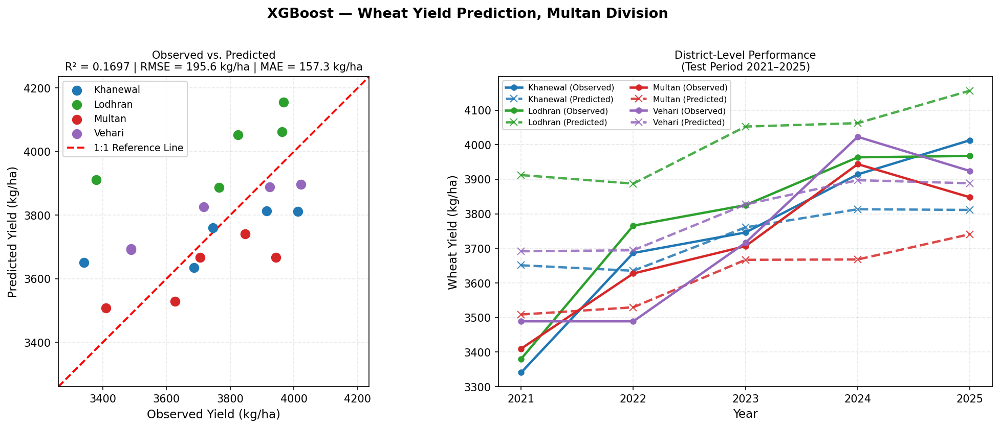

Caption: Figure. Observed vs. predicted wheat yield for the XGBoost model across Multan Division (test period: 2021–2025). Left: scatter plot with 1:1 reference line. Right: district-level temporal comparison. R² = 0.1697, RMSE = 195.6 kg/ha, MAE = 157.3 kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_ActPred_XGBoost.png
✓ XGBoost


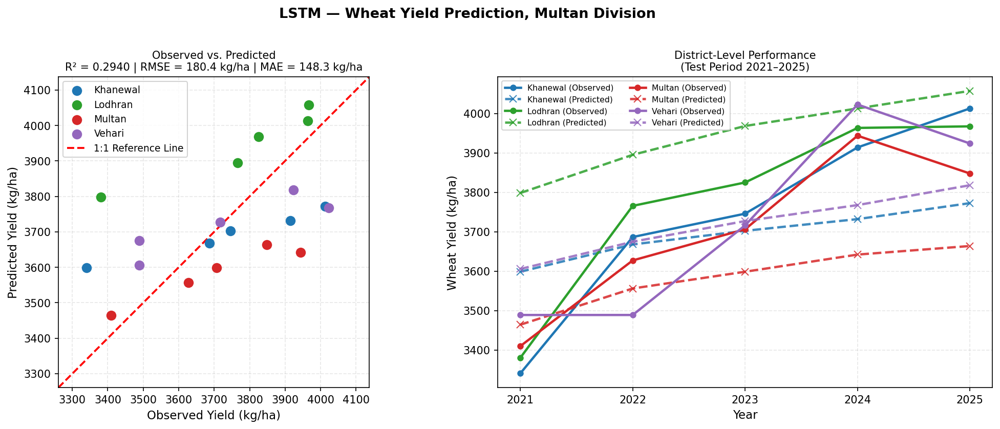

Caption: Figure. Observed vs. predicted wheat yield for the LSTM model across Multan Division (test period: 2021–2025). Left: scatter plot with 1:1 reference line. Right: district-level temporal comparison. R² = 0.2940, RMSE = 180.4 kg/ha, MAE = 148.3 kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_ActPred_LSTM.png
✓ LSTM


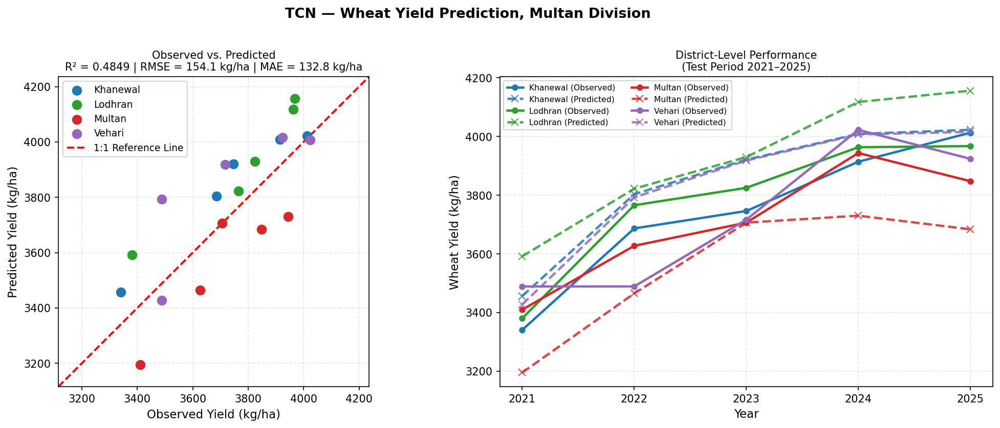

Caption: Figure. Observed vs. predicted wheat yield for the TCN model across Multan Division (test period: 2021–2025). Left: scatter plot with 1:1 reference line. Right: district-level temporal comparison. R² = 0.4849, RMSE = 154.1 kg/ha, MAE = 132.8 kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_ActPred_TCN.png
✓ TCN


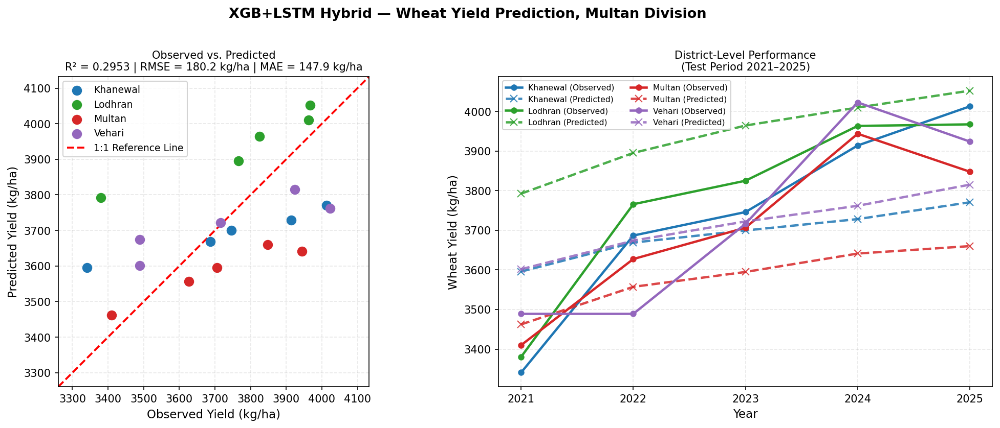

Caption: Figure. Observed vs. predicted wheat yield for the XGB+LSTM Hybrid model across Multan Division (test period: 2021–2025). Left: scatter plot with 1:1 reference line. Right: district-level temporal comparison. R² = 0.2953, RMSE = 180.2 kg/ha, MAE = 147.9 kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_ActPred_XGB_LSTM.png
✓ XGB+LSTM Hybrid


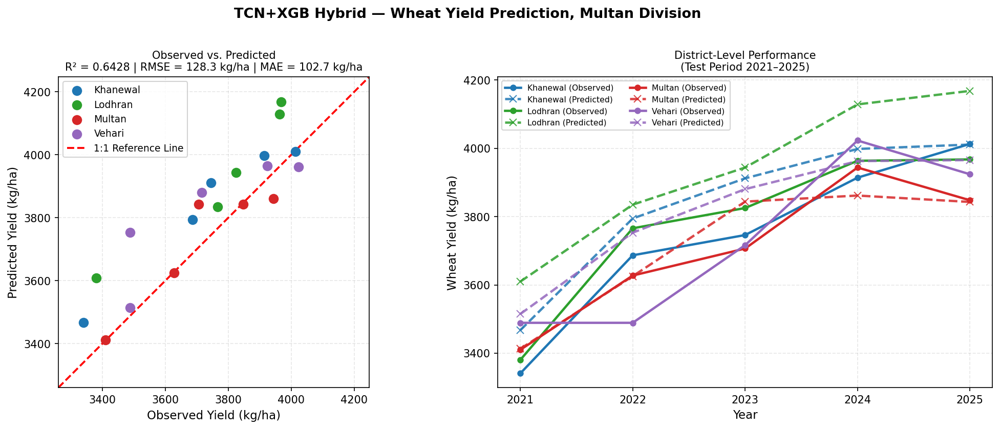

Caption: Figure. Observed vs. predicted wheat yield for the TCN+XGB Hybrid model across Multan Division (test period: 2021–2025). Left: scatter plot with 1:1 reference line. Right: district-level temporal comparison. R² = 0.6428, RMSE = 128.3 kg/ha, MAE = 102.7 kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_ActPred_TCN_XGB.png
✓ TCN+XGB Hybrid


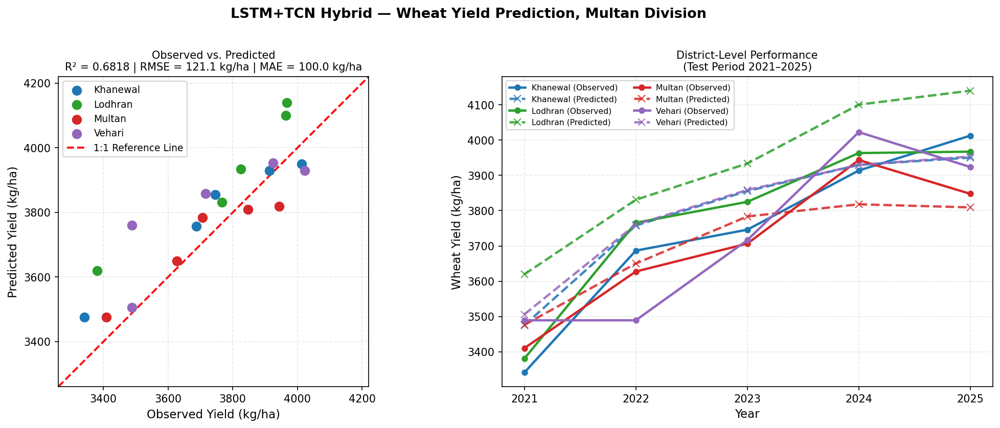

Caption: Figure. Observed vs. predicted wheat yield for the LSTM+TCN Hybrid model across Multan Division (test period: 2021–2025). Left: scatter plot with 1:1 reference line. Right: district-level temporal comparison. R² = 0.6818, RMSE = 121.1 kg/ha, MAE = 100.0 kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_ActPred_LSTM_TCN.png
✓ LSTM+TCN Hybrid


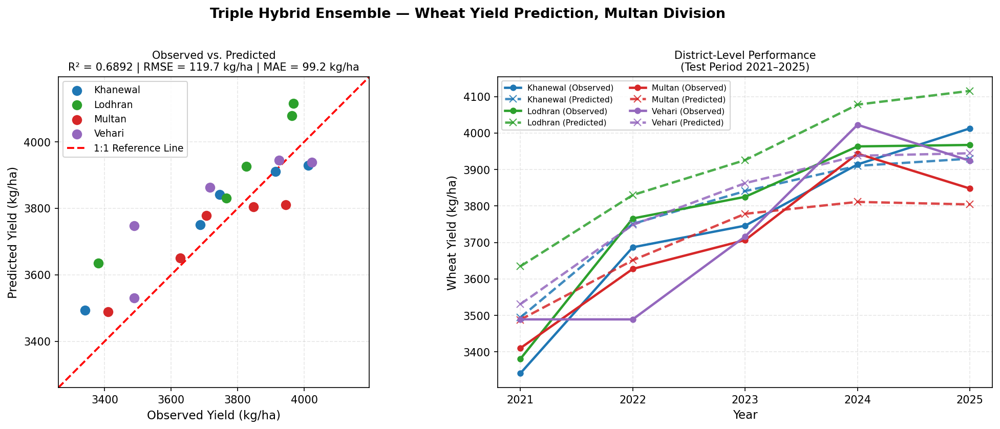

Caption: Figure. Observed vs. predicted wheat yield for the Triple Hybrid Ensemble model across Multan Division (test period: 2021–2025). Left: scatter plot with 1:1 reference line. Right: district-level temporal comparison. R² = 0.6892, RMSE = 119.7 kg/ha, MAE = 99.2 kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_ActPred_Triple.png
✓ Triple Hybrid Ensemble


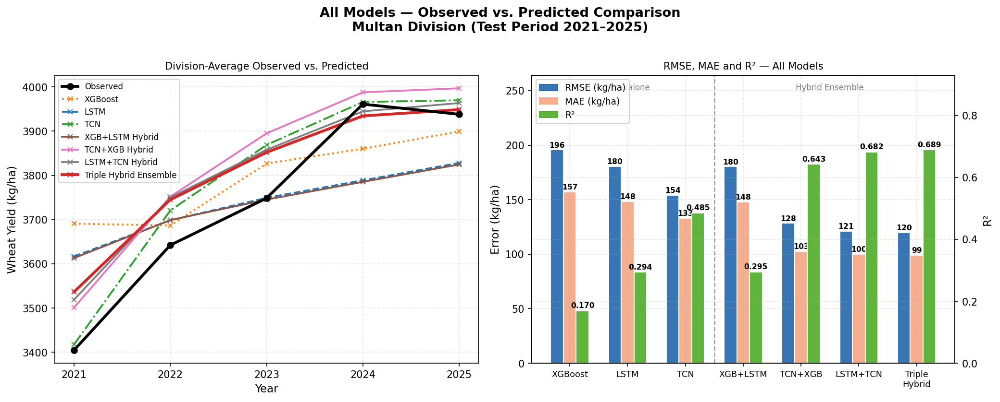

Caption: Figure. Performance comparison of all seven models (test period: 2021–2025). Left: division-average observed vs. predicted yield. Right: RMSE (blue), MAE (orange), and R² (green). Dashed line separates standalone from hybrid ensemble models.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_ActPred_AllModels_Comparison.png
✓ All-models comparison saved

Cell 5 complete ✓


In [ ]:
# ============================================================
# CELL 5 — ACTUAL vs PREDICTED (7 Individual + 1 Comparison)
# ============================================================

def plot_actual_vs_predicted(df, model_name, save_name):
    r2, rmse, mae = compute_metrics(df)

    fig, axes = plt.subplots(1, 2, figsize=(14, 5.5))
    fig.suptitle(
        f'{model_name} — Wheat Yield Prediction, Multan Division',
        fontsize=13, fontweight='bold', y=1.01
    )

    # ── Left: Scatter ─────────────────────────────────────────
    ax1 = axes[0]
    for dist in DISTRICTS:
        sub = df[df['District']==dist]
        ax1.scatter(sub['Actual'], sub['Predicted'],
                    color=DIST_COLORS[dist], s=70, zorder=3, label=dist)
    lim_min = df[['Actual','Predicted']].min().min() - 80
    lim_max = df[['Actual','Predicted']].max().max() + 80
    ax1.plot([lim_min,lim_max],[lim_min,lim_max],
             'r--', lw=1.8, label='1:1 Reference Line')
    ax1.set_xlim(lim_min, lim_max)
    ax1.set_ylim(lim_min, lim_max)
    ax1.set_xlabel(f'Observed Yield ({UNIT})')
    ax1.set_ylabel(f'Predicted Yield ({UNIT})')
    ax1.set_title(
        f'Observed vs. Predicted\n'
        f'R² = {r2:.4f} | RMSE = {rmse:.1f} {UNIT} | MAE = {mae:.1f} {UNIT}',
        fontsize=10)
    ax1.legend(fontsize=9, framealpha=0.85, loc='upper left')
    ax1.set_aspect('equal')

    # ── Right: Time series ────────────────────────────────────
    ax2 = axes[1]
    years = sorted(df['Year'].unique())
    for dist in DISTRICTS:
        sub = df[df['District']==dist].sort_values('Year')
        c = DIST_COLORS[dist]
        ax2.plot(sub['Year'], sub['Actual'],
                 color=c, lw=2.2, marker='o', ms=5)
        ax2.plot(sub['Year'], sub['Predicted'],
                 color=c, lw=2.2, marker='x', ms=7,
                 linestyle='--', alpha=0.85)

    handles = []
    for dist in DISTRICTS:
        handles.append(mlines.Line2D([],[],color=DIST_COLORS[dist],
                       lw=2.2,marker='o',ms=5,label=f'{dist} (Observed)'))
        handles.append(mlines.Line2D([],[],color=DIST_COLORS[dist],
                       lw=2.2,marker='x',ms=7,linestyle='--',
                       alpha=0.85,label=f'{dist} (Predicted)'))
    ax2.legend(handles=handles, fontsize=7.5, ncol=2,
               framealpha=0.85, loc='upper left')
    ax2.set_xlabel('Year')
    ax2.set_ylabel(f'Wheat Yield ({UNIT})')
    ax2.set_title('District-Level Performance\n(Test Period 2021–2025)', fontsize=10)
    ax2.set_xticks(years)

    plt.tight_layout()
    caption = (f'Figure. Observed vs. predicted wheat yield for the {model_name} model '
               f'across Multan Division (test period: 2021–2025). '
               f'Left: scatter plot with 1:1 reference line. '
               f'Right: district-level temporal comparison. '
               f'R² = {r2:.4f}, RMSE = {rmse:.1f} {UNIT}, MAE = {mae:.1f} {UNIT}.')
    save_fig(fig, save_name, caption)

# ── All 7 models ──────────────────────────────────────────────
all_models = [
    (xgb_pred,     'XGBoost',                'Fig_ActPred_XGBoost'),
    (lstm_pred,    'LSTM',                   'Fig_ActPred_LSTM'),
    (tcn_pred,     'TCN',                    'Fig_ActPred_TCN'),
    (xgblstm_pred, 'XGB+LSTM Hybrid',        'Fig_ActPred_XGB_LSTM'),
    (tcnxgb_pred,  'TCN+XGB Hybrid',         'Fig_ActPred_TCN_XGB'),
    (lstmtcn_pred, 'LSTM+TCN Hybrid',        'Fig_ActPred_LSTM_TCN'),
    (triple_pred,  'Triple Hybrid Ensemble', 'Fig_ActPred_Triple'),
]

for df, name, fname in all_models:
    plot_actual_vs_predicted(df, name, fname)
    print(f'✓ {name}')

# ── 8th Plot: All-Models Comparison ──────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5.5))
fig.suptitle(
    'All Models — Observed vs. Predicted Comparison\n'
    'Multan Division (Test Period 2021–2025)',
    fontsize=13, fontweight='bold', y=1.01
)

# Left: Division-average line plot
ax1 = axes[0]
years = [2021, 2022, 2023, 2024, 2025]
avg_actual = triple_pred.groupby('Year')['Actual'].mean()
ax1.plot(avg_actual.index, avg_actual.values,
         color='black', lw=2.8, marker='o', ms=6,
         label='Observed', zorder=5)
for df, name, _ in all_models:
    short = name.replace(' Hybrid','').replace(' Ensemble','')
    avg_pred = df.groupby('Year')['Predicted'].mean()
    ax1.plot(avg_pred.index, avg_pred.values,
             color=MODEL_COLORS[short] if short in MODEL_COLORS else MODEL_COLORS.get(name, '#333333'),
             lw=MODEL_LW.get(name, 1.8),
             linestyle=MODEL_LINE_STYLES.get(name, '-'),
             marker='x', ms=5, label=name)
ax1.set_xlabel('Year', fontsize=11)
ax1.set_ylabel(f'Wheat Yield ({UNIT})', fontsize=11)
ax1.set_title('Division-Average Observed vs. Predicted', fontsize=10)
ax1.legend(fontsize=8, framealpha=0.85, loc='upper left')
ax1.set_xticks(years)

# Right: R², RMSE, MAE grouped bars
ax2  = axes[1]
ax2b = ax2.twinx()
short_names = ['XGBoost','LSTM','TCN','XGB+LSTM','TCN+XGB','LSTM+TCN','Triple\nHybrid']
colors_bar  = [MODEL_COLORS[n.replace('\n',' ')] if n.replace('\n',' ') in MODEL_COLORS
               else list(MODEL_COLORS.values())[i]
               for i,n in enumerate(short_names)]
r2_vals, rmse_vals, mae_vals = [], [], []
for df, name, _ in all_models:
    r2, rmse, mae = compute_metrics(df)
    r2_vals.append(r2); rmse_vals.append(rmse); mae_vals.append(mae)

x = np.arange(len(short_names))
w = 0.22
b_rmse = ax2.bar(x - w, rmse_vals, w, color=RMSE_COLOR, edgecolor='white', alpha=0.9, label=f'RMSE ({UNIT})')
b_mae  = ax2.bar(x,     mae_vals,  w, color=MAE_COLOR,  edgecolor='white', alpha=0.9, label=f'MAE ({UNIT})')
b_r2   = ax2b.bar(x+w,  r2_vals,  w, color=R2_COLOR,   edgecolor='white', alpha=0.9, label='R²')

for bar, val in zip(b_rmse, rmse_vals):
    ax2.text(bar.get_x()+bar.get_width()/2, bar.get_height()+1,
             f'{val:.0f}', ha='center', va='bottom', fontsize=7.5, fontweight='bold')
for bar, val in zip(b_mae, mae_vals):
    ax2.text(bar.get_x()+bar.get_width()/2, bar.get_height()+1,
             f'{val:.0f}', ha='center', va='bottom', fontsize=7.5, fontweight='bold')
for bar, val in zip(b_r2, r2_vals):
    ax2b.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.005,
              f'{val:.3f}', ha='center', va='bottom', fontsize=7.5, fontweight='bold')

ax2.set_ylabel(f'Error ({UNIT})', fontsize=11)
ax2b.set_ylabel('R²', fontsize=11)
ax2.set_ylim(0, max(rmse_vals)*1.35)
ax2b.set_ylim(0, max(r2_vals)*1.35)
ax2.set_xticks(x)
ax2.set_xticklabels(short_names, fontsize=8.5)
ax2.set_title('RMSE, MAE and R² — All Models', fontsize=10)
ax2.axvline(2.5, color='black', lw=1.2, linestyle='--', alpha=0.4)
ax2.text(1.0,  max(rmse_vals)*1.28, 'Standalone', ha='center', fontsize=8, color='gray')
ax2.text(4.5, max(rmse_vals)*1.28, 'Hybrid Ensemble', ha='center', fontsize=8, color='gray')
rmse_p = mpatches.Patch(color=RMSE_COLOR, alpha=0.9, label=f'RMSE ({UNIT})')
mae_p  = mpatches.Patch(color=MAE_COLOR,  alpha=0.9, label=f'MAE ({UNIT})')
r2_p   = mpatches.Patch(color=R2_COLOR,   alpha=0.9, label='R²')
ax2.legend(handles=[rmse_p, mae_p, r2_p], fontsize=9, framealpha=0.85, loc='upper left')

plt.tight_layout()
caption = ('Figure. Performance comparison of all seven models (test period: 2021–2025). '
           'Left: division-average observed vs. predicted yield. '
           'Right: RMSE (blue), MAE (orange), and R² (green). '
           'Dashed line separates standalone from hybrid ensemble models.')
save_fig(fig, 'Fig_ActPred_AllModels_Comparison', caption)
print('✓ All-models comparison saved')
print('\nCell 5 complete ✓')


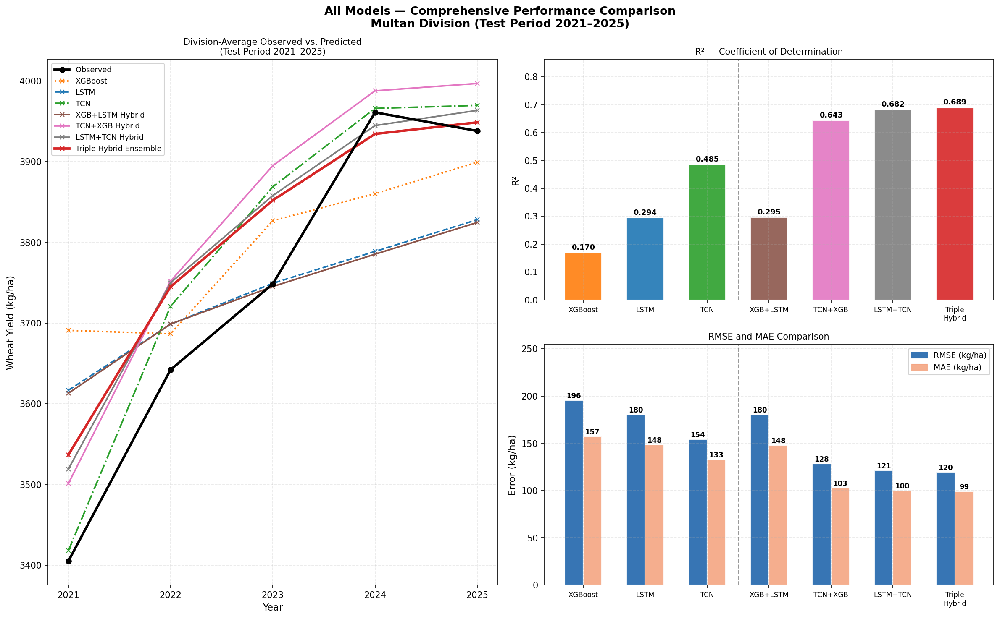

Caption: Figure. Comprehensive performance comparison of all seven models (test period: 2021–2025). Left: division-average observed vs. predicted yield trajectories. Top right: R² comparison. Bottom right: RMSE and MAE comparison. Dashed vertical line separates standalone from hybrid ensemble models.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_ActPred_AllModels_Comparison_3panel.png
✓ 3-panel comparison saved


In [ ]:
# ============================================================
# CELL 5B — ALTERNATIVE COMPARISON PLOT (3-panel layout)
# ============================================================

fig = plt.figure(figsize=(16, 10))
ax1  = fig.add_subplot(1, 2, 1)
ax2  = fig.add_subplot(2, 2, 2)
ax3  = fig.add_subplot(2, 2, 4)

fig.suptitle(
    'All Models — Comprehensive Performance Comparison\n'
    'Multan Division (Test Period 2021–2025)',
    fontsize=13, fontweight='bold'
)

# Left: Division-average line plot
years = [2021, 2022, 2023, 2024, 2025]
avg_actual = triple_pred.groupby('Year')['Actual'].mean()
ax1.plot(avg_actual.index, avg_actual.values,
         color='black', lw=2.8, marker='o', ms=6,
         label='Observed', zorder=5)
for df, name, _ in all_models:
    avg_pred = df.groupby('Year')['Predicted'].mean()
    key = name.replace(' Hybrid','').replace(' Ensemble','')
    col = MODEL_COLORS.get(key, MODEL_COLORS.get(name, '#333333'))
    ax1.plot(avg_pred.index, avg_pred.values,
             color=col, lw=MODEL_LW.get(name, 1.8),
             linestyle=MODEL_LINE_STYLES.get(name, '-'),
             marker='x', ms=5, label=name)
ax1.set_xlabel('Year', fontsize=11)
ax1.set_ylabel(f'Wheat Yield ({UNIT})', fontsize=11)
ax1.set_title('Division-Average Observed vs. Predicted\n(Test Period 2021–2025)', fontsize=10)
ax1.legend(fontsize=8.5, framealpha=0.85, loc='upper left')
ax1.set_xticks(years)

# Top right: R²
short_names = ['XGBoost','LSTM','TCN','XGB+LSTM','TCN+XGB','LSTM+TCN','Triple\nHybrid']
bar_colors  = list(MODEL_COLORS.values())
r2_vals, rmse_vals, mae_vals = [], [], []
for df, name, _ in all_models:
    r2, rmse, mae = compute_metrics(df)
    r2_vals.append(r2); rmse_vals.append(rmse); mae_vals.append(mae)

x = np.arange(len(short_names))
bars = ax2.bar(x, r2_vals, 0.6, color=bar_colors, edgecolor='white', alpha=0.9)
for bar, val in zip(bars, r2_vals):
    ax2.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.005,
             f'{val:.3f}', ha='center', va='bottom', fontsize=8.5, fontweight='bold')
ax2.set_ylabel('R²', fontsize=11)
ax2.set_ylim(0, max(r2_vals)*1.25)
ax2.set_xticks(x); ax2.set_xticklabels(short_names, fontsize=8)
ax2.set_title('R² — Coefficient of Determination', fontsize=10)
ax2.axvline(2.5, color='black', lw=1.2, linestyle='--', alpha=0.4)

# Bottom right: RMSE & MAE
w = 0.3
b1 = ax3.bar(x - w/2, rmse_vals, w, color=RMSE_COLOR, edgecolor='white', alpha=0.9, label=f'RMSE ({UNIT})')
b2 = ax3.bar(x + w/2, mae_vals,  w, color=MAE_COLOR,  edgecolor='white', alpha=0.9, label=f'MAE ({UNIT})')
for bar, val in zip(b1, rmse_vals):
    ax3.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.5,
             f'{val:.0f}', ha='center', va='bottom', fontsize=8, fontweight='bold')
for bar, val in zip(b2, mae_vals):
    ax3.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.5,
             f'{val:.0f}', ha='center', va='bottom', fontsize=8, fontweight='bold')
ax3.set_ylabel(f'Error ({UNIT})', fontsize=11)
ax3.set_ylim(0, max(rmse_vals)*1.3)
ax3.set_xticks(x); ax3.set_xticklabels(short_names, fontsize=8)
ax3.set_title(f'RMSE and MAE Comparison', fontsize=10)
ax3.axvline(2.5, color='black', lw=1.2, linestyle='--', alpha=0.4)
rmse_p = mpatches.Patch(color=RMSE_COLOR, alpha=0.9, label=f'RMSE ({UNIT})')
mae_p  = mpatches.Patch(color=MAE_COLOR,  alpha=0.9, label=f'MAE ({UNIT})')
ax3.legend(handles=[rmse_p, mae_p], fontsize=9, framealpha=0.85, loc='upper right')

plt.tight_layout()
caption = ('Figure. Comprehensive performance comparison of all seven models '
           '(test period: 2021–2025). '
           'Left: division-average observed vs. predicted yield trajectories. '
           'Top right: R² comparison. Bottom right: RMSE and MAE comparison. '
           'Dashed vertical line separates standalone from hybrid ensemble models.')
save_fig(fig, 'Fig_ActPred_AllModels_Comparison_3panel', caption)
print('✓ 3-panel comparison saved')


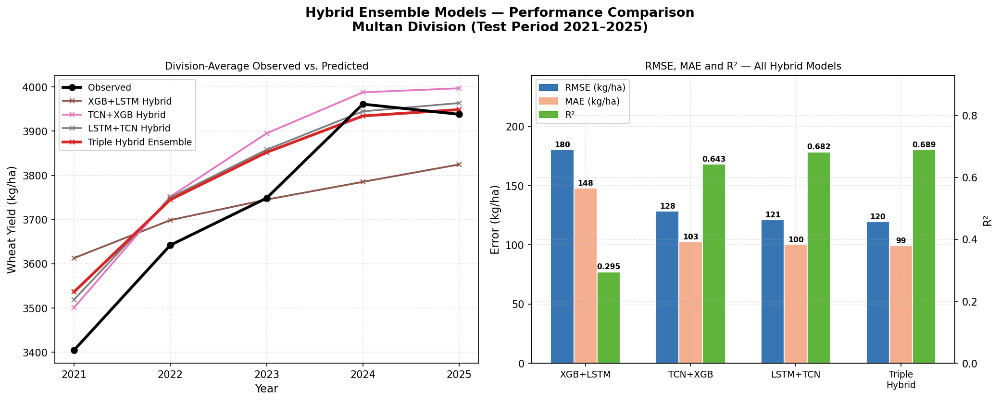

Caption: Figure. Hybrid ensemble model performance comparison (test period: 2021–2025). Left: division-average observed vs. predicted yield. Right: RMSE (blue), MAE (orange), and R² (green) computed on all 20 pooled district-year observations.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_ActPred_Hybrid_Comparisonn.png
✓ Cell 5D saved


In [ ]:
# ============================================================
# CELL 5D — HYBRID COMPARISON (correct RMSE/MAE values)
# ============================================================

hybrid_models = [
    (xgblstm_pred, 'XGB+LSTM Hybrid',        'XGB+LSTM'),
    (tcnxgb_pred,  'TCN+XGB Hybrid',         'TCN+XGB'),
    (lstmtcn_pred, 'LSTM+TCN Hybrid',        'LSTM+TCN'),
    (triple_pred,  'Triple Hybrid Ensemble', 'Triple\nHybrid'),
]

r2_vals, rmse_vals, mae_vals = [], [], []
for df, name, _ in hybrid_models:
    r2, rmse, mae = compute_metrics(df)   # pooled 20 obs — matches Table 2
    r2_vals.append(r2)
    rmse_vals.append(rmse)
    mae_vals.append(mae)

fig, axes = plt.subplots(1, 2, figsize=(14, 5.5))
fig.suptitle(
    'Hybrid Ensemble Models — Performance Comparison\n'
    'Multan Division (Test Period 2021–2025)',
    fontsize=13, fontweight='bold', y=1.01
)

# ── Left: Division-average line plot ──────────────────────────
ax1 = axes[0]
years = [2021, 2022, 2023, 2024, 2025]
avg_actual = triple_pred.groupby('Year')['Actual'].mean()
ax1.plot(avg_actual.index, avg_actual.values,
         color='black', lw=2.8, marker='o', ms=6,
         label='Observed', zorder=5)
for df, name, _ in hybrid_models:
    avg_pred = df.groupby('Year')['Predicted'].mean()
    key = name.replace(' Hybrid','').replace(' Ensemble','')
    col = MODEL_COLORS.get(key, MODEL_COLORS.get(name, '#333333'))
    ax1.plot(avg_pred.index, avg_pred.values,
             color=col,
             lw=MODEL_LW.get(name, 1.8),
             linestyle=MODEL_LINE_STYLES.get(name, '-'),
             marker='x', ms=5, label=name)
ax1.set_xlabel('Year', fontsize=11)
ax1.set_ylabel(f'Wheat Yield ({UNIT})', fontsize=11)
ax1.set_title('Division-Average Observed vs. Predicted', fontsize=10)
ax1.legend(fontsize=9, framealpha=0.85, loc='upper left')
ax1.set_xticks(years)

# ── Right: RMSE, MAE, R² grouped bars ─────────────────────────
ax2  = axes[1]
ax2b = ax2.twinx()
short_names = [label for _, _, label in hybrid_models]
x = np.arange(len(short_names))
w = 0.22

b_rmse = ax2.bar(x - w, rmse_vals, w,
                 color=RMSE_COLOR, edgecolor='white', alpha=0.9,
                 label=f'RMSE ({UNIT})')
b_mae  = ax2.bar(x,     mae_vals,  w,
                 color=MAE_COLOR,  edgecolor='white', alpha=0.9,
                 label=f'MAE ({UNIT})')
b_r2   = ax2b.bar(x + w, r2_vals, w,
                  color=R2_COLOR,  edgecolor='white', alpha=0.9,
                  label='R²')

for bar, val in zip(b_rmse, rmse_vals):
    ax2.text(bar.get_x() + bar.get_width()/2,
             bar.get_height() + 1,
             f'{val:.0f}', ha='center', va='bottom',
             fontsize=7.5, fontweight='bold')
for bar, val in zip(b_mae, mae_vals):
    ax2.text(bar.get_x() + bar.get_width()/2,
             bar.get_height() + 1,
             f'{val:.0f}', ha='center', va='bottom',
             fontsize=7.5, fontweight='bold')
for bar, val in zip(b_r2, r2_vals):
    ax2b.text(bar.get_x() + bar.get_width()/2,
              bar.get_height() + 0.005,
              f'{val:.3f}', ha='center', va='bottom',
              fontsize=7.5, fontweight='bold')

ax2.set_ylabel(f'Error ({UNIT})', fontsize=11)
ax2b.set_ylabel('R²', fontsize=11)
ax2.set_ylim(0, max(rmse_vals) * 1.35)
ax2b.set_ylim(0, max(r2_vals) * 1.35)
ax2.set_xticks(x)
ax2.set_xticklabels(short_names, fontsize=9)
ax2.set_title('RMSE, MAE and R² — All Hybrid Models', fontsize=10)

rmse_p = mpatches.Patch(color=RMSE_COLOR, alpha=0.9, label=f'RMSE ({UNIT})')
mae_p  = mpatches.Patch(color=MAE_COLOR,  alpha=0.9, label=f'MAE ({UNIT})')
r2_p   = mpatches.Patch(color=R2_COLOR,   alpha=0.9, label='R²')
ax2.legend(handles=[rmse_p, mae_p, r2_p], fontsize=9,
           framealpha=0.85, loc='upper left')

plt.tight_layout()

caption = (
    'Figure. Hybrid ensemble model performance comparison '
    '(test period: 2021–2025). '
    'Left: division-average observed vs. predicted yield. '
    'Right: RMSE (blue), MAE (orange), and R² (green) '
    'computed on all 20 pooled district-year observations.'
)
save_fig(fig, 'Fig_ActPred_Hybrid_Comparisonn', caption)
print('✓ Cell 5D saved')

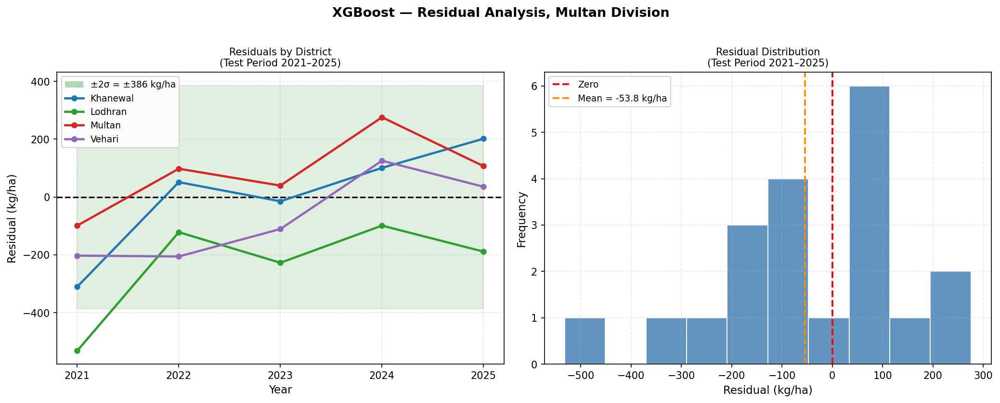

Caption: Figure. Residual analysis for the XGBoost model (test period: 2021–2025). Left: temporal residuals by district with ±2σ band (±386 kg/ha). Right: residual frequency distribution. Mean residual = -53.8 kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Residuals_XGBoost.png
✓ XGBoost


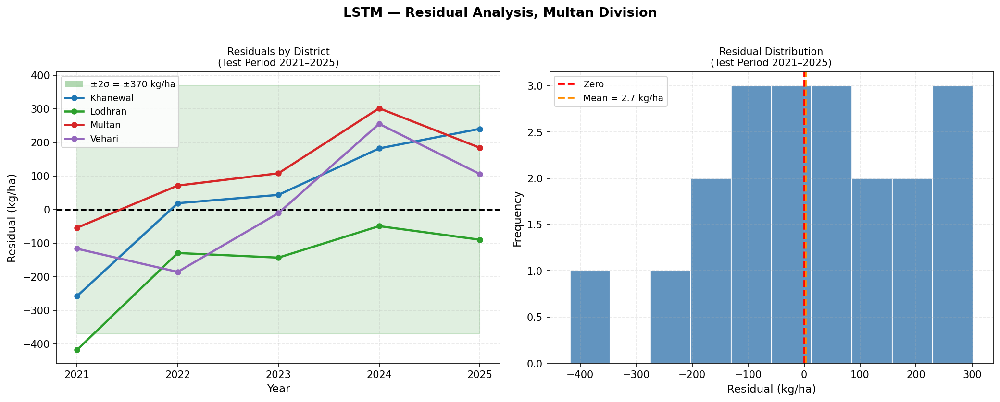

Caption: Figure. Residual analysis for the LSTM model (test period: 2021–2025). Left: temporal residuals by district with ±2σ band (±370 kg/ha). Right: residual frequency distribution. Mean residual = 2.7 kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Residuals_LSTM.png
✓ LSTM


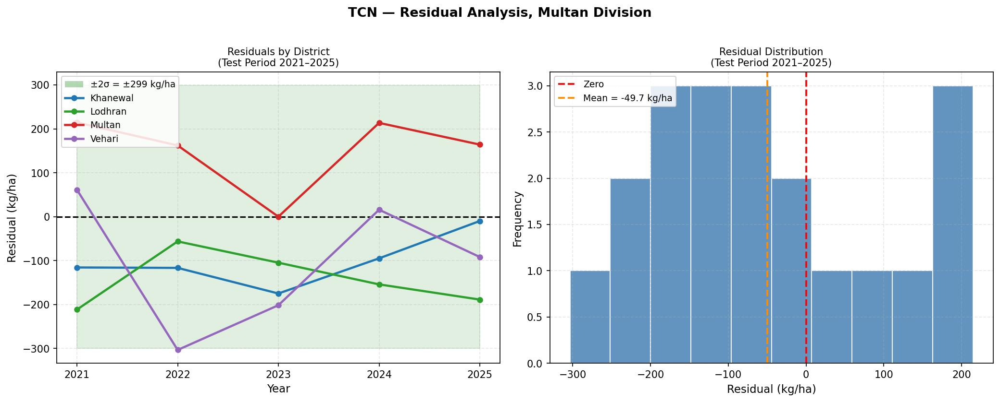

Caption: Figure. Residual analysis for the TCN model (test period: 2021–2025). Left: temporal residuals by district with ±2σ band (±299 kg/ha). Right: residual frequency distribution. Mean residual = -49.7 kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Residuals_TCN.png
✓ TCN


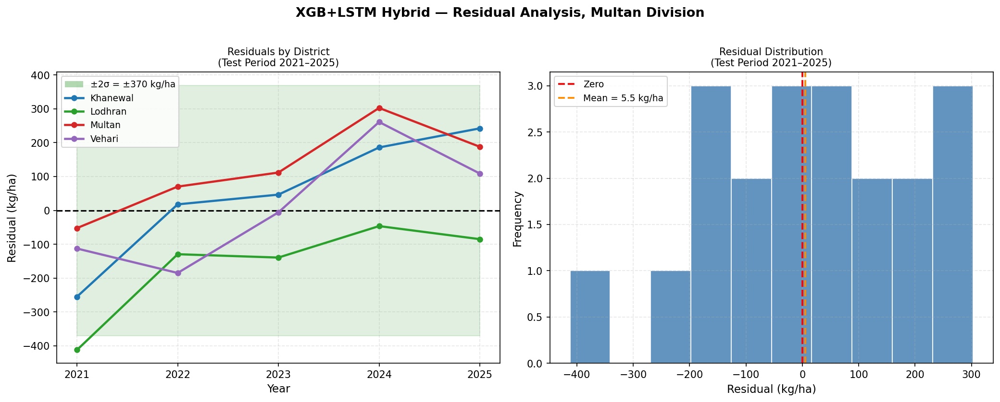

Caption: Figure. Residual analysis for the XGB+LSTM Hybrid model (test period: 2021–2025). Left: temporal residuals by district with ±2σ band (±370 kg/ha). Right: residual frequency distribution. Mean residual = 5.5 kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Residuals_XGB_LSTM.png
✓ XGB+LSTM Hybrid


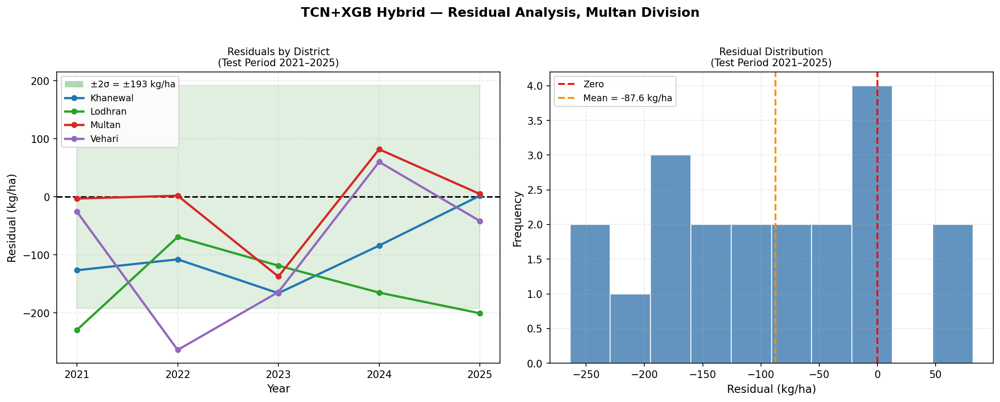

Caption: Figure. Residual analysis for the TCN+XGB Hybrid model (test period: 2021–2025). Left: temporal residuals by district with ±2σ band (±193 kg/ha). Right: residual frequency distribution. Mean residual = -87.6 kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Residuals_TCN_XGB.png
✓ TCN+XGB Hybrid


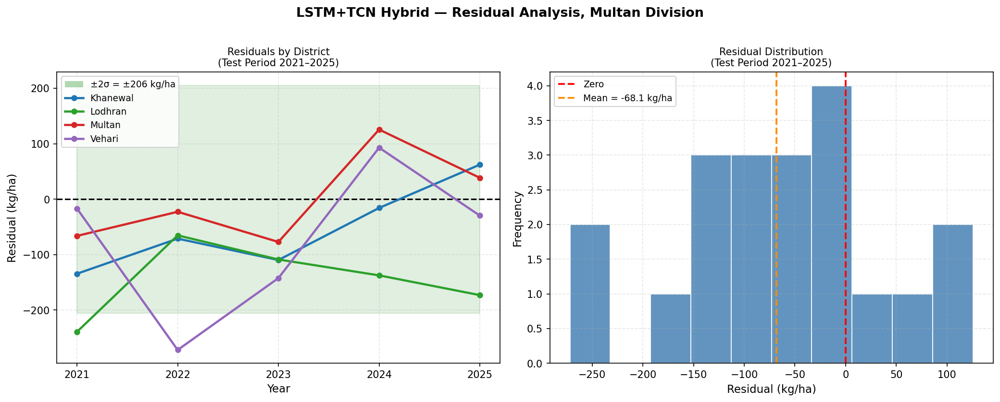

Caption: Figure. Residual analysis for the LSTM+TCN Hybrid model (test period: 2021–2025). Left: temporal residuals by district with ±2σ band (±206 kg/ha). Right: residual frequency distribution. Mean residual = -68.1 kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Residuals_LSTM_TCN.png
✓ LSTM+TCN Hybrid


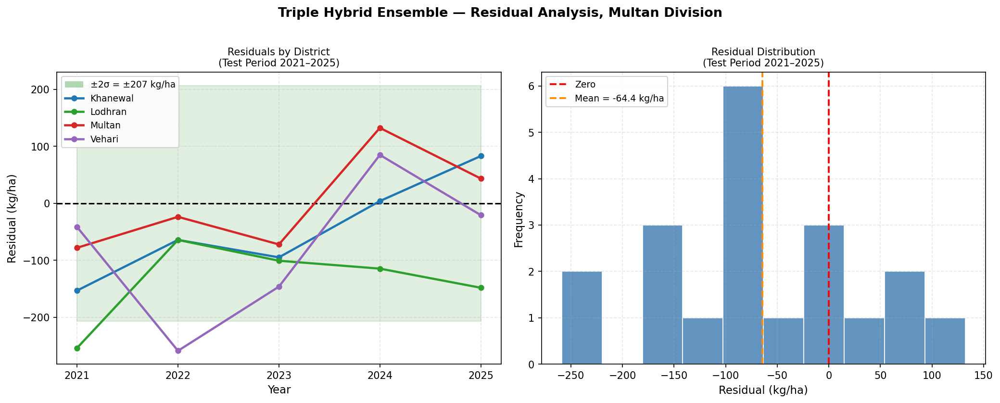

Caption: Figure. Residual analysis for the Triple Hybrid Ensemble model (test period: 2021–2025). Left: temporal residuals by district with ±2σ band (±207 kg/ha). Right: residual frequency distribution. Mean residual = -64.4 kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Residuals_Triple.png
✓ Triple Hybrid Ensemble


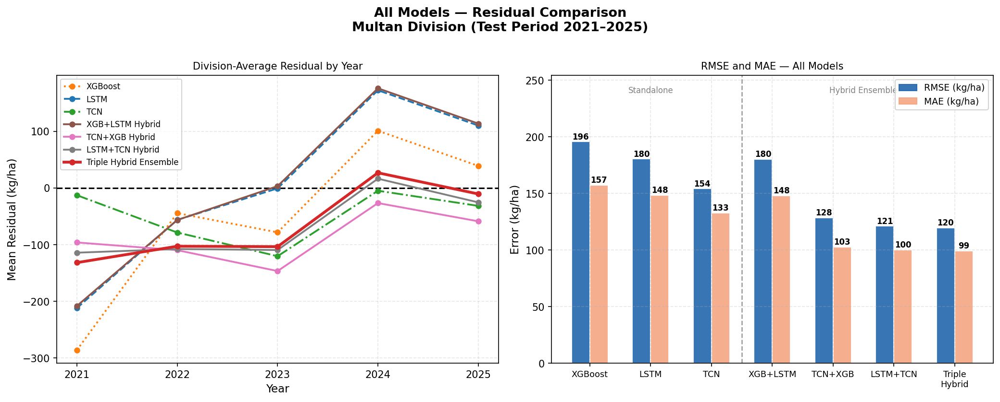

Caption: Figure. Residual comparison across all seven models (test period: 2021–2025). Left: division-average residual trajectories by year. Right: RMSE (blue) and MAE (orange) for all models. Dashed vertical line separates standalone from hybrid ensemble models.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Residuals_AllModels_Comparison.png
✓ All-models residual comparison saved

Cell 6 complete ✓


In [ ]:
# ============================================================
# CELL 6 — RESIDUAL PLOTS (7 Individual + 1 Comparison)
# ============================================================

def plot_residuals(df, model_name, save_name):
    df = df.copy()
    df['Residual'] = df['Actual'] - df['Predicted']
    mean_res = df['Residual'].mean()
    band = 2 * df['Residual'].std()

    fig, axes = plt.subplots(1, 2, figsize=(14, 5.5))
    fig.suptitle(
        f'{model_name} — Residual Analysis, Multan Division',
        fontsize=13, fontweight='bold', y=1.01
    )

    # Left: Residuals over time
    ax1 = axes[0]
    years = sorted(df['Year'].unique())
    ax1.axhline(0, color='black', lw=1.5, linestyle='--', zorder=2)
    ax1.fill_between(years, -band, band, alpha=0.12, color='green')
    for dist in DISTRICTS:
        sub = df[df['District']==dist].sort_values('Year')
        ax1.plot(sub['Year'], sub['Residual'],
                 color=DIST_COLORS[dist], lw=2.2, marker='o', ms=5, label=dist)
    band_patch = mpatches.Patch(facecolor='green', alpha=0.3,
                                label=f'±2σ = ±{band:.0f} {UNIT}')
    handles, labels = ax1.get_legend_handles_labels()
    ax1.legend(handles=[band_patch]+handles,
               labels=[f'±2σ = ±{band:.0f} {UNIT}']+labels,
               fontsize=9, framealpha=0.85, loc='upper left')
    ax1.set_xlabel('Year')
    ax1.set_ylabel(f'Residual ({UNIT})')
    ax1.set_title('Residuals by District\n(Test Period 2021–2025)', fontsize=10)
    ax1.set_xticks(years)

    # Right: Histogram
    ax2 = axes[1]
    ax2.hist(df['Residual'], bins=10, color='steelblue', edgecolor='white', alpha=0.85)
    ax2.axvline(0, color='red', lw=1.8, linestyle='--', label='Zero')
    ax2.axvline(mean_res, color='darkorange', lw=1.8, linestyle='--',
                label=f'Mean = {mean_res:.1f} {UNIT}')
    ax2.set_xlabel(f'Residual ({UNIT})')
    ax2.set_ylabel('Frequency')
    ax2.set_title('Residual Distribution\n(Test Period 2021–2025)', fontsize=10)
    ax2.legend(fontsize=9, framealpha=0.85, loc='upper left')

    plt.tight_layout()
    caption = (f'Figure. Residual analysis for the {model_name} model '
               f'(test period: 2021–2025). '
               f'Left: temporal residuals by district with ±2σ band (±{band:.0f} {UNIT}). '
               f'Right: residual frequency distribution. '
               f'Mean residual = {mean_res:.1f} {UNIT}.')
    save_fig(fig, save_name, caption)

# Generate for all 7 models
for df, name, fname in all_models:
    fname_r = fname.replace('ActPred', 'Residuals')
    plot_residuals(df, name, fname_r)
    print(f'✓ {name}')

# ── 8th Plot: All-Models Residual Comparison ─────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5.5))
fig.suptitle(
    'All Models — Residual Comparison\n'
    'Multan Division (Test Period 2021–2025)',
    fontsize=13, fontweight='bold', y=1.01
)

# Left: Mean residual by year
ax1 = axes[0]
ax1.axhline(0, color='black', lw=1.5, linestyle='--', zorder=2)
for df, name, _ in all_models:
    df2 = df.copy()
    df2['Residual'] = df2['Actual'] - df2['Predicted']
    mean_yr = df2.groupby('Year')['Residual'].mean()
    key = name.replace(' Hybrid','').replace(' Ensemble','')
    col = MODEL_COLORS.get(key, MODEL_COLORS.get(name, '#333333'))
    ax1.plot(mean_yr.index, mean_yr.values,
             color=col, lw=MODEL_LW.get(name, 1.8),
             linestyle=MODEL_LINE_STYLES.get(name, '-'),
             marker='o', ms=5, label=name)
ax1.set_xlabel('Year', fontsize=11)
ax1.set_ylabel(f'Mean Residual ({UNIT})', fontsize=11)
ax1.set_title('Division-Average Residual by Year', fontsize=10)
ax1.legend(fontsize=8, framealpha=0.85, loc='upper left')
ax1.set_xticks([2021,2022,2023,2024,2025])

# Right: RMSE & MAE bars
ax2 = axes[1]
short_names = ['XGBoost','LSTM','TCN','XGB+LSTM','TCN+XGB','LSTM+TCN','Triple\nHybrid']
rmse_vals, mae_vals = [], []
for df, name, _ in all_models:
    _, rmse, mae = compute_metrics(df)
    rmse_vals.append(rmse); mae_vals.append(mae)

x = np.arange(len(short_names))
w = 0.3
b1 = ax2.bar(x - w/2, rmse_vals, w, color=RMSE_COLOR, edgecolor='white', alpha=0.9, label=f'RMSE ({UNIT})')
b2 = ax2.bar(x + w/2, mae_vals,  w, color=MAE_COLOR,  edgecolor='white', alpha=0.9, label=f'MAE ({UNIT})')
for bar, val in zip(b1, rmse_vals):
    ax2.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.5,
             f'{val:.0f}', ha='center', va='bottom', fontsize=8, fontweight='bold')
for bar, val in zip(b2, mae_vals):
    ax2.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.5,
             f'{val:.0f}', ha='center', va='bottom', fontsize=8, fontweight='bold')
ax2.set_ylabel(f'Error ({UNIT})', fontsize=11)
ax2.set_ylim(0, max(rmse_vals)*1.3)
ax2.set_xticks(x); ax2.set_xticklabels(short_names, fontsize=8.5)
ax2.set_title('RMSE and MAE — All Models', fontsize=10)
ax2.axvline(2.5, color='black', lw=1.2, linestyle='--', alpha=0.4)
ax2.text(1.0,  max(rmse_vals)*1.22, 'Standalone', ha='center', fontsize=8, color='gray')
ax2.text(4.5, max(rmse_vals)*1.22, 'Hybrid Ensemble', ha='center', fontsize=8, color='gray')
rmse_p = mpatches.Patch(color=RMSE_COLOR, alpha=0.9, label=f'RMSE ({UNIT})')
mae_p  = mpatches.Patch(color=MAE_COLOR,  alpha=0.9, label=f'MAE ({UNIT})')
ax2.legend(handles=[rmse_p, mae_p], fontsize=9, framealpha=0.85, loc='upper right')

plt.tight_layout()
caption = ('Figure. Residual comparison across all seven models (test period: 2021–2025). '
           'Left: division-average residual trajectories by year. '
           'Right: RMSE (blue) and MAE (orange) for all models. '
           'Dashed vertical line separates standalone from hybrid ensemble models.')
save_fig(fig, 'Fig_Residuals_AllModels_Comparison', caption)
print('✓ All-models residual comparison saved')
print('\nCell 6 complete ✓')


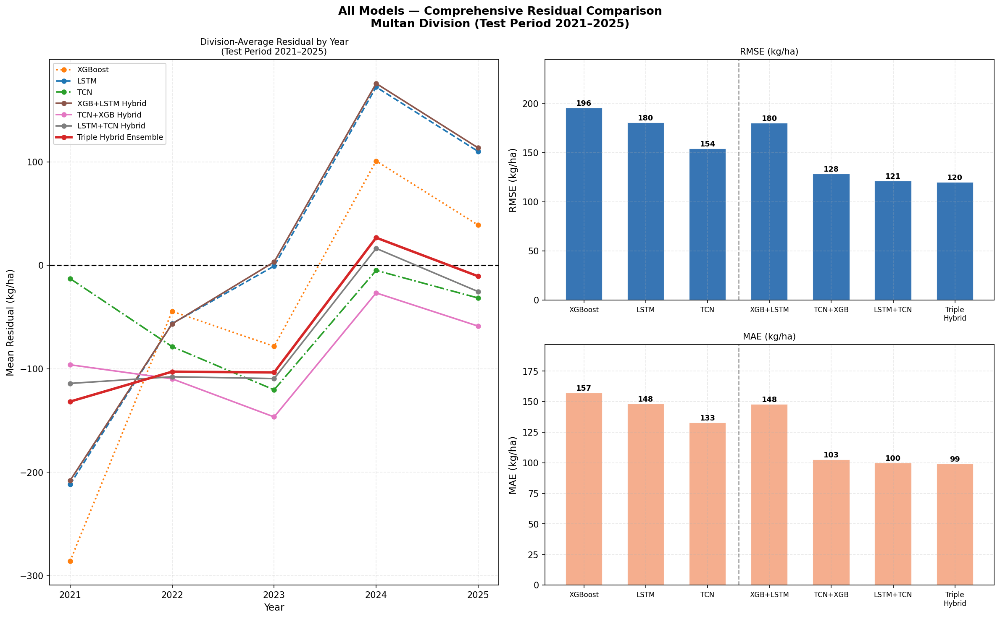

Caption: Figure. Comprehensive residual comparison of all seven models (test period: 2021–2025). Left: division-average residuals over time. Top right: RMSE. Bottom right: MAE. All metrics in kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Residuals_AllModels_Comparison_3panel.png
✓ 3-panel residual comparison saved


In [ ]:
# ============================================================
# CELL 6B — ALTERNATIVE RESIDUAL COMPARISON (3-panel)
# ============================================================

fig = plt.figure(figsize=(16, 10))
ax1 = fig.add_subplot(1, 2, 1)
ax2 = fig.add_subplot(2, 2, 2)
ax3 = fig.add_subplot(2, 2, 4)

fig.suptitle(
    'All Models — Comprehensive Residual Comparison\n'
    'Multan Division (Test Period 2021–2025)',
    fontsize=13, fontweight='bold'
)

# Left: mean residual by year
ax1.axhline(0, color='black', lw=1.5, linestyle='--', zorder=2)
for df, name, _ in all_models:
    df2 = df.copy()
    df2['Residual'] = df2['Actual'] - df2['Predicted']
    mean_yr = df2.groupby('Year')['Residual'].mean()
    key = name.replace(' Hybrid','').replace(' Ensemble','')
    col = MODEL_COLORS.get(key, MODEL_COLORS.get(name,'#333333'))
    ax1.plot(mean_yr.index, mean_yr.values,
             color=col, lw=MODEL_LW.get(name,1.8),
             linestyle=MODEL_LINE_STYLES.get(name,'-'),
             marker='o', ms=5, label=name)
ax1.set_xlabel('Year',fontsize=11)
ax1.set_ylabel(f'Mean Residual ({UNIT})',fontsize=11)
ax1.set_title('Division-Average Residual by Year\n(Test Period 2021–2025)',fontsize=10)
ax1.legend(fontsize=8.5, framealpha=0.85, loc='upper left')
ax1.set_xticks([2021,2022,2023,2024,2025])

# Top right: RMSE bars
short_names = ['XGBoost','LSTM','TCN','XGB+LSTM','TCN+XGB','LSTM+TCN','Triple\nHybrid']
bar_colors  = list(MODEL_COLORS.values())
rmse_vals, mae_vals = [], []
for df, name, _ in all_models:
    _, rmse, mae = compute_metrics(df)
    rmse_vals.append(rmse); mae_vals.append(mae)

x = np.arange(len(short_names))
bars = ax2.bar(x, rmse_vals, 0.6, color=RMSE_COLOR, edgecolor='white', alpha=0.9)
for bar, val in zip(bars, rmse_vals):
    ax2.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.5,
             f'{val:.0f}', ha='center', va='bottom', fontsize=8.5, fontweight='bold')
ax2.set_ylabel(f'RMSE ({UNIT})',fontsize=11)
ax2.set_ylim(0, max(rmse_vals)*1.25)
ax2.set_xticks(x); ax2.set_xticklabels(short_names, fontsize=8)
ax2.set_title(f'RMSE ({UNIT})',fontsize=10)
ax2.axvline(2.5, color='black', lw=1.2, linestyle='--', alpha=0.4)

# Bottom right: MAE bars
bars = ax3.bar(x, mae_vals, 0.6, color=MAE_COLOR, edgecolor='white', alpha=0.9)
for bar, val in zip(bars, mae_vals):
    ax3.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.5,
             f'{val:.0f}', ha='center', va='bottom', fontsize=8.5, fontweight='bold')
ax3.set_ylabel(f'MAE ({UNIT})',fontsize=11)
ax3.set_ylim(0, max(mae_vals)*1.25)
ax3.set_xticks(x); ax3.set_xticklabels(short_names, fontsize=8)
ax3.set_title(f'MAE ({UNIT})',fontsize=10)
ax3.axvline(2.5, color='black', lw=1.2, linestyle='--', alpha=0.4)

plt.tight_layout()
caption = ('Figure. Comprehensive residual comparison of all seven models '
           '(test period: 2021–2025). '
           'Left: division-average residuals over time. '
           'Top right: RMSE. Bottom right: MAE. '
           f'All metrics in {UNIT}.')
save_fig(fig, 'Fig_Residuals_AllModels_Comparison_3panel', caption)
print('✓ 3-panel residual comparison saved')


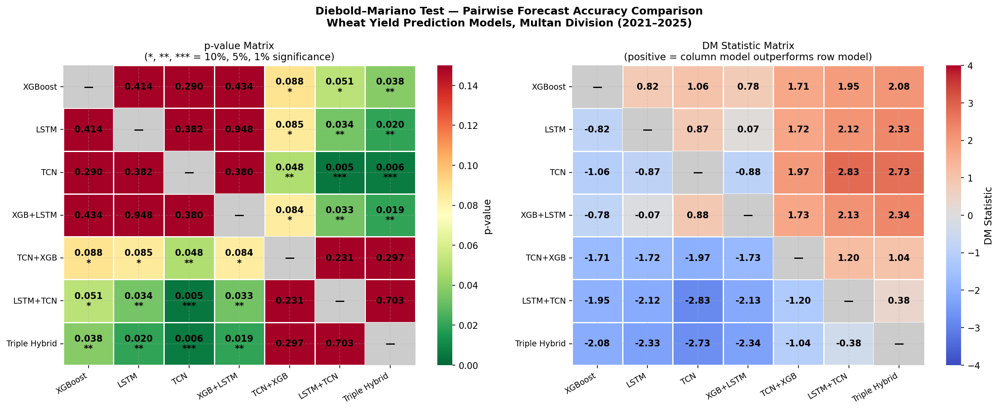

Caption: Figure. Diebold–Mariano (DM) pairwise test results for all seven models. Left: p-value matrix (*, **, *** denote significance at 10%, 5%, and 1%). Right: DM statistic matrix (positive values indicate the column model outperforms the row model).
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_DM_Test_Heatmap.png
✓ DM heatmap saved


In [ ]:
# ============================================================
# CELL 7 — DM TEST HEATMAP
# ============================================================

DM_NAME_MAP = {
    'XGBoost':'XGBoost','LSTM':'LSTM','TCN':'TCN',
    'XGB+LSTM Hybrid':'XGB+LSTM','TCN+XGB Hybrid':'TCN+XGB',
    'LSTM+TCN Hybrid':'LSTM+TCN','Triple Hybrid Ensemble':'Triple Hybrid',
    'XGB+LSTM':'XGB+LSTM','TCN+XGB':'TCN+XGB','LSTM+TCN':'LSTM+TCN',
    'Triple':'Triple Hybrid','SERWI Triple':'Triple Hybrid',
    'SERWI XGB+LSTM':'XGB+LSTM','SERWI TCN+XGB':'TCN+XGB',
    'SERWI LSTM+TCN':'LSTM+TCN',
}

dm = dm_results.copy()
dm['Benchmark']  = dm['Benchmark'].map(DM_NAME_MAP).fillna(dm['Benchmark'])
dm['Challenger'] = dm['Challenger'].map(DM_NAME_MAP).fillna(dm['Challenger'])
DM_LABELS = ['XGBoost','LSTM','TCN','XGB+LSTM','TCN+XGB','LSTM+TCN','Triple Hybrid']
n = len(DM_LABELS)

pval_matrix = pd.DataFrame(np.nan, index=DM_LABELS, columns=DM_LABELS)
stat_matrix = pd.DataFrame(np.nan, index=DM_LABELS, columns=DM_LABELS)
for _, row in dm.iterrows():
    b, c = row['Benchmark'], row['Challenger']
    if b in DM_LABELS and c in DM_LABELS:
        pval_matrix.loc[b,c] = row['p_value']
        pval_matrix.loc[c,b] = row['p_value']
        stat_matrix.loc[b,c] = row['DM_Statistic']
        stat_matrix.loc[c,b] = -row['DM_Statistic']

fig, axes = plt.subplots(1, 2, figsize=(16, 6.5))
fig.suptitle(
    'Diebold–Mariano Test — Pairwise Forecast Accuracy Comparison\n'
    'Wheat Yield Prediction Models, Multan Division (2021–2025)',
    fontsize=12, fontweight='bold'
)

# p-value matrix
ax1 = axes[0]
annot_pval = pd.DataFrame('', index=DM_LABELS, columns=DM_LABELS)
pval_plot  = pval_matrix.copy()
for i,b in enumerate(DM_LABELS):
    for j,c in enumerate(DM_LABELS):
        if i==j:
            annot_pval.loc[b,c]='—'; pval_plot.loc[b,c]=np.nan
        elif not np.isnan(pval_matrix.loc[b,c]):
            p = pval_matrix.loc[b,c]
            stars = '***' if p<0.01 else ('**' if p<0.05 else ('*' if p<0.10 else ''))
            annot_pval.loc[b,c] = f'{p:.3f}\n{stars}' if stars else f'{p:.3f}'
        else:
            annot_pval.loc[b,c]=''

sns.heatmap(pval_plot.astype(float), ax=ax1, cmap='RdYlGn_r', vmin=0, vmax=0.15,
            annot=annot_pval, fmt='',
            annot_kws={'size':10,'color':'black','weight':'bold'},
            linewidths=0.5, linecolor='white',
            xticklabels=DM_LABELS, yticklabels=DM_LABELS,
            cbar_kws={'label':'p-value'}, mask=pval_plot.isnull())
for i in range(n):
    ax1.add_patch(plt.Rectangle((i,i),1,1,fill=True,color='#cccccc',lw=0))
    ax1.text(i+0.5,i+0.5,'—',ha='center',va='center',fontsize=11,color='black',fontweight='bold')
ax1.set_title('p-value Matrix\n(*, **, *** = 10%, 5%, 1% significance)', fontsize=11)
ax1.set_xticklabels(DM_LABELS, rotation=30, ha='right', fontsize=9)
ax1.set_yticklabels(DM_LABELS, rotation=0, fontsize=9)

# DM statistic matrix
ax2 = axes[1]
annot_stat = pd.DataFrame('', index=DM_LABELS, columns=DM_LABELS)
stat_plot  = stat_matrix.copy()
for i,b in enumerate(DM_LABELS):
    for j,c in enumerate(DM_LABELS):
        if i==j:
            annot_stat.loc[b,c]='—'; stat_plot.loc[b,c]=np.nan
        elif not np.isnan(stat_matrix.loc[b,c]):
            annot_stat.loc[b,c]=f'{stat_matrix.loc[b,c]:.2f}'
        else:
            annot_stat.loc[b,c]=''

sns.heatmap(stat_plot.astype(float), ax=ax2, cmap='coolwarm', center=0, vmin=-4, vmax=4,
            annot=annot_stat, fmt='',
            annot_kws={'size':10,'color':'black','weight':'bold'},
            linewidths=0.5, linecolor='white',
            xticklabels=DM_LABELS, yticklabels=DM_LABELS,
            cbar_kws={'label':'DM Statistic'}, mask=stat_plot.isnull())
for i in range(n):
    ax2.add_patch(plt.Rectangle((i,i),1,1,fill=True,color='#cccccc',lw=0))
    ax2.text(i+0.5,i+0.5,'—',ha='center',va='center',fontsize=11,color='black',fontweight='bold')
ax2.set_title('DM Statistic Matrix\n(positive = column model outperforms row model)', fontsize=11)
ax2.set_xticklabels(DM_LABELS, rotation=30, ha='right', fontsize=9)
ax2.set_yticklabels(DM_LABELS, rotation=0, fontsize=9)

plt.tight_layout()
caption = ('Figure. Diebold–Mariano (DM) pairwise test results for all seven models. '
           'Left: p-value matrix (*, **, *** denote significance at 10%, 5%, and 1%). '
           'Right: DM statistic matrix (positive values indicate the column model '
           'outperforms the row model).')
save_fig(fig, 'Fig_DM_Test_Heatmap', caption)
print('✓ DM heatmap saved')


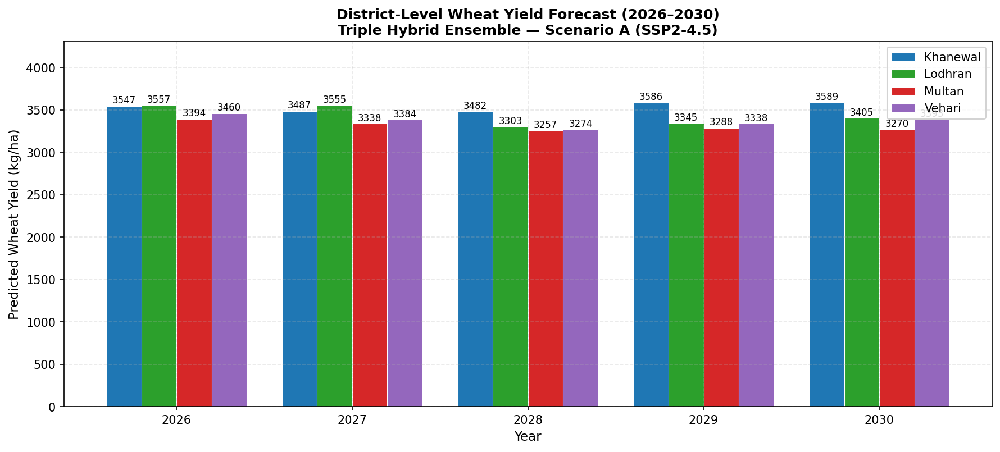

Caption: Figure. Projected district-level wheat yield (2026–2030) using the Triple Hybrid Ensemble under Scenario A (SSP2-4.5, moderate emissions). Yield values are expressed in kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Forecast_District_Bar.png
✓ Forecast bar chart saved


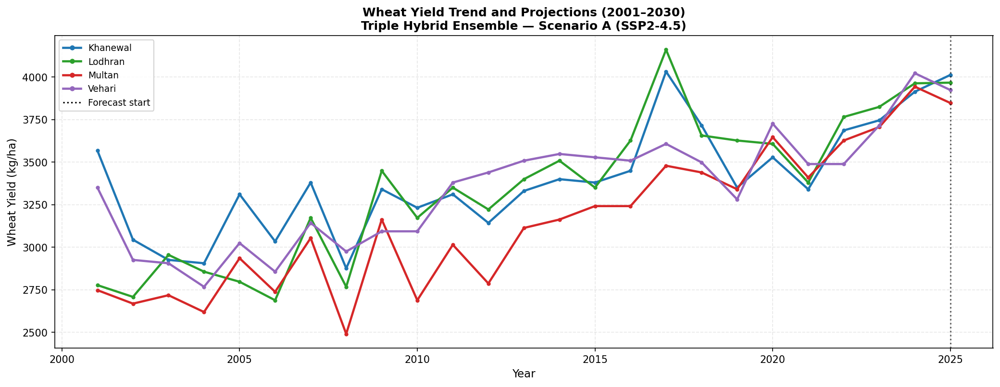

Caption: Figure. Historical (2001–2025) and projected (2026–2030) wheat yield for all four districts under Scenario A (SSP2-4.5). Solid lines represent historical observations; dashed lines represent model projections. Yield in kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Forecast_Full_Timeline.png
✓ Full timeline plot saved

Cell 8 complete ✓


In [ ]:
# ============================================================
# CELL 8 — FORECAST PLOTS
# ============================================================

# ── Bar chart: District-wise 2026-2030 ────────────────────────
scen_a = forecast_scenA[forecast_scenA['Scenario']=='ScenarioA_Primary'].copy()
years  = sorted(scen_a['Year'].unique())
x = np.arange(len(years))
width = 0.2

fig, ax = plt.subplots(figsize=(12, 5.5))
for i, dist in enumerate(DISTRICTS):
    vals = [scen_a[(scen_a['Year']==y)&(scen_a['District']==dist)]['SERWI_Triple'].values[0]
            for y in years]
    bars = ax.bar(x + i*width, vals, width,
                  color=DIST_COLORS[dist], label=dist, edgecolor='white', lw=0.5)
    for bar, val in zip(bars, vals):
        ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+5,
                f'{val:.0f}', ha='center', va='bottom', fontsize=8)

ax.set_xlabel('Year', fontsize=11)
ax.set_ylabel(f'Predicted Wheat Yield ({UNIT})', fontsize=11)
ax.set_title(
    'District-Level Wheat Yield Forecast (2026–2030)\n'
    'Triple Hybrid Ensemble — Scenario A (SSP2-4.5)',
    fontsize=12, fontweight='bold'
)
ax.set_xticks(x + width*1.5)
ax.set_xticklabels([str(y) for y in years])
ax.legend(fontsize=10, framealpha=0.85, loc='upper right')
ax.set_ylim(0, scen_a[DISTRICTS[0]].max()*1.2 if DISTRICTS[0] in scen_a.columns
            else scen_a['SERWI_Triple'].max()*1.2)

plt.tight_layout()
caption = ('Figure. Projected district-level wheat yield (2026–2030) using the '
           'Triple Hybrid Ensemble under Scenario A (SSP2-4.5, moderate emissions). '
           f'Yield values are expressed in {UNIT}.')
save_fig(fig, 'Fig_Forecast_District_Bar', caption)
print('✓ Forecast bar chart saved')

# ── Line chart: Full timeline 2001-2030 ──────────────────────
fig, ax = plt.subplots(figsize=(14, 5.5))
for dist in DISTRICTS:
    sub_hist = full_timeline[
        (full_timeline['District']==dist) &
        (full_timeline['Scenario']=='Historical')
    ].sort_values('Year')
    sub_proj = full_timeline[
        (full_timeline['District']==dist) &
        (full_timeline['Scenario']!='Historical')
    ].sort_values('Year')

    ax.plot(sub_hist['Year'], sub_hist['Yield_kg_ha'],
            color=DIST_COLORS[dist], lw=2.2, marker='o', ms=3)
    if len(sub_proj) > 0:
        ax.plot(sub_proj['Year'], sub_proj['Yield_kg_ha'],
                color=DIST_COLORS[dist], lw=2.2, marker='o', ms=3,
                linestyle='--', alpha=0.85)

ax.axvline(2025, color='black', lw=1.5, linestyle=':', alpha=0.6,
           label='Forecast start (2026)')
handles = [mlines.Line2D([],[],color=DIST_COLORS[d],lw=2.2,marker='o',ms=4,label=d)
           for d in DISTRICTS]
handles.append(mlines.Line2D([],[],color='black',lw=1.5,linestyle=':',label='Forecast start'))
ax.legend(handles=handles, fontsize=9, framealpha=0.85, loc='upper left')
ax.set_xlabel('Year', fontsize=11)
ax.set_ylabel(f'Wheat Yield ({UNIT})', fontsize=11)
ax.set_title(
    'Wheat Yield Trend and Projections (2001–2030)\n'
    'Triple Hybrid Ensemble — Scenario A (SSP2-4.5)',
    fontsize=12, fontweight='bold'
)
plt.tight_layout()
caption = ('Figure. Historical (2001–2025) and projected (2026–2030) wheat yield '
           'for all four districts under Scenario A (SSP2-4.5). '
           'Solid lines represent historical observations; '
           f'dashed lines represent model projections. Yield in {UNIT}.')
save_fig(fig, 'Fig_Forecast_Full_Timeline', caption)
print('✓ Full timeline plot saved')
print('\nCell 8 complete ✓')



Model Performance Summary:
                 Model            Type     R²  RMSE (kg/ha)  MAE (kg/ha)
               XGBoost      Standalone 0.1697         195.6        157.3
                  LSTM      Standalone 0.2940         180.4        148.3
                   TCN      Standalone 0.4849         154.1        132.8
       XGB+LSTM Hybrid Hybrid Ensemble 0.2953         180.2        147.9
        TCN+XGB Hybrid Hybrid Ensemble 0.6428         128.3        102.7
       LSTM+TCN Hybrid Hybrid Ensemble 0.6818         121.1        100.0
Triple Hybrid Ensemble Hybrid Ensemble 0.6892         119.7         99.2


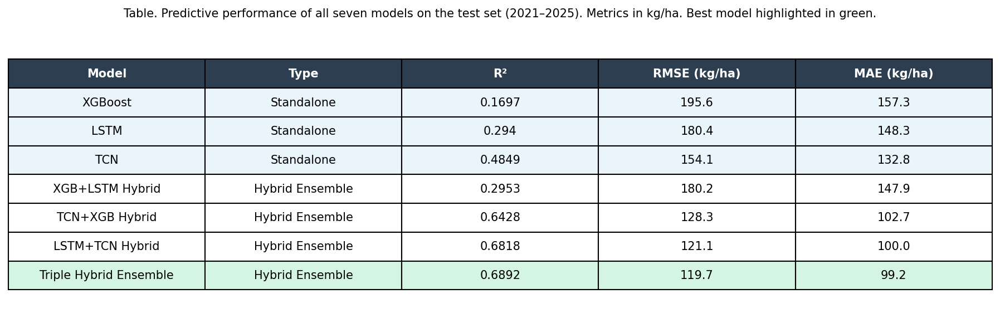

Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Performance_Summary_Table.png
✓ Summary table saved


In [ ]:
# ============================================================
# CELL 9 — PERFORMANCE SUMMARY TABLE (All 7 Models)
# ============================================================

summary_rows = []
for df, name, _ in all_models:
    r2, rmse, mae = compute_metrics(df)
    summary_rows.append({
        'Model': name,
        'Type': 'Standalone' if name in ['XGBoost','LSTM','TCN'] else 'Hybrid Ensemble',
        'R²': round(r2, 4),
        f'RMSE ({UNIT})': round(rmse, 1),
        f'MAE ({UNIT})':  round(mae, 1)
    })

summary_df = pd.DataFrame(summary_rows)
print('\nModel Performance Summary:')
print(summary_df.to_string(index=False))

fig, ax = plt.subplots(figsize=(12, 4))
ax.axis('off')
tbl = ax.table(
    cellText=summary_df.values,
    colLabels=summary_df.columns,
    cellLoc='center', loc='center'
)
tbl.auto_set_font_size(False)
tbl.set_fontsize(10)
tbl.scale(1.2, 1.9)

for j in range(len(summary_df.columns)):
    tbl[0,j].set_facecolor('#2c3e50')
    tbl[0,j].set_text_props(color='white', fontweight='bold')

best_idx = summary_df['R²'].idxmax()
for j in range(len(summary_df.columns)):
    tbl[best_idx+1, j].set_facecolor('#d5f5e3')

# Standalone rows — light blue
for i, row in summary_df.iterrows():
    if row['Type'] == 'Standalone':
        for j in range(len(summary_df.columns)):
            if tbl[i+1, j].get_facecolor() == (1,1,1,1) or tbl[i+1, j].get_facecolor()[0] == 1.0:
                tbl[i+1, j].set_facecolor('#eaf4fb')

ax.set_title(
    f'Table. Predictive performance of all seven models on the test set (2021–2025). '
    f'Metrics in {UNIT}. Best model highlighted in green.',
    fontsize=10, pad=15
)
plt.tight_layout()
save_fig(fig, 'Fig_Performance_Summary_Table')
print('✓ Summary table saved')


In [ ]:
# ============================================================
# CELL 10 — FINAL CHECK
# ============================================================
import os

files = sorted(os.listdir(OUTPUT))
print(f'Total plots saved to Drive: {len(files)}')
for f in files:
    print(f'  {f}')

print(f'\nAll plots saved to:\n{OUTPUT}')
print('\nDone ✓')


Total plots saved to Drive: 48
  Fig_ActPred_AllModels_Comparison.png
  Fig_ActPred_AllModels_Comparison_3panel.png
  Fig_ActPred_Hybrid_Comparison.png
  Fig_ActPred_Hybrid_Comparison1.png
  Fig_ActPred_Hybrid_Comparison2.png
  Fig_ActPred_Hybrid_Comparisonn.png
  Fig_ActPred_LSTM.png
  Fig_ActPred_LSTM_TCN.png
  Fig_ActPred_TCN.png
  Fig_ActPred_TCN_XGB.png
  Fig_ActPred_Triple.png
  Fig_ActPred_XGB_LSTM.png
  Fig_ActPred_XGBoost.png
  Fig_Choropleth_3panel.png
  Fig_Choropleth_Forecast_Detail.png
  Fig_Choropleth_ScenarioAB_Change.png
  Fig_DM_Test_Heatmap.png
  Fig_Feature_Correlation_Matrix.png
  Fig_Feature_Correlation_Matrix_2.png
  Fig_Forecast_AllModels_DivAvg_Line.png
  Fig_Forecast_AllModels_PerDistrict_4panel.png
  Fig_Forecast_AllModels_PerDistrict_WithHistory.png
  Fig_Forecast_Baseline_vs_Projected.png
  Fig_Forecast_District_Bar.png
  Fig_Forecast_District_Triple_Hybrid.png
  Fig_Forecast_FullTimeline_AllModels_DivAvg.png
  Fig_Forecast_Full_Timeline.png
  Fig_Forecast_H

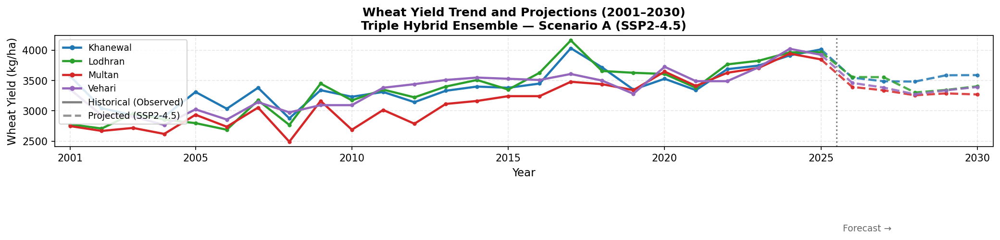

Caption: Figure. Historical (2001–2025) and projected (2026–2030) wheat yield for all four districts under Scenario A (SSP2-4.5). Solid lines: observed yield. Dashed lines: model projections. Dotted vertical line marks the forecast boundary. Yield in kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Forecast_Full_Timeline.png
✓ Full timeline saved


In [ ]:
# ── Full timeline: Historical + Forecast combined ─────────────
hist_df = full_timeline[full_timeline['Scenario']=='Historical'].copy()

fig, ax = plt.subplots(figsize=(14, 5.5))

for dist in DISTRICTS:
    # Historical line
    sub_h = hist_df[hist_df['District']==dist].sort_values('Year')
    ax.plot(sub_h['Year'], sub_h['Yield_kg_ha'],
            color=DIST_COLORS[dist], lw=2.2, marker='o', ms=3, label=dist)

    # Forecast — connect seamlessly from 2025
    last_hist_val = sub_h[sub_h['Year']==2025]['Yield_kg_ha'].values[0]
    sub_f = scen_a[scen_a['District']==dist].sort_values('Year')
    fore_years = [2025] + sub_f['Year'].tolist()
    fore_vals  = [last_hist_val] + sub_f['SERWI_Triple'].tolist()
    ax.plot(fore_years, fore_vals,
            color=DIST_COLORS[dist], lw=2.2, marker='o', ms=3,
            linestyle='--', alpha=0.85)

# Vertical line exactly at 2025.5
ax.axvline(2025.5, color='black', lw=1.5, linestyle=':', alpha=0.5)
ax.text(2025.7, 1020, 'Forecast →', fontsize=9, color='black', alpha=0.6)

# Fix x-axis to go exactly 2001-2030
ax.set_xlim(2000.5, 2030.5)
ax.set_xticks([2001,2005,2010,2015,2020,2025,2030])

# Legend
handles = [mlines.Line2D([],[],color=DIST_COLORS[d],lw=2.2,
           marker='o',ms=4,label=d) for d in DISTRICTS]
handles.append(mlines.Line2D([],[],color='gray',lw=2.2,
               linestyle='-', label='Historical (Observed)'))
handles.append(mlines.Line2D([],[],color='gray',lw=2.2,
               linestyle='--', alpha=0.85, label='Projected (SSP2-4.5)'))
ax.legend(handles=handles, fontsize=9, framealpha=0.85, loc='upper left')
ax.set_xlabel('Year', fontsize=11)
ax.set_ylabel(f'Wheat Yield ({UNIT})', fontsize=11)
ax.set_title(
    'Wheat Yield Trend and Projections (2001–2030)\n'
    'Triple Hybrid Ensemble — Scenario A (SSP2-4.5)',
    fontsize=12, fontweight='bold'
)
plt.tight_layout()
caption = ('Figure. Historical (2001–2025) and projected (2026–2030) wheat yield '
           'for all four districts under Scenario A (SSP2-4.5). '
           'Solid lines: observed yield. Dashed lines: model projections. '
           f'Dotted vertical line marks the forecast boundary. Yield in {UNIT}.')
save_fig(fig, 'Fig_Forecast_Full_Timeline', caption)
print('✓ Full timeline saved')

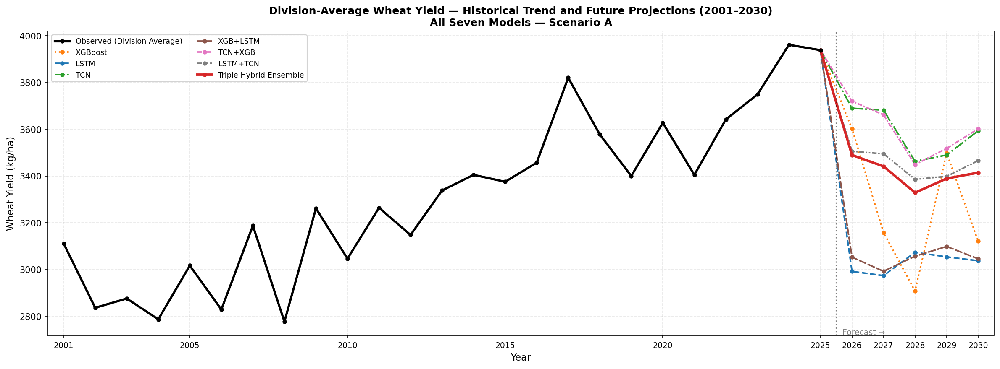

Caption: Figure. Division-average wheat yield combining historical observations (2001–2025) and projections (2026–2030) for all seven models under Scenario A. Yield in kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Forecast_FullTimeline_AllModels_DivAvg.png
✓ Plot 1 saved


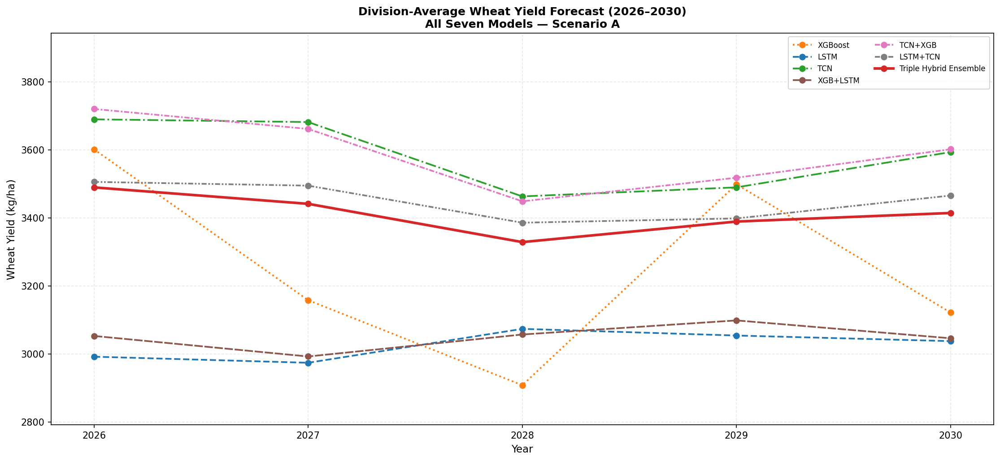

Caption: Figure. Division-average projected wheat yield (2026–2030) for all seven models under Scenario A. Yield in kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Forecast_AllModels_DivAvg_Line.png
✓ Plot 2 saved


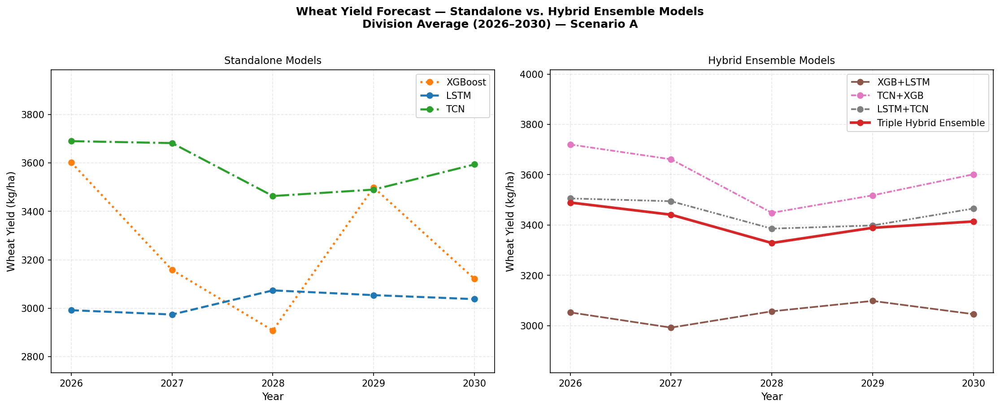

Caption: Figure. Division-average projected wheat yield (2026–2030). Left: standalone models. Right: hybrid ensemble models. Scenario A. Yield in kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Forecast_Standalone_vs_Hybrid.png
✓ Plot 3A saved


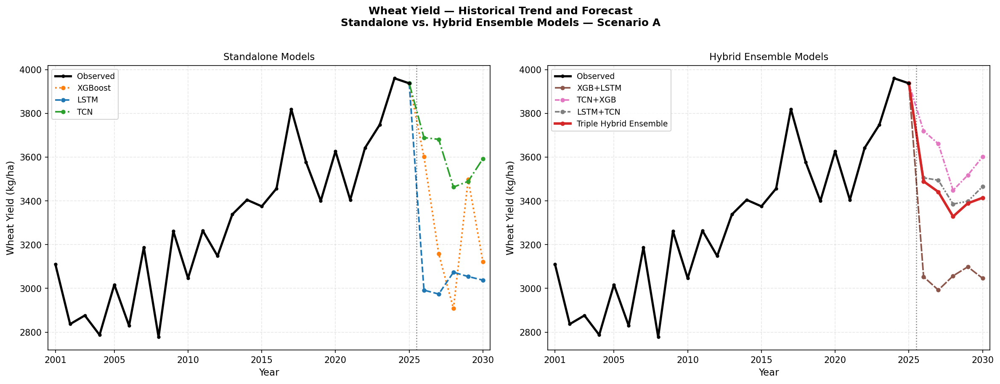

Caption: Figure. Historical (2001–2025) and projected (2026–2030) division-average wheat yield. Left: standalone models. Right: hybrid ensemble models. Scenario A. Yield in kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Forecast_Standalone_vs_Hybrid_WithHistory.png
✓ Plot 3B saved


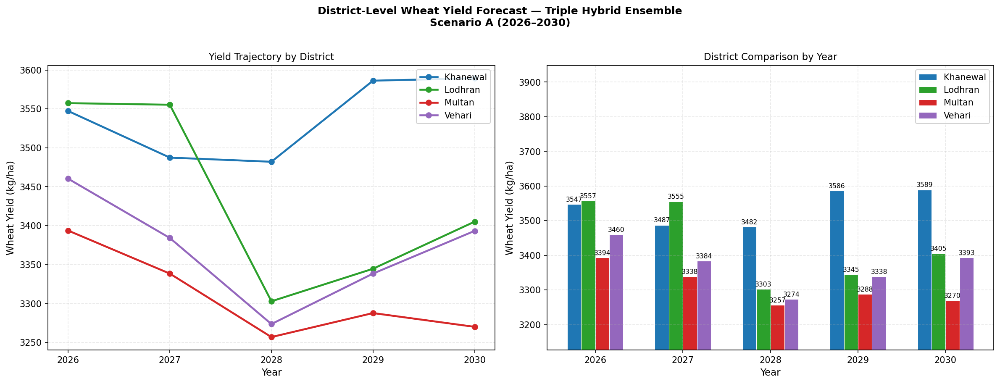

Caption: Figure. District-level projected wheat yield (2026–2030) using the Triple Hybrid Ensemble under Scenario A. Left: temporal trajectories. Right: year-wise bar comparison. Yield in kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Forecast_District_Triple_Hybrid.png
✓ Plot 4 saved


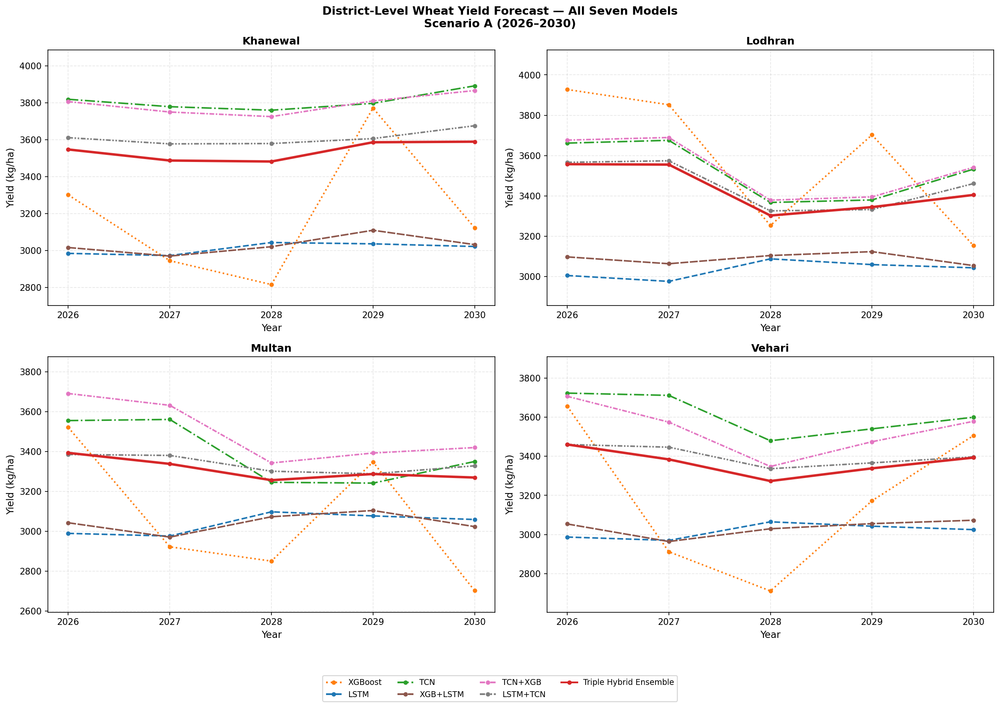

Caption: Figure. District-level projected wheat yield (2026–2030) for all seven models under Scenario A. Triple Hybrid Ensemble shown as solid red. Yield in kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Forecast_AllModels_PerDistrict_4panel.png
✓ Plot 5A saved


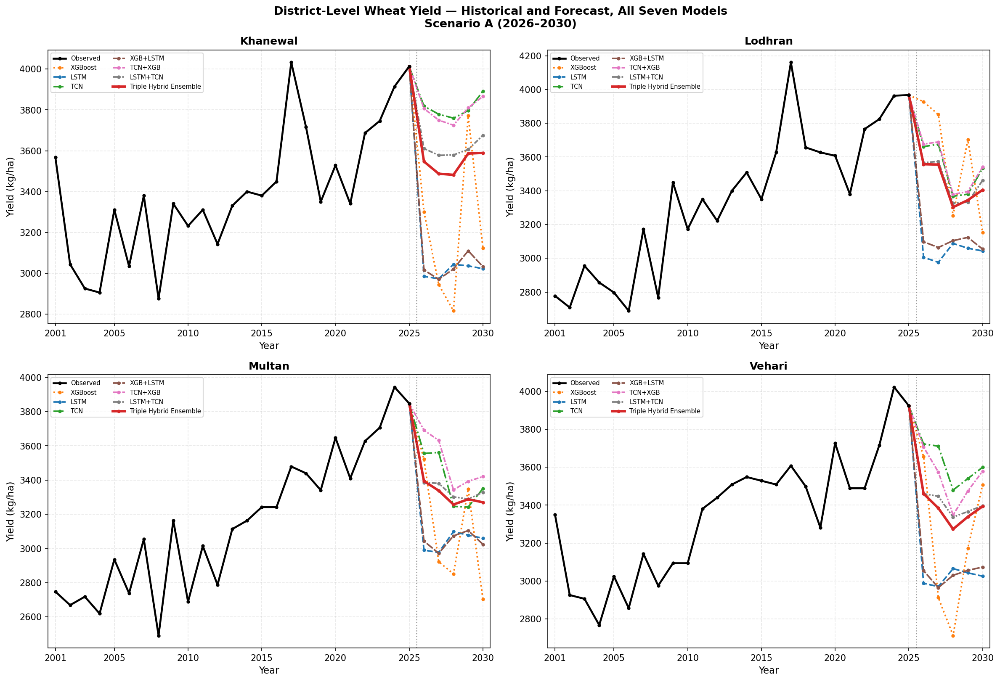

Caption: Figure. Historical (2001–2025) and projected (2026–2030) district-level wheat yield for all seven models under Scenario A. Black: observed. Colored: model projections. Dotted line marks forecast boundary. Yield in kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Forecast_AllModels_PerDistrict_WithHistory.png
✓ Plot 5B saved


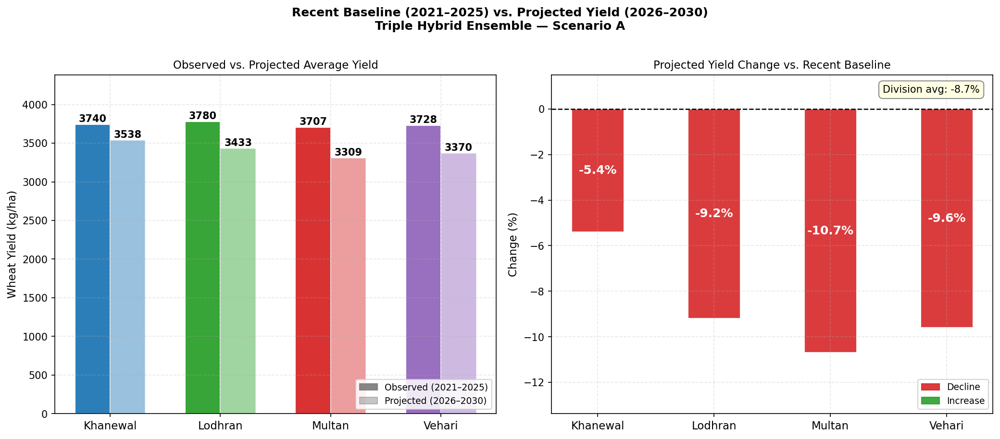

Caption: Figure. Comparison of observed (2021–2025) and projected (2026–2030) district-level wheat yield under Scenario A. Left: average yield comparison. Right: percentage change relative to recent baseline. Division average change: -8.7%. Yield in kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Forecast_Baseline_vs_Projected.png
✓ Plot 6 saved

All forecast plots complete ✓
Total plots saved: 8


In [ ]:
# ============================================================
# CELL 8B — FORECAST PLOTS (FINAL UPDATED VERSION)
# ============================================================

MODEL_COLS = {
    'XGBoost':                'XGB',
    'LSTM':                   'LSTM',
    'TCN':                    'TCN',
    'XGB+LSTM':               'SERWI_XGB_LSTM',
    'TCN+XGB':                'SERWI_TCN_XGB',
    'LSTM+TCN':               'SERWI_LSTM_TCN',
    'Triple Hybrid Ensemble': 'SERWI_Triple'
}
STANDALONE = ['XGBoost','LSTM','TCN']
HYBRID     = ['XGB+LSTM','TCN+XGB','LSTM+TCN','Triple Hybrid Ensemble']
ALL_MODELS = list(MODEL_COLS.keys())

MODEL_LS = {
    'XGBoost':                ':',
    'LSTM':                   '--',
    'TCN':                    '-.',
    'XGB+LSTM':               (0,(5,1)),
    'TCN+XGB':                (0,(3,1,1,1)),
    'LSTM+TCN':               (0,(3,1,1,1,1,1)),
    'Triple Hybrid Ensemble': '-'
}
MODEL_LW = {m: 2.8 if m=='Triple Hybrid Ensemble' else 1.8
            for m in ALL_MODELS}

scen_a  = forecast_scenA[forecast_scenA['Scenario']=='ScenarioA_Primary'].copy()
years   = sorted(scen_a['Year'].unique())
div_avg = scen_a.groupby('Year')[list(MODEL_COLS.values())].mean().reset_index()
hist_div = merged_df.groupby('Year')['Yield_kg_ha'].mean().reset_index()
hist_div.columns = ['Year','Yield_kg_ha']

# ── PLOT 1: Full timeline + all 7 models division average ─────
fig, ax = plt.subplots(figsize=(16, 6))
ax.plot(hist_div['Year'], hist_div['Yield_kg_ha'],
        color='black', lw=2.5, marker='o', ms=4,
        label='Observed (Division Average)', zorder=6)
for name, col in MODEL_COLS.items():
    last_val = hist_div[hist_div['Year']==2025]['Yield_kg_ha'].values[0]
    fore_yrs = [2025] + list(div_avg['Year'])
    fore_val = [last_val] + list(div_avg[col])
    ax.plot(fore_yrs, fore_val,
            color=MODEL_COLORS[name], lw=MODEL_LW[name],
            linestyle=MODEL_LS[name], marker='o', ms=4, label=name)
ax.axvline(2025.5, color='black', lw=1.5, linestyle=':', alpha=0.5)
ax.text(2025.7, hist_div['Yield_kg_ha'].min()*0.98,
        'Forecast →', fontsize=9, color='gray')
ax.set_xlim(2000.5, 2030.5)
ax.set_xticks([2001,2005,2010,2015,2020,2025,2026,2027,2028,2029,2030])
ax.set_xticklabels(['2001','2005','2010','2015','2020','2025',
                    '2026','2027','2028','2029','2030'], fontsize=9)
ax.set_xlabel('Year', fontsize=11)
ax.set_ylabel(f'Wheat Yield ({UNIT})', fontsize=11)
ax.set_title(
    'Division-Average Wheat Yield — Historical Trend and Future Projections (2001–2030)\n'
    'All Seven Models — Scenario A',
    fontsize=12, fontweight='bold'
)
ax.legend(fontsize=8.5, framealpha=0.85, loc='upper left', ncol=2)
plt.tight_layout()
caption = ('Figure. Division-average wheat yield combining historical observations (2001–2025) '
           'and projections (2026–2030) for all seven models under Scenario A. '
           f'Yield in {UNIT}.')
save_fig(fig, 'Fig_Forecast_FullTimeline_AllModels_DivAvg', caption)
print('✓ Plot 1 saved')

# ── PLOT 2: All 7 models — forecast only, legend top right ────
fig, ax = plt.subplots(figsize=(15, 7))
for name, col in MODEL_COLS.items():
    ax.plot(div_avg['Year'], div_avg[col],
            color=MODEL_COLORS[name], lw=MODEL_LW[name],
            linestyle=MODEL_LS[name], marker='o', ms=6, label=name)
ax.set_xlabel('Year', fontsize=11)
ax.set_ylabel(f'Wheat Yield ({UNIT})', fontsize=11)
ax.set_title(
    'Division-Average Wheat Yield Forecast (2026–2030)\n'
    'All Seven Models — Scenario A',
    fontsize=12, fontweight='bold'
)
# Legend top right, small, 2 col — lines well below
ax.legend(fontsize=8, framealpha=0.85, loc='upper right',
          ncol=2, borderpad=0.6, handlelength=2.5)
ax.set_xticks(years)
ymin = min(div_avg[list(MODEL_COLS.values())].min()) * 0.96
ymax = max(div_avg[list(MODEL_COLS.values())].max()) * 1.06
ax.set_ylim(ymin, ymax)
plt.tight_layout()
caption = ('Figure. Division-average projected wheat yield (2026–2030) for all '
           'seven models under Scenario A. '
           f'Yield in {UNIT}.')
save_fig(fig, 'Fig_Forecast_AllModels_DivAvg_Line', caption)
print('✓ Plot 2 saved')

# ── PLOT 3A: Standalone vs Hybrid, legend top right ──────────
fig, axes = plt.subplots(1, 2, figsize=(15, 6))
fig.suptitle(
    'Wheat Yield Forecast — Standalone vs. Hybrid Ensemble Models\n'
    'Division Average (2026–2030) — Scenario A',
    fontsize=12, fontweight='bold', y=1.01
)
ax1, ax2 = axes

for name in STANDALONE:
    col = MODEL_COLS[name]
    ax1.plot(years, div_avg[col].values,
             color=MODEL_COLORS[name], lw=2.2,
             linestyle=MODEL_LS[name], marker='o', ms=6, label=name)
ax1.set_xlabel('Year'); ax1.set_ylabel(f'Wheat Yield ({UNIT})')
ax1.set_title('Standalone Models', fontsize=11)
ax1.legend(fontsize=10, framealpha=0.85, loc='upper right')
ax1.set_xticks(years)
ax1.set_ylim(
    min(div_avg[['XGB','LSTM','TCN']].min())*0.94,
    max(div_avg[['XGB','LSTM','TCN']].max())*1.08
)

for name in HYBRID:
    col = MODEL_COLS[name]
    ax2.plot(years, div_avg[col].values,
             color=MODEL_COLORS[name], lw=MODEL_LW[name],
             linestyle=MODEL_LS[name], marker='o', ms=6, label=name)
ax2.set_xlabel('Year'); ax2.set_ylabel(f'Wheat Yield ({UNIT})')
ax2.set_title('Hybrid Ensemble Models', fontsize=11)
ax2.legend(fontsize=10, framealpha=0.85, loc='upper right')
ax2.set_xticks(years)
hybrid_cols = ['SERWI_XGB_LSTM','SERWI_TCN_XGB','SERWI_LSTM_TCN','SERWI_Triple']
ax2.set_ylim(
    min(div_avg[hybrid_cols].min())*0.94,
    max(div_avg[hybrid_cols].max())*1.08
)
plt.tight_layout()
caption = ('Figure. Division-average projected wheat yield (2026–2030). '
           'Left: standalone models. Right: hybrid ensemble models. '
           f'Scenario A. Yield in {UNIT}.')
save_fig(fig, 'Fig_Forecast_Standalone_vs_Hybrid', caption)
print('✓ Plot 3A saved')

# ── PLOT 3B: Standalone vs Hybrid WITH historical ─────────────
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle(
    'Wheat Yield — Historical Trend and Forecast\n'
    'Standalone vs. Hybrid Ensemble Models — Scenario A',
    fontsize=12, fontweight='bold', y=1.01
)
ax1, ax2 = axes

for ax, model_list, title in [
    (ax1, STANDALONE, 'Standalone Models'),
    (ax2, HYBRID,     'Hybrid Ensemble Models')
]:
    ax.plot(hist_div['Year'], hist_div['Yield_kg_ha'],
            color='black', lw=2.5, marker='o', ms=3,
            label='Observed', zorder=6)
    for name in model_list:
        col = MODEL_COLS[name]
        last_val = hist_div[hist_div['Year']==2025]['Yield_kg_ha'].values[0]
        fore_yrs = [2025] + list(div_avg['Year'])
        fore_val = [last_val] + list(div_avg[col])
        ax.plot(fore_yrs, fore_val,
                color=MODEL_COLORS[name], lw=MODEL_LW[name],
                linestyle=MODEL_LS[name], marker='o', ms=4, label=name)
    ax.axvline(2025.5, color='black', lw=1.2, linestyle=':', alpha=0.5)
    ax.set_xlim(2000.5, 2030.5)
    ax.set_xticks([2001,2005,2010,2015,2020,2025,2030])
    ax.set_xlabel('Year'); ax.set_ylabel(f'Wheat Yield ({UNIT})')
    ax.set_title(title, fontsize=11)
    ax.legend(fontsize=9, framealpha=0.85, loc='upper left')

plt.tight_layout()
caption = ('Figure. Historical (2001–2025) and projected (2026–2030) division-average '
           'wheat yield. Left: standalone models. Right: hybrid ensemble models. '
           f'Scenario A. Yield in {UNIT}.')
save_fig(fig, 'Fig_Forecast_Standalone_vs_Hybrid_WithHistory', caption)
print('✓ Plot 3B saved')

# ── PLOT 4: Triple Hybrid district comparison (FIXED bars) ────
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle(
    'District-Level Wheat Yield Forecast — Triple Hybrid Ensemble\n'
    'Scenario A (2026–2030)',
    fontsize=12, fontweight='bold', y=1.01
)
ax1, ax2 = axes

for dist in DISTRICTS:
    sub = scen_a[scen_a['District']==dist].sort_values('Year')
    ax1.plot(sub['Year'], sub['SERWI_Triple'],
             color=DIST_COLORS[dist], lw=2.2,
             marker='o', ms=6, label=dist)
ax1.set_xlabel('Year'); ax1.set_ylabel(f'Wheat Yield ({UNIT})')
ax1.set_title('Yield Trajectory by District', fontsize=11)
ax1.legend(fontsize=10, framealpha=0.85, loc='upper right')
ax1.set_xticks(years)

# Bar chart — wider bars, horizontal labels, no overlap
x = np.arange(len(years))
w = 0.16
ymin_bar = scen_a['SERWI_Triple'].min() * 0.96
ymax_bar = scen_a['SERWI_Triple'].max() * 1.10

for i, dist in enumerate(DISTRICTS):
    sub = scen_a[scen_a['District']==dist].sort_values('Year')
    bars = ax2.bar(x + i*w, sub['SERWI_Triple'].values, w,
                   color=DIST_COLORS[dist], label=dist,
                   edgecolor='white', lw=0.5)
    for bar, val in zip(bars, sub['SERWI_Triple'].values):
        ax2.text(bar.get_x() + bar.get_width()/2,
                 bar.get_height() + 4,
                 f'{val:.0f}',
                 ha='center', va='bottom',
                 fontsize=7.5, rotation=0)

ax2.set_xlabel('Year'); ax2.set_ylabel(f'Wheat Yield ({UNIT})')
ax2.set_title('District Comparison by Year', fontsize=11)
ax2.set_xticks(x + w*1.5)
ax2.set_xticklabels([str(y) for y in years])
ax2.set_ylim(ymin_bar, ymax_bar)
ax2.legend(fontsize=10, framealpha=0.85, loc='upper right')
plt.tight_layout()
caption = ('Figure. District-level projected wheat yield (2026–2030) using the '
           'Triple Hybrid Ensemble under Scenario A. '
           'Left: temporal trajectories. Right: year-wise bar comparison. '
           f'Yield in {UNIT}.')
save_fig(fig, 'Fig_Forecast_District_Triple_Hybrid', caption)
print('✓ Plot 4 saved')

# ── PLOT 5A: All 7 models per district 4-panel ───────────────
fig, axes = plt.subplots(2, 2, figsize=(16, 11))
fig.suptitle(
    'District-Level Wheat Yield Forecast — All Seven Models\n'
    'Scenario A (2026–2030)',
    fontsize=13, fontweight='bold'
)
for ax, dist in zip(axes.flatten(), DISTRICTS):
    sub = scen_a[scen_a['District']==dist].sort_values('Year')
    for name, col in MODEL_COLS.items():
        ax.plot(sub['Year'], sub[col],
                color=MODEL_COLORS[name], lw=MODEL_LW[name],
                linestyle=MODEL_LS[name], marker='o', ms=4, label=name)
    ax.set_title(dist, fontsize=12, fontweight='bold')
    ax.set_xlabel('Year'); ax.set_ylabel(f'Yield ({UNIT})')
    ax.set_xticks(years)
    ymin = sub[list(MODEL_COLS.values())].min().min()*0.96
    ymax = sub[list(MODEL_COLS.values())].max().max()*1.05
    ax.set_ylim(ymin, ymax)

handles = [mlines.Line2D([],[],color=MODEL_COLORS[n],lw=2,
           linestyle=MODEL_LS[n],marker='o',ms=4,label=n)
           for n in ALL_MODELS]
fig.legend(handles=handles, loc='lower center', ncol=4,
           fontsize=9, framealpha=0.85, bbox_to_anchor=(0.5,-0.03))
plt.tight_layout(rect=[0,0.05,1,1])
caption = ('Figure. District-level projected wheat yield (2026–2030) for all '
           'seven models under Scenario A. '
           f'Triple Hybrid Ensemble shown as solid red. Yield in {UNIT}.')
save_fig(fig, 'Fig_Forecast_AllModels_PerDistrict_4panel', caption)
print('✓ Plot 5A saved')

# ── PLOT 5B: All 7 models per district WITH historical ────────
fig, axes = plt.subplots(2, 2, figsize=(16, 11))
fig.suptitle(
    'District-Level Wheat Yield — Historical and Forecast, All Seven Models\n'
    'Scenario A (2026–2030)',
    fontsize=13, fontweight='bold'
)
for ax, dist in zip(axes.flatten(), DISTRICTS):
    sub_h = merged_df[merged_df['District']==dist].sort_values('Year')
    ax.plot(sub_h['Year'], sub_h['Yield_kg_ha'],
            color='black', lw=2.2, marker='o', ms=3,
            label='Observed', zorder=6)
    sub_f = scen_a[scen_a['District']==dist].sort_values('Year')
    last_val = sub_h[sub_h['Year']==2025]['Yield_kg_ha'].values[0]
    for name, col in MODEL_COLS.items():
        fore_yrs = [2025] + list(sub_f['Year'])
        fore_val = [last_val] + list(sub_f[col])
        ax.plot(fore_yrs, fore_val,
                color=MODEL_COLORS[name], lw=MODEL_LW[name],
                linestyle=MODEL_LS[name], marker='o', ms=3, label=name)
    ax.axvline(2025.5, color='black', lw=1.2, linestyle=':', alpha=0.4)
    ax.set_title(dist, fontsize=12, fontweight='bold')
    ax.set_xlabel('Year'); ax.set_ylabel(f'Yield ({UNIT})')
    ax.set_xlim(2000.5, 2030.5)
    ax.set_xticks([2001,2005,2010,2015,2020,2025,2030])
    # Legend inside each panel — upper left, small
    ax.legend(fontsize=7, framealpha=0.8, loc='upper left',
              ncol=2, borderpad=0.4, handlelength=2)

plt.tight_layout(rect=[0,0,1,1])
caption = ('Figure. Historical (2001–2025) and projected (2026–2030) district-level '
           'wheat yield for all seven models under Scenario A. '
           'Black: observed. Colored: model projections. '
           f'Dotted line marks forecast boundary. Yield in {UNIT}.')
save_fig(fig, 'Fig_Forecast_AllModels_PerDistrict_WithHistory', caption)
print('✓ Plot 5B saved')

# ── PLOT 6: Baseline vs Projected (FULLY IMPROVED) ───────────
hist_recent = triple_pred.groupby('District')['Actual'].mean().reset_index()
hist_recent.columns = ['District','Hist_Avg']
fore_avg_d = scen_a.groupby('District')['SERWI_Triple'].mean().reset_index()
fore_avg_d.columns = ['District','Fore_Avg']
merged6 = hist_recent.merge(fore_avg_d, on='District')
merged6['Change_pct'] = ((merged6['Fore_Avg']-merged6['Hist_Avg'])/
                          merged6['Hist_Avg']*100).round(1)
div_hist_val = triple_pred['Actual'].mean()
div_fore_val = scen_a['SERWI_Triple'].mean()
div_chg      = ((div_fore_val - div_hist_val)/div_hist_val*100).round(1)

fig, axes = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle(
    'Recent Baseline (2021–2025) vs. Projected Yield (2026–2030)\n'
    'Triple Hybrid Ensemble — Scenario A',
    fontsize=12, fontweight='bold', y=1.01
)
ax1, ax2 = axes

# Left: grouped bar — consistent dist colors
x = np.arange(len(DISTRICTS))
w = 0.32
b1 = ax1.bar(x-w/2, merged6['Hist_Avg'], w,
             color=[DIST_COLORS[d] for d in DISTRICTS],
             edgecolor='white', alpha=0.95)
b2 = ax1.bar(x+w/2, merged6['Fore_Avg'], w,
             color=[DIST_COLORS[d] for d in DISTRICTS],
             edgecolor='white', alpha=0.45)
for bar, val in zip(b1, merged6['Hist_Avg']):
    ax1.text(bar.get_x()+bar.get_width()/2,
             bar.get_height()+8,
             f'{val:.0f}', ha='center', va='bottom',
             fontsize=10, fontweight='bold')
for bar, val in zip(b2, merged6['Fore_Avg']):
    ax1.text(bar.get_x()+bar.get_width()/2,
             bar.get_height()+8,
             f'{val:.0f}', ha='center', va='bottom',
             fontsize=10, fontweight='bold')
ax1.set_xticks(x)
ax1.set_xticklabels(DISTRICTS, fontsize=11)
ax1.set_ylabel(f'Wheat Yield ({UNIT})', fontsize=11)
ax1.set_ylim(0, merged6[['Hist_Avg','Fore_Avg']].max().max()*1.16)
ax1.set_title('Observed vs. Projected Average Yield', fontsize=11)
hist_p = mpatches.Patch(color='gray', alpha=0.95, label='Observed (2021–2025)')
fore_p = mpatches.Patch(color='gray', alpha=0.45, label='Projected (2026–2030)')
ax1.legend(handles=[hist_p, fore_p], fontsize=9,
           framealpha=0.85, loc='lower right')

# Right: % change bars — all values negative
colors_chg = ['#d62728' if v<0 else '#2ca02c' for v in merged6['Change_pct']]
bars = ax2.bar(DISTRICTS, merged6['Change_pct'], width=0.45,
               color=colors_chg, edgecolor='white', alpha=0.9)

# Value labels inside bars (white text)
for bar, val in zip(bars, merged6['Change_pct']):
    ax2.text(bar.get_x()+bar.get_width()/2,
             bar.get_height()/2,
             f'{val:+.1f}%',
             ha='center', va='center',
             fontsize=12, fontweight='bold', color='white')

ax2.axhline(0, color='black', lw=1.2, linestyle='--')

# Division average annotation — inside axes top right
ax2.text(0.97, 0.97, f'Division avg: {div_chg:+.1f}%',
         transform=ax2.transAxes,
         ha='right', va='top', fontsize=10,
         bbox=dict(boxstyle='round,pad=0.4',
                   facecolor='lightyellow',
                   edgecolor='gray', alpha=0.9))

# Y axis — enough room below 0
ymin_chg = min(merged6['Change_pct'].min()*1.25, -13)
ax2.set_ylim(ymin_chg, 1.5)
ax2.set_ylabel('Change (%)', fontsize=11)
ax2.set_title('Projected Yield Change vs. Recent Baseline', fontsize=11)
ax2.set_xticklabels(DISTRICTS, fontsize=11)

neg_p = mpatches.Patch(color='#d62728', alpha=0.9, label='Decline')
pos_p = mpatches.Patch(color='#2ca02c', alpha=0.9, label='Increase')
ax2.legend(handles=[neg_p, pos_p], fontsize=9,
           framealpha=0.85, loc='lower right')

plt.tight_layout()
caption = ('Figure. Comparison of observed (2021–2025) and projected (2026–2030) '
           'district-level wheat yield under Scenario A. '
           'Left: average yield comparison. '
           'Right: percentage change relative to recent baseline. '
           f'Division average change: {div_chg:+.1f}%. Yield in {UNIT}.')
save_fig(fig, 'Fig_Forecast_Baseline_vs_Projected', caption)
print('✓ Plot 6 saved')

print('\nAll forecast plots complete ✓')
print('Total plots saved: 8')

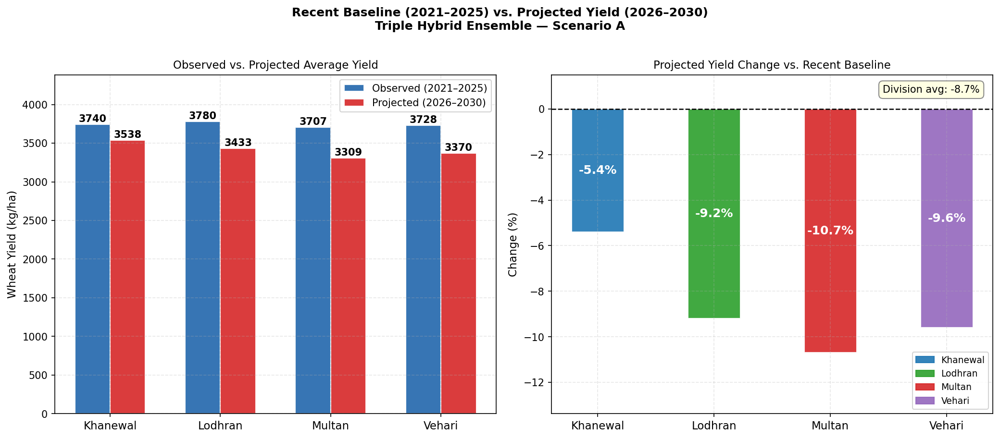

Caption: Figure. Comparison of observed (2021–2025) and projected (2026–2030) district-level wheat yield under Scenario A. Left: blue bars = observed, red bars = projected. Right: percentage change per district relative to recent baseline. Division average change: -8.7%. Yield in kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Forecast_Baseline_vs_Projected.png
✓ Plot 6A saved


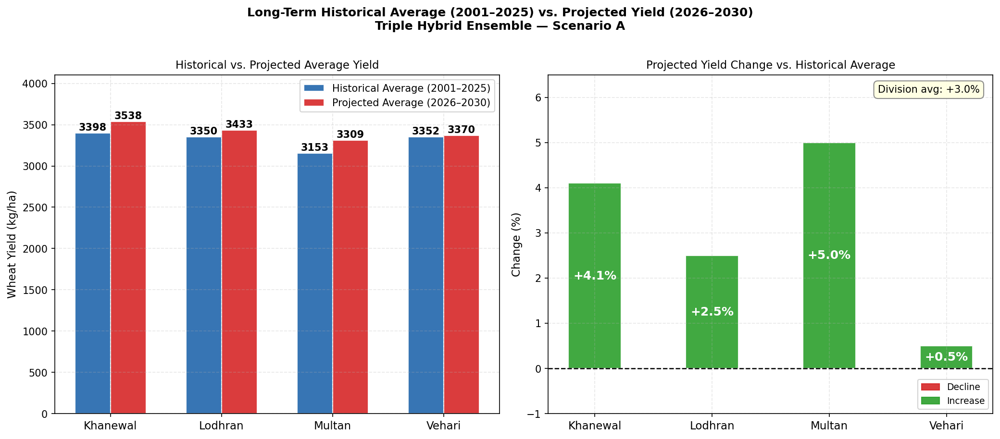

Caption: Figure. Comparison of long-term historical average (2001–2025) and projected (2026–2030) district-level wheat yield under Scenario A. Left: blue = historical average, red = projected average. Right: percentage change relative to full historical average. Division average change: +3.0%. Yield in kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Forecast_HistoricalAvg_vs_Projected.png
✓ Plot 6B saved


In [ ]:
# ============================================================
# PLOT 6A — Baseline vs Projected (SIMPLIFIED COLORS)
# ============================================================

hist_recent = triple_pred.groupby('District')['Actual'].mean().reset_index()
hist_recent.columns = ['District','Hist_Avg']
fore_avg_d  = scen_a.groupby('District')['SERWI_Triple'].mean().reset_index()
fore_avg_d.columns  = ['District','Fore_Avg']
merged6 = hist_recent.merge(fore_avg_d, on='District')
merged6['Change_pct'] = ((merged6['Fore_Avg']-merged6['Hist_Avg'])/
                          merged6['Hist_Avg']*100).round(1)
div_hist_val = triple_pred['Actual'].mean()
div_fore_val = scen_a['SERWI_Triple'].mean()
div_chg      = ((div_fore_val - div_hist_val)/div_hist_val*100).round(1)

# Fixed colors — same for all districts
OBS_COLOR  = '#2166ac'   # blue  — observed
PROJ_COLOR = '#d62728'   # red   — projected

fig, axes = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle(
    'Recent Baseline (2021–2025) vs. Projected Yield (2026–2030)\n'
    'Triple Hybrid Ensemble — Scenario A',
    fontsize=12, fontweight='bold', y=1.01
)
ax1, ax2 = axes

# Left: grouped bars — blue=observed, red=projected for ALL districts
x = np.arange(len(DISTRICTS))
w = 0.32

b1_bars = ax1.bar(x - w/2, merged6['Hist_Avg'], w,
                  color=OBS_COLOR, edgecolor='white',
                  alpha=0.9, label='Observed (2021–2025)')
b2_bars = ax1.bar(x + w/2, merged6['Fore_Avg'], w,
                  color=PROJ_COLOR, edgecolor='white',
                  alpha=0.9, label='Projected (2026–2030)')

for bar, val in zip(b1_bars, merged6['Hist_Avg']):
    ax1.text(bar.get_x()+bar.get_width()/2,
             bar.get_height()+8,
             f'{val:.0f}',
             ha='center', va='bottom',
             fontsize=10, fontweight='bold')
for bar, val in zip(b2_bars, merged6['Fore_Avg']):
    ax1.text(bar.get_x()+bar.get_width()/2,
             bar.get_height()+8,
             f'{val:.0f}',
             ha='center', va='bottom',
             fontsize=10, fontweight='bold')

ax1.set_xticks(x)
ax1.set_xticklabels(DISTRICTS, fontsize=11)
ax1.set_ylabel(f'Wheat Yield ({UNIT})', fontsize=11)
ax1.set_ylim(0, merged6[['Hist_Avg','Fore_Avg']].max().max()*1.16)
ax1.set_title('Observed vs. Projected Average Yield', fontsize=11)
ax1.legend(fontsize=10, framealpha=0.85, loc='upper right')

# Right: % change — district colors for identification
colors_chg = [DIST_COLORS[d] for d in DISTRICTS]
bars = ax2.bar(DISTRICTS, merged6['Change_pct'], width=0.45,
               color=colors_chg, edgecolor='white', alpha=0.9)
for bar, val in zip(bars, merged6['Change_pct']):
    ax2.text(bar.get_x()+bar.get_width()/2,
             bar.get_height()/2,
             f'{val:+.1f}%',
             ha='center', va='center',
             fontsize=12, fontweight='bold', color='white')
ax2.axhline(0, color='black', lw=1.2, linestyle='--')
ax2.text(0.97, 0.97, f'Division avg: {div_chg:+.1f}%',
         transform=ax2.transAxes,
         ha='right', va='top', fontsize=10,
         bbox=dict(boxstyle='round,pad=0.4',
                   facecolor='lightyellow',
                   edgecolor='gray', alpha=0.9))
ymin_chg = min(merged6['Change_pct'].min()*1.25, -13)
ax2.set_ylim(ymin_chg, 1.5)
ax2.set_ylabel('Change (%)', fontsize=11)
ax2.set_title('Projected Yield Change vs. Recent Baseline', fontsize=11)
ax2.set_xticklabels(DISTRICTS, fontsize=11)
dist_patches = [mpatches.Patch(color=DIST_COLORS[d], alpha=0.9, label=d)
                for d in DISTRICTS]
ax2.legend(handles=dist_patches, fontsize=9,
           framealpha=0.85, loc='lower right')

plt.tight_layout()
caption = ('Figure. Comparison of observed (2021–2025) and projected (2026–2030) '
           'district-level wheat yield under Scenario A. '
           'Left: blue bars = observed, red bars = projected. '
           'Right: percentage change per district relative to recent baseline. '
           f'Division average change: {div_chg:+.1f}%. Yield in {UNIT}.')
save_fig(fig, 'Fig_Forecast_Baseline_vs_Projected', caption)
print('✓ Plot 6A saved')

# ============================================================
# PLOT 6B — Full Historical Average vs Projected
# ============================================================

hist_full = merged_df.groupby('District')['Yield_kg_ha'].mean().reset_index()
hist_full.columns = ['District','Hist_Full_Avg']
merged6b = hist_full.merge(fore_avg_d, on='District')
merged6b['Change_pct'] = ((merged6b['Fore_Avg']-merged6b['Hist_Full_Avg'])/
                           merged6b['Hist_Full_Avg']*100).round(1)
div_hist_full = merged_df['Yield_kg_ha'].mean()
div_chg_full  = ((div_fore_val - div_hist_full)/div_hist_full*100).round(1)

fig, axes = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle(
    'Long-Term Historical Average (2001–2025) vs. Projected Yield (2026–2030)\n'
    'Triple Hybrid Ensemble — Scenario A',
    fontsize=12, fontweight='bold', y=1.01
)
ax1, ax2 = axes

# Left: blue=historical, red=projected
b1_bars = ax1.bar(x - w/2, merged6b['Hist_Full_Avg'], w,
                  color=OBS_COLOR, edgecolor='white',
                  alpha=0.9, label='Historical Average (2001–2025)')
b2_bars = ax1.bar(x + w/2, merged6b['Fore_Avg'], w,
                  color=PROJ_COLOR, edgecolor='white',
                  alpha=0.9, label='Projected Average (2026–2030)')

for bar, val in zip(b1_bars, merged6b['Hist_Full_Avg']):
    ax1.text(bar.get_x()+bar.get_width()/2,
             bar.get_height()+8,
             f'{val:.0f}',
             ha='center', va='bottom',
             fontsize=10, fontweight='bold')
for bar, val in zip(b2_bars, merged6b['Fore_Avg']):
    ax1.text(bar.get_x()+bar.get_width()/2,
             bar.get_height()+8,
             f'{val:.0f}',
             ha='center', va='bottom',
             fontsize=10, fontweight='bold')

ax1.set_xticks(x)
ax1.set_xticklabels(DISTRICTS, fontsize=11)
ax1.set_ylabel(f'Wheat Yield ({UNIT})', fontsize=11)
ax1.set_ylim(0, merged6b[['Hist_Full_Avg','Fore_Avg']].max().max()*1.16)
ax1.set_title('Historical vs. Projected Average Yield', fontsize=11)
ax1.legend(fontsize=10, framealpha=0.85, loc='upper right')

# Right: % change — positive green, negative red
colors_chg2 = ['#d62728' if v<0 else '#2ca02c'
                for v in merged6b['Change_pct']]
bars2 = ax2.bar(DISTRICTS, merged6b['Change_pct'], width=0.45,
                color=colors_chg2, edgecolor='white', alpha=0.9)
for bar, val in zip(bars2, merged6b['Change_pct']):
    ax2.text(bar.get_x()+bar.get_width()/2,
             bar.get_height()/2,
             f'{val:+.1f}%',
             ha='center', va='center',
             fontsize=12, fontweight='bold', color='white')
ax2.axhline(0, color='black', lw=1.2, linestyle='--')
ax2.text(0.97, 0.97, f'Division avg: {div_chg_full:+.1f}%',
         transform=ax2.transAxes,
         ha='right', va='top', fontsize=10,
         bbox=dict(boxstyle='round,pad=0.4',
                   facecolor='lightyellow',
                   edgecolor='gray', alpha=0.9))
yrange2 = merged6b['Change_pct']
ymin2 = min(yrange2.min()*1.3 if yrange2.min()<0 else -1, -1)
ymax2 = max(yrange2.max()*1.3 if yrange2.max()>0 else 1,  1)
ax2.set_ylim(ymin2, ymax2)
ax2.set_ylabel('Change (%)', fontsize=11)
ax2.set_title('Projected Yield Change vs. Historical Average', fontsize=11)
ax2.set_xticklabels(DISTRICTS, fontsize=11)
neg_p = mpatches.Patch(color='#d62728', alpha=0.9, label='Decline')
pos_p = mpatches.Patch(color='#2ca02c', alpha=0.9, label='Increase')
ax2.legend(handles=[neg_p, pos_p], fontsize=9,
           framealpha=0.85, loc='lower right')

plt.tight_layout()
caption = ('Figure. Comparison of long-term historical average (2001–2025) and '
           'projected (2026–2030) district-level wheat yield under Scenario A. '
           'Left: blue = historical average, red = projected average. '
           'Right: percentage change relative to full historical average. '
           f'Division average change: {div_chg_full:+.1f}%. Yield in {UNIT}.')
save_fig(fig, 'Fig_Forecast_HistoricalAvg_vs_Projected', caption)
print('✓ Plot 6B saved')

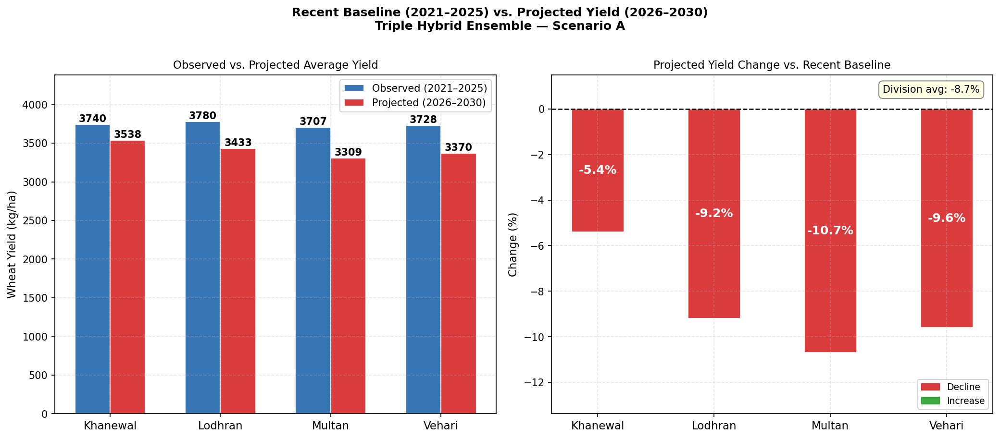

Caption: Figure. Comparison of observed (2021–2025) and projected (2026–2030) district-level wheat yield under Scenario A. Left: blue = observed, red = projected. Right: percentage change relative to recent baseline. Division average change: -8.7%. Yield in kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Forecast_Baseline_vs_Projected.png
✓ Plot 6A saved ✓


In [ ]:
# ============================================================
# PLOT 6A — Baseline vs Projected (FIXED — same as 6B style)
# ============================================================

hist_recent = triple_pred.groupby('District')['Actual'].mean().reset_index()
hist_recent.columns = ['District','Hist_Avg']
fore_avg_d  = scen_a.groupby('District')['SERWI_Triple'].mean().reset_index()
fore_avg_d.columns  = ['District','Fore_Avg']
merged6 = hist_recent.merge(fore_avg_d, on='District')
merged6['Change_pct'] = ((merged6['Fore_Avg']-merged6['Hist_Avg'])/
                          merged6['Hist_Avg']*100).round(1)
div_hist_val = triple_pred['Actual'].mean()
div_fore_val = scen_a['SERWI_Triple'].mean()
div_chg      = ((div_fore_val - div_hist_val)/div_hist_val*100).round(1)

OBS_COLOR  = '#2166ac'   # blue  — observed
PROJ_COLOR = '#d62728'   # red   — projected

fig, axes = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle(
    'Recent Baseline (2021–2025) vs. Projected Yield (2026–2030)\n'
    'Triple Hybrid Ensemble — Scenario A',
    fontsize=12, fontweight='bold', y=1.01
)
ax1, ax2 = axes

x = np.arange(len(DISTRICTS))
w = 0.32

b1_bars = ax1.bar(x - w/2, merged6['Hist_Avg'], w,
                  color=OBS_COLOR, edgecolor='white',
                  alpha=0.9, label='Observed (2021–2025)')
b2_bars = ax1.bar(x + w/2, merged6['Fore_Avg'], w,
                  color=PROJ_COLOR, edgecolor='white',
                  alpha=0.9, label='Projected (2026–2030)')

for bar, val in zip(b1_bars, merged6['Hist_Avg']):
    ax1.text(bar.get_x()+bar.get_width()/2,
             bar.get_height()+8,
             f'{val:.0f}',
             ha='center', va='bottom',
             fontsize=10, fontweight='bold')
for bar, val in zip(b2_bars, merged6['Fore_Avg']):
    ax1.text(bar.get_x()+bar.get_width()/2,
             bar.get_height()+8,
             f'{val:.0f}',
             ha='center', va='bottom',
             fontsize=10, fontweight='bold')

ax1.set_xticks(x)
ax1.set_xticklabels(DISTRICTS, fontsize=11)
ax1.set_ylabel(f'Wheat Yield ({UNIT})', fontsize=11)
ax1.set_ylim(0, merged6[['Hist_Avg','Fore_Avg']].max().max()*1.16)
ax1.set_title('Observed vs. Projected Average Yield', fontsize=11)
ax1.legend(fontsize=10, framealpha=0.85, loc='upper right')

# Right: % change — all negative so all red, same as 6B style
colors_chg = ['#d62728' if v<0 else '#2ca02c'
               for v in merged6['Change_pct']]
bars = ax2.bar(DISTRICTS, merged6['Change_pct'], width=0.45,
               color=colors_chg, edgecolor='white', alpha=0.9)
for bar, val in zip(bars, merged6['Change_pct']):
    ax2.text(bar.get_x()+bar.get_width()/2,
             bar.get_height()/2,
             f'{val:+.1f}%',
             ha='center', va='center',
             fontsize=12, fontweight='bold', color='white')
ax2.axhline(0, color='black', lw=1.2, linestyle='--')
ax2.text(0.97, 0.97, f'Division avg: {div_chg:+.1f}%',
         transform=ax2.transAxes,
         ha='right', va='top', fontsize=10,
         bbox=dict(boxstyle='round,pad=0.4',
                   facecolor='lightyellow',
                   edgecolor='gray', alpha=0.9))
ymin_chg = min(merged6['Change_pct'].min()*1.25, -13)
ax2.set_ylim(ymin_chg, 1.5)
ax2.set_ylabel('Change (%)', fontsize=11)
ax2.set_title('Projected Yield Change vs. Recent Baseline', fontsize=11)
ax2.set_xticklabels(DISTRICTS, fontsize=11)

# Legend — only Decline/Increase like 6B
neg_p = mpatches.Patch(color='#d62728', alpha=0.9, label='Decline')
pos_p = mpatches.Patch(color='#2ca02c', alpha=0.9, label='Increase')
ax2.legend(handles=[neg_p, pos_p], fontsize=9,
           framealpha=0.85, loc='lower right')

plt.tight_layout()
caption = ('Figure. Comparison of observed (2021–2025) and projected (2026–2030) '
           'district-level wheat yield under Scenario A. '
           'Left: blue = observed, red = projected. '
           'Right: percentage change relative to recent baseline. '
           f'Division average change: {div_chg:+.1f}%. Yield in {UNIT}.')
save_fig(fig, 'Fig_Forecast_Baseline_vs_Projected', caption)
print('✓ Plot 6A saved ✓')

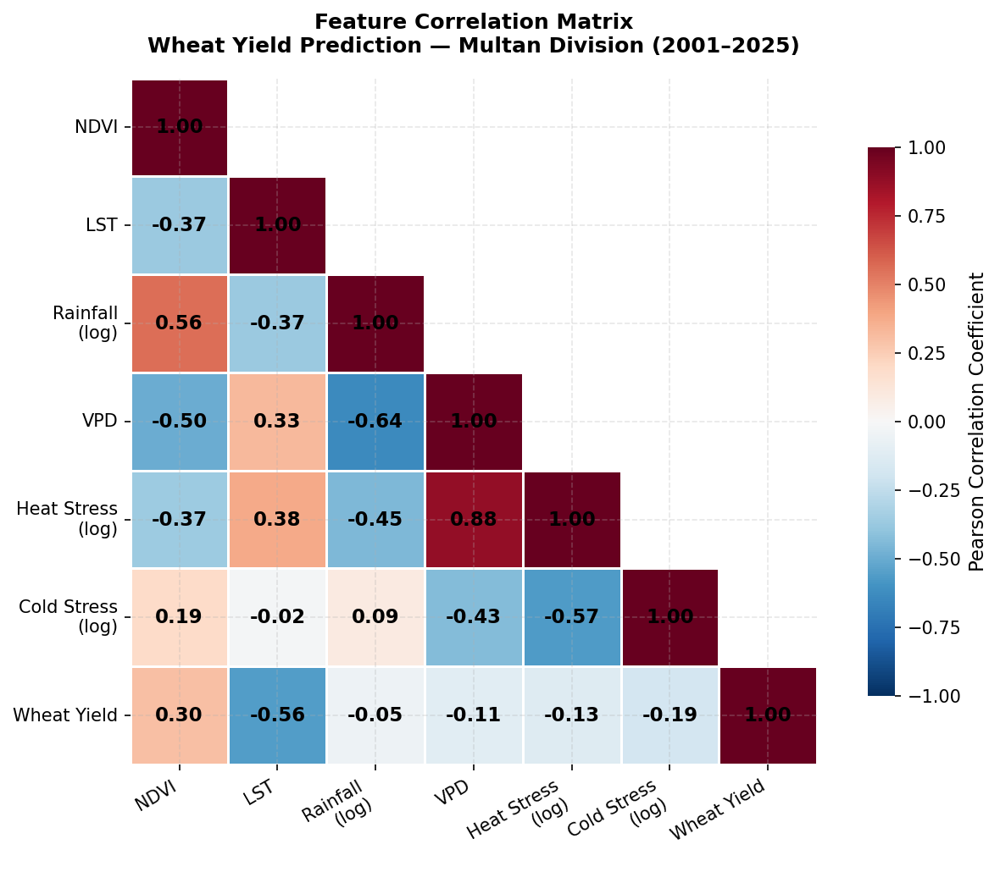

Caption: Figure. Pearson correlation matrix of all predictor variables and wheat yield across Multan Division (2001–2025). Strong negative correlations with LST (−0.56) and VPD indicate thermal and moisture stress effects. HeatStress and VPD show high inter-correlation (0.88), justifying the LST×HeatStress interaction term.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Feature_Correlation_Matrix.png
✓ Feature correlation matrix saved


In [ ]:
# ============================================================
# CELL 9A — FEATURE CORRELATION MATRIX (Overall)
# ============================================================

# Compute correlation from merged dataset
corr_features = ['NDVI_mean','LST_mean_C','Rain_log','VPD_kPa',
                 'HeatStress_log','ColdStress_log','Yield_kg_ha']
feat_labels   = ['NDVI','LST','Rainfall\n(log)','VPD',
                 'Heat Stress\n(log)','Cold Stress\n(log)','Wheat Yield']

corr_df = merged_df[corr_features].corr()

# Lower triangle mask
mask = np.triu(np.ones_like(corr_df, dtype=bool), k=1)

fig, ax = plt.subplots(figsize=(9, 7))

# Heatmap — only lower triangle
sns.heatmap(
    corr_df,
    mask=mask,
    ax=ax,
    cmap='RdBu_r',
    vmin=-1, vmax=1,
    center=0,
    annot=True,
    fmt='.2f',
    annot_kws={'size': 11, 'weight': 'bold', 'color': 'black'},
    linewidths=0.5,
    linecolor='white',
    square=True,
    cbar_kws={'label': 'Pearson Correlation Coefficient',
              'shrink': 0.8}
)

ax.set_xticklabels(feat_labels, fontsize=10, rotation=30, ha='right')
ax.set_yticklabels(feat_labels, fontsize=10, rotation=0)
ax.set_title(
    'Feature Correlation Matrix\n'
    'Wheat Yield Prediction — Multan Division (2001–2025)',
    fontsize=12, fontweight='bold', pad=15
)

plt.tight_layout()
caption = ('Figure. Pearson correlation matrix of all predictor variables and '
           'wheat yield across Multan Division (2001–2025). '
           'Strong negative correlations with LST (−0.56) and VPD indicate '
           'thermal and moisture stress effects. '
           'HeatStress and VPD show high inter-correlation (0.88), '
           'justifying the LST×HeatStress interaction term.')
save_fig(fig, 'Fig_Feature_Correlation_Matrix', caption)
print('✓ Feature correlation matrix saved')

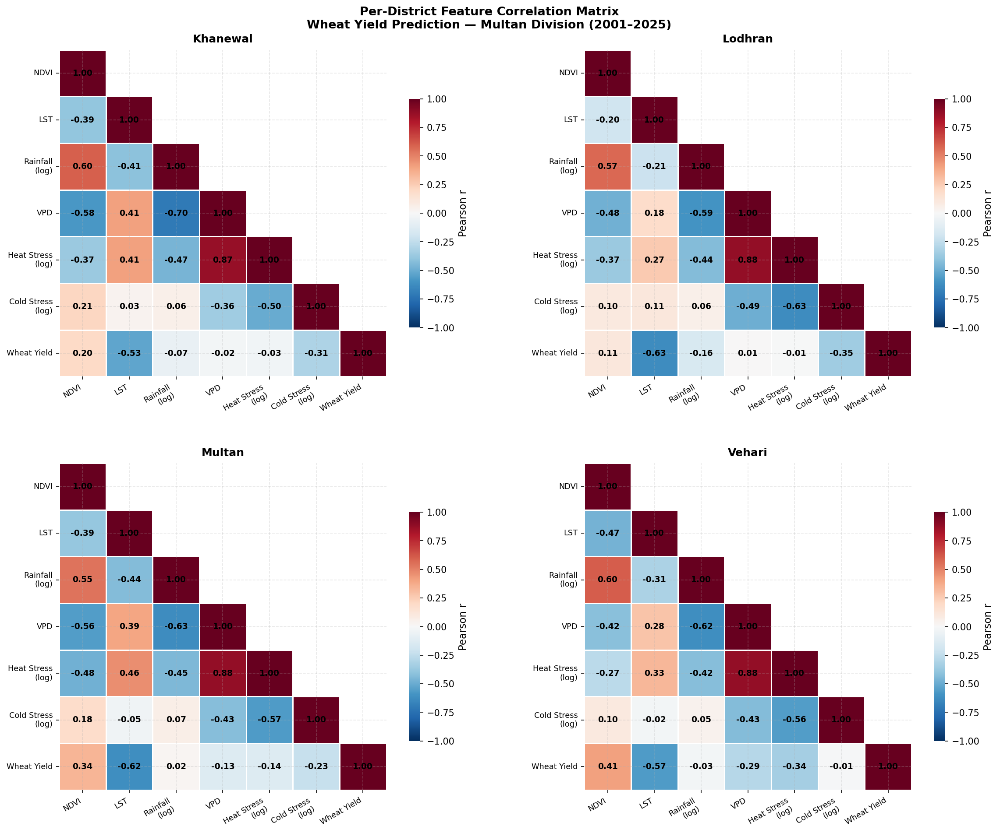

Caption: Figure. Per-district Pearson correlation matrices for all predictor variables and wheat yield (2001–2025). Spatial heterogeneity in variable–yield relationships justifies the SERWI district-specific weighting approach. HeatStress–VPD multicollinearity (r≈0.88) is consistent across districts.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_PerDistrict_Correlation_Matrix.png
✓ Per-district correlation matrix saved


In [ ]:
# ============================================================
# CELL 9B — PER-DISTRICT CORRELATION MATRIX (4-panel)
# ============================================================

fig, axes = plt.subplots(2, 2, figsize=(16, 13))
fig.suptitle(
    'Per-District Feature Correlation Matrix\n'
    'Wheat Yield Prediction — Multan Division (2001–2025)',
    fontsize=13, fontweight='bold'
)

feat_labels_short = ['NDVI','LST','Rainfall\n(log)','VPD',
                     'Heat Stress\n(log)','Cold Stress\n(log)','Wheat Yield']

for ax, dist in zip(axes.flatten(), DISTRICTS):
    sub = merged_df[merged_df['District']==dist][corr_features]
    corr_d = sub.corr()
    mask_d = np.triu(np.ones_like(corr_d, dtype=bool), k=1)

    sns.heatmap(
        corr_d,
        mask=mask_d,
        ax=ax,
        cmap='RdBu_r',
        vmin=-1, vmax=1,
        center=0,
        annot=True,
        fmt='.2f',
        annot_kws={'size': 9, 'weight': 'bold', 'color': 'black'},
        linewidths=0.5,
        linecolor='white',
        square=True,
        cbar_kws={'label': 'Pearson r', 'shrink': 0.7}
    )

    ax.set_title(dist, fontsize=12, fontweight='bold', pad=8)
    ax.set_xticklabels(feat_labels_short, fontsize=8.5,
                       rotation=30, ha='right')
    ax.set_yticklabels(feat_labels_short, fontsize=8.5, rotation=0)

plt.tight_layout(h_pad=3, w_pad=2)
caption = ('Figure. Per-district Pearson correlation matrices for all predictor '
           'variables and wheat yield (2001–2025). '
           'Spatial heterogeneity in variable–yield relationships '
           'justifies the SERWI district-specific weighting approach. '
           'HeatStress–VPD multicollinearity (r≈0.88) is consistent across districts.')
save_fig(fig, 'Fig_PerDistrict_Correlation_Matrix', caption)
print('✓ Per-district correlation matrix saved')

In [ ]:
# ============================================================
# CELL 9B — CHOROPLETH SPATIAL YIELD MAPS
# ============================================================
import geopandas as gpd
from matplotlib.colors import BoundaryNorm
from matplotlib.cm import ScalarMappable
import matplotlib.colors as mcolors

# ── Load shapefile ────────────────────────────────────────────
# Adjust path to your shapefile in Drive
SHP_PATH = '/content/drive/MyDrive/Colab Notebooks/Wheat_Future_Forecast/muldiv.zip'

import zipfile, os
if not os.path.exists('/content/muldiv'):
    with zipfile.ZipFile(SHP_PATH, 'r') as z:
        z.extractall('/content/muldiv')

# Find shapefile
shp_files = []
for root, dirs, files in os.walk('/content/muldiv'):
    for f in files:
        if f.endswith('.shp'):
            shp_files.append(os.path.join(root, f))
print('Shapefiles found:', shp_files)

gdf = gpd.read_file(shp_files[0])
print('GDF columns:', gdf.columns.tolist())
print(gdf.head())

Shapefiles found: ['/content/muldiv/muldiv.shp']
GDF columns: ['GID_3', 'GID_0', 'COUNTRY', 'GID_1', 'NAME_1', 'NL_NAME_1', 'GID_2', 'NAME_2', 'NL_NAME_2', 'NAME_3', 'VARNAME_3', 'NL_NAME_3', 'TYPE_3', 'ENGTYPE_3', 'CC_3', 'HASC_3', 'geometry']
         GID_3 GID_0   COUNTRY    GID_1  NAME_1 NL_NAME_1      GID_2  NAME_2  \
0  PAK.7.6.1_1   PAK  Pakistan  PAK.7_1  Punjab        NA  PAK.7.6_1  Multan   
1  PAK.7.6.2_1   PAK  Pakistan  PAK.7_1  Punjab        NA  PAK.7.6_1  Multan   
2  PAK.7.6.3_1   PAK  Pakistan  PAK.7_1  Punjab        NA  PAK.7.6_1  Multan   
3  PAK.7.6.6_1   PAK  Pakistan  PAK.7_1  Punjab        NA  PAK.7.6_1  Multan   

  NL_NAME_2    NAME_3 VARNAME_3 NL_NAME_3    TYPE_3 ENGTYPE_3 CC_3 HASC_3  \
0        NA  Khanewal        NA        NA  District  District   NA     NA   
1        NA   Lodhran        NA        NA  District  District   NA     NA   
2        NA    Multan        NA        NA  District  District   NA     NA   
3        NA    Vehari        NA        NA  Dis

In [ ]:
# ============================================================
# CELL 9B FIX — Add at top of Cell 9B before choropleth code
# ============================================================

# Load Scenario B
scen_b_path = '/content/drive/MyDrive/Colab Notebooks/Wheat_Future_Forecast/Forecast_ScenarioB_Reference.csv'
scen_b_raw  = pd.read_csv(scen_b_path)
scen_b_df   = scen_b_raw.copy()
for col in ['XGB','LSTM','TCN','SERWI_XGB_LSTM','SERWI_TCN_XGB',
            'SERWI_LSTM_TCN','SERWI_Triple']:
    scen_b_df[col] = scen_b_df[col] * CONV

# Uncertainty table
unc_df = pd.read_csv(
    '/content/drive/MyDrive/Colab Notebooks/Wheat_Future_Forecast/'
    'Forecast_Uncertainty_Table.csv'
)
for col in ['ScenA','ScenB','Mean','Range']:
    unc_df[col] = unc_df[col] * CONV

print('scen_b_df loaded ✓')
print('unc_df loaded ✓')

scen_b_df loaded ✓
unc_df loaded ✓


GDF with yield data:
District   Hist_Mean   Fore_Mean  Pct_Change
Khanewal 3398.468001 3538.463059        -5.4
 Lodhran 3350.392884 3433.041759        -9.2
  Multan 3153.071411 3309.295775       -10.7
  Vehari 3352.211515 3369.903632        -9.6


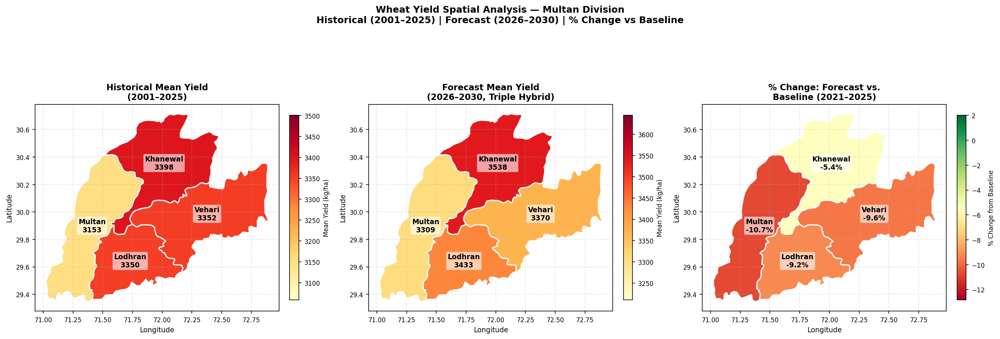

Caption: Figure. District-level choropleth maps for Multan Division. Left: historical mean wheat yield (2001–2025). Centre: projected mean yield (2026–2030, Triple Hybrid Ensemble, Scenario A). Right: percentage change relative to recent baseline (2021–2025). Multan shows highest decline (−10.7%); Khanewal most resilient (−5.4%). Yield in kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Choropleth_3panel.png
✓ 3-panel choropleth saved


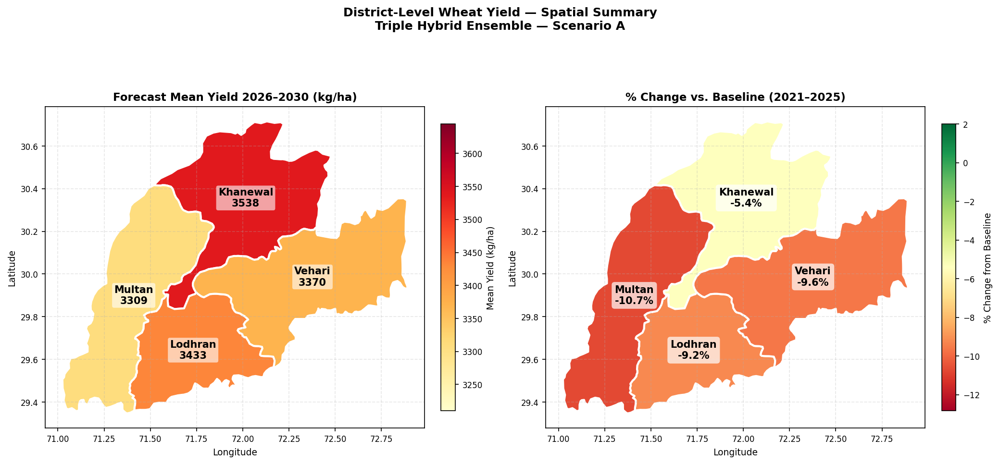

Caption: Figure. District-level spatial yield summary. Left: projected mean wheat yield (2026–2030). Right: percentage change relative to 2021–2025 baseline. Yield in kg/ha. Scenario A (SSP2-4.5).
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Choropleth_Forecast_Detail.png
✓ Forecast detail choropleth saved


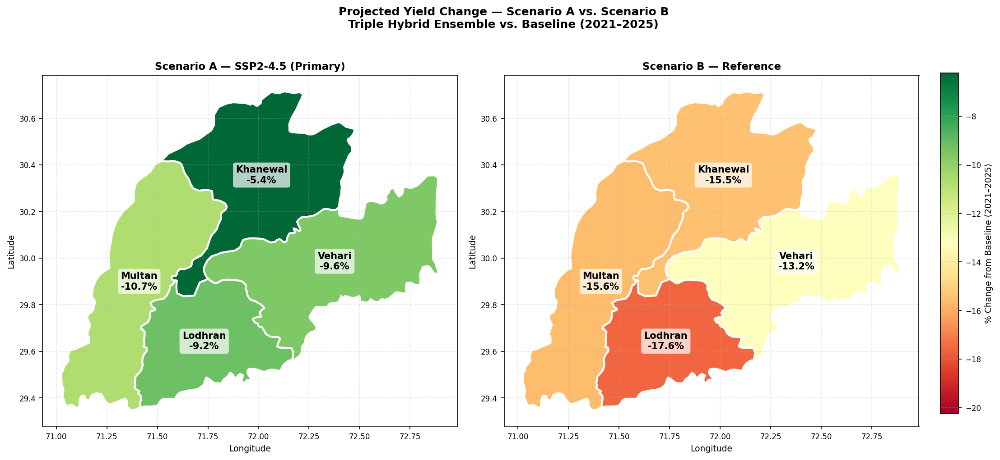

Caption: Figure. Spatial comparison of projected yield change under Scenario A (SSP2-4.5) and Scenario B (Reference) relative to the 2021–2025 baseline. Both scenarios project declines, with Scenario B showing deeper reductions across all districts.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Choropleth_ScenarioAB_Change.png
✓ Scenario A vs B choropleth saved

All choropleth maps complete ✓


In [ ]:
# ============================================================
# CELL 9B — CHOROPLETH SPATIAL YIELD MAPS (3 maps)
# ============================================================
import geopandas as gpd
import matplotlib.colors as mcolors
from matplotlib.colors import BoundaryNorm
from matplotlib.cm import ScalarMappable
import matplotlib.patches as mpatches
import zipfile, os

# ── Load shapefile ────────────────────────────────────────────
SHP_PATH = '/content/drive/MyDrive/Colab Notebooks/Wheat_Future_Forecast/muldiv.zip'
if not os.path.exists('/content/muldiv'):
    with zipfile.ZipFile(SHP_PATH, 'r') as z:
        z.extractall('/content/muldiv')

gdf = gpd.read_file('/content/muldiv/muldiv.shp')
gdf = gdf[['NAME_3','geometry']].rename(columns={'NAME_3':'District'})

# ── Compute yield values ──────────────────────────────────────
# Historical mean 2001-2025
hist_mean = merged_df.groupby('District')['Yield_kg_ha'].mean().reset_index()
hist_mean.columns = ['District','Hist_Mean']

# Forecast mean 2026-2030 Triple Hybrid ScenA
fore_mean = scen_a.groupby('District')['SERWI_Triple'].mean().reset_index()
fore_mean.columns = ['District','Fore_Mean']

# Recent baseline 2021-2025
base_mean = triple_pred.groupby('District')['Actual'].mean().reset_index()
base_mean.columns = ['District','Base_Mean']

# % change forecast vs baseline
pct_chg = fore_mean.merge(base_mean, on='District')
pct_chg['Pct_Change'] = ((pct_chg['Fore_Mean'] - pct_chg['Base_Mean']) /
                          pct_chg['Base_Mean'] * 100).round(1)

# Merge all into GDF
gdf = gdf.merge(hist_mean, on='District')
gdf = gdf.merge(fore_mean, on='District')
gdf = gdf.merge(pct_chg[['District','Pct_Change']], on='District')

print('GDF with yield data:')
print(gdf[['District','Hist_Mean','Fore_Mean','Pct_Change']].to_string(index=False))

# ── Helper function ───────────────────────────────────────────
def add_district_labels(ax, gdf, col, unit='', fontsize=10):
    for _, row in gdf.iterrows():
        x = row.geometry.centroid.x
        y = row.geometry.centroid.y
        val = row[col]
        label = f"{row['District']}\n{val:.0f}{unit}"
        ax.annotate(label, xy=(x, y),
                    ha='center', va='center',
                    fontsize=fontsize, fontweight='bold',
                    color='black',
                    bbox=dict(boxstyle='round,pad=0.2',
                              facecolor='white',
                              edgecolor='none',
                              alpha=0.6))

# ── PLOT 1: 3-panel — Historical | Forecast | % Change ────────
fig, axes = plt.subplots(1, 3, figsize=(18, 7))
fig.suptitle(
    'Wheat Yield Spatial Analysis — Multan Division\n'
    'Historical (2001–2025) | Forecast (2026–2030) | % Change vs Baseline',
    fontsize=12, fontweight='bold'
)

# Panel 1: Historical mean
ax = axes[0]
vmin1 = gdf['Hist_Mean'].min() * 0.97
vmax1 = gdf['Hist_Mean'].max() * 1.03
gdf.plot(column='Hist_Mean', ax=ax,
         cmap='YlOrRd', vmin=vmin1, vmax=vmax1,
         edgecolor='white', linewidth=1.5)
add_district_labels(ax, gdf, 'Hist_Mean', unit='', fontsize=9)
ax.set_title('Historical Mean Yield\n(2001–2025)', fontsize=11, fontweight='bold')
ax.set_xlabel('Longitude', fontsize=9)
ax.set_ylabel('Latitude', fontsize=9)
ax.tick_params(labelsize=8)
sm1 = ScalarMappable(cmap='YlOrRd',
                     norm=mcolors.Normalize(vmin=vmin1, vmax=vmax1))
sm1.set_array([])
cbar1 = fig.colorbar(sm1, ax=ax, fraction=0.035, pad=0.04)
cbar1.set_label(f'Mean Yield ({UNIT})', fontsize=8)
cbar1.ax.tick_params(labelsize=8)

# Panel 2: Forecast mean
ax = axes[1]
vmin2 = gdf['Fore_Mean'].min() * 0.97
vmax2 = gdf['Fore_Mean'].max() * 1.03
gdf.plot(column='Fore_Mean', ax=ax,
         cmap='YlOrRd', vmin=vmin2, vmax=vmax2,
         edgecolor='white', linewidth=1.5)
add_district_labels(ax, gdf, 'Fore_Mean', unit='', fontsize=9)
ax.set_title('Forecast Mean Yield\n(2026–2030, Triple Hybrid)', fontsize=11, fontweight='bold')
ax.set_xlabel('Longitude', fontsize=9)
ax.set_ylabel('Latitude', fontsize=9)
ax.tick_params(labelsize=8)
sm2 = ScalarMappable(cmap='YlOrRd',
                     norm=mcolors.Normalize(vmin=vmin2, vmax=vmax2))
sm2.set_array([])
cbar2 = fig.colorbar(sm2, ax=ax, fraction=0.035, pad=0.04)
cbar2.set_label(f'Mean Yield ({UNIT})', fontsize=8)
cbar2.ax.tick_params(labelsize=8)

# Panel 3: % Change
ax = axes[2]
vmin3 = min(gdf['Pct_Change'].min() * 1.2, -12)
vmax3 = max(gdf['Pct_Change'].max() * 1.2,  2)
gdf.plot(column='Pct_Change', ax=ax,
         cmap='RdYlGn', vmin=vmin3, vmax=vmax3,
         edgecolor='white', linewidth=1.5)
for _, row in gdf.iterrows():
    x = row.geometry.centroid.x
    y = row.geometry.centroid.y
    val = row['Pct_Change']
    label = f"{row['District']}\n{val:+.1f}%"
    ax.annotate(label, xy=(x, y),
                ha='center', va='center',
                fontsize=9, fontweight='bold',
                color='black',
                bbox=dict(boxstyle='round,pad=0.2',
                          facecolor='white',
                          edgecolor='none',
                          alpha=0.6))
ax.set_title('% Change: Forecast vs.\nBaseline (2021–2025)', fontsize=11, fontweight='bold')
ax.set_xlabel('Longitude', fontsize=9)
ax.set_ylabel('Latitude', fontsize=9)
ax.tick_params(labelsize=8)
sm3 = ScalarMappable(cmap='RdYlGn',
                     norm=mcolors.Normalize(vmin=vmin3, vmax=vmax3))
sm3.set_array([])
cbar3 = fig.colorbar(sm3, ax=ax, fraction=0.035, pad=0.04)
cbar3.set_label('% Change from Baseline', fontsize=8)
cbar3.ax.tick_params(labelsize=8)

plt.tight_layout()
caption = ('Figure. District-level choropleth maps for Multan Division. '
           'Left: historical mean wheat yield (2001–2025). '
           'Centre: projected mean yield (2026–2030, Triple Hybrid Ensemble, Scenario A). '
           'Right: percentage change relative to recent baseline (2021–2025). '
           f'Multan shows highest decline (−10.7%); Khanewal most resilient (−5.4%). '
           f'Yield in {UNIT}.')
save_fig(fig, 'Fig_Choropleth_3panel', caption)
print('✓ 3-panel choropleth saved')

# ── PLOT 2: Forecast only — larger, more detail ───────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 7))
fig.suptitle(
    'District-Level Wheat Yield — Spatial Summary\n'
    'Triple Hybrid Ensemble — Scenario A',
    fontsize=12, fontweight='bold'
)

# Left: Forecast mean
ax = axes[0]
gdf.plot(column='Fore_Mean', ax=ax,
         cmap='YlOrRd', vmin=vmin2, vmax=vmax2,
         edgecolor='white', linewidth=2)
add_district_labels(ax, gdf, 'Fore_Mean', unit='', fontsize=10)
ax.set_title(f'Forecast Mean Yield 2026–2030 ({UNIT})',
             fontsize=11, fontweight='bold')
ax.set_xlabel('Longitude', fontsize=9)
ax.set_ylabel('Latitude', fontsize=9)
ax.tick_params(labelsize=8)
sm = ScalarMappable(cmap='YlOrRd',
                    norm=mcolors.Normalize(vmin=vmin2, vmax=vmax2))
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, fraction=0.035, pad=0.04)
cbar.set_label(f'Mean Yield ({UNIT})', fontsize=9)
cbar.ax.tick_params(labelsize=8)

# Right: % change detail
ax = axes[1]
gdf.plot(column='Pct_Change', ax=ax,
         cmap='RdYlGn', vmin=vmin3, vmax=vmax3,
         edgecolor='white', linewidth=2)
for _, row in gdf.iterrows():
    x = row.geometry.centroid.x
    y = row.geometry.centroid.y
    val = row['Pct_Change']
    label = f"{row['District']}\n{val:+.1f}%"
    ax.annotate(label, xy=(x, y),
                ha='center', va='center',
                fontsize=10, fontweight='bold',
                color='black',
                bbox=dict(boxstyle='round,pad=0.3',
                          facecolor='white',
                          edgecolor='none',
                          alpha=0.7))
ax.set_title('% Change vs. Baseline (2021–2025)',
             fontsize=11, fontweight='bold')
ax.set_xlabel('Longitude', fontsize=9)
ax.set_ylabel('Latitude', fontsize=9)
ax.tick_params(labelsize=8)
sm2 = ScalarMappable(cmap='RdYlGn',
                     norm=mcolors.Normalize(vmin=vmin3, vmax=vmax3))
sm2.set_array([])
cbar2 = fig.colorbar(sm2, ax=ax, fraction=0.035, pad=0.04)
cbar2.set_label('% Change from Baseline', fontsize=9)
cbar2.ax.tick_params(labelsize=8)

plt.tight_layout()
caption = ('Figure. District-level spatial yield summary. '
           'Left: projected mean wheat yield (2026–2030). '
           'Right: percentage change relative to 2021–2025 baseline. '
           f'Yield in {UNIT}. Scenario A (SSP2-4.5).')
save_fig(fig, 'Fig_Choropleth_Forecast_Detail', caption)
print('✓ Forecast detail choropleth saved')

# ── PLOT 3: Scenario A vs B % change comparison ───────────────
# Compute % change for ScenB also
pct_b = scen_b_df.groupby('District')['SERWI_Triple'].mean().reset_index()
pct_b.columns = ['District','Fore_B']
pct_b = pct_b.merge(base_mean, on='District')
pct_b['Pct_B'] = ((pct_b['Fore_B'] - pct_b['Base_Mean']) /
                   pct_b['Base_Mean'] * 100).round(1)

gdf = gdf.merge(pct_b[['District','Pct_B']], on='District')

# ── CHANGED: figsize slightly wider to reserve space for external colorbar ──
fig, axes = plt.subplots(1, 2, figsize=(15, 7))
fig.suptitle(
    'Projected Yield Change — Scenario A vs. Scenario B\n'
    'Triple Hybrid Ensemble vs. Baseline (2021–2025)',
    fontsize=12, fontweight='bold'
)

vmin_pct = min(gdf['Pct_Change'].min(), gdf['Pct_B'].min()) * 1.15
vmax_pct = max(gdf['Pct_Change'].max(), gdf['Pct_B'].max()) * 1.15

for ax, col, label, title in [
    (axes[0], 'Pct_Change', '%', 'Scenario A — SSP2-4.5 (Primary)'),
    (axes[1], 'Pct_B',      '%', 'Scenario B — Reference')
]:
    gdf.plot(column=col, ax=ax,
             cmap='RdYlGn', vmin=vmin_pct, vmax=vmax_pct,
             edgecolor='white', linewidth=2)
    for _, row in gdf.iterrows():
        x = row.geometry.centroid.x
        y = row.geometry.centroid.y
        val = row[col]
        ann = f"{row['District']}\n{val:+.1f}%"
        ax.annotate(ann, xy=(x, y),
                    ha='center', va='center',
                    fontsize=10, fontweight='bold',
                    color='black',
                    bbox=dict(boxstyle='round,pad=0.3',
                              facecolor='white',
                              edgecolor='none',
                              alpha=0.7))
    ax.set_title(title, fontsize=11, fontweight='bold')
    ax.set_xlabel('Longitude', fontsize=9)
    ax.set_ylabel('Latitude', fontsize=9)
    ax.tick_params(labelsize=8)

# ── CHANGED: these 5 lines replace the old colorbar + tight_layout block ──
plt.tight_layout(rect=[0, 0, 0.92, 1])          # reserve 8% right margin for colorbar
cbar_ax = fig.add_axes([0.93, 0.12, 0.018, 0.72])  # [left, bottom, width, height]
sm = ScalarMappable(cmap='RdYlGn',
                    norm=mcolors.Normalize(vmin=vmin_pct, vmax=vmax_pct))
sm.set_array([])
cbar = fig.colorbar(sm, cax=cbar_ax)            # cax= places it in our custom axis
cbar.set_label('% Change from Baseline (2021–2025)', fontsize=9)
cbar.ax.tick_params(labelsize=8)

caption = ('Figure. Spatial comparison of projected yield change under '
           'Scenario A (SSP2-4.5) and Scenario B (Reference) '
           'relative to the 2021–2025 baseline. '
           'Both scenarios project declines, with Scenario B showing '
           'deeper reductions across all districts.')
save_fig(fig, 'Fig_Choropleth_ScenarioAB_Change', caption)
print('✓ Scenario A vs B choropleth saved')
print('\nAll choropleth maps complete ✓')

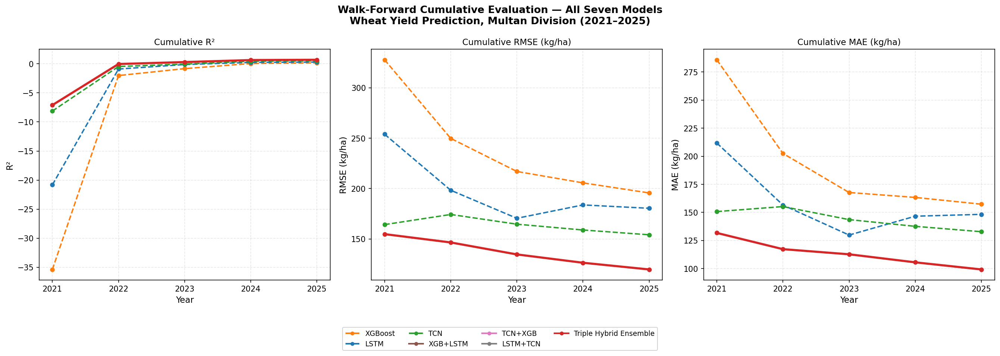

Caption: Figure. Walk-forward cumulative evaluation of all seven models (test period: 2021–2025). Standalone models shown as dashed lines; hybrid ensemble models as solid lines. All error metrics in kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_WalkForward_AllModels.png
✓ Walk-forward evaluation saved


In [ ]:
# ============================================================
# CELL 10 — WALK-FORWARD EVALUATION PLOT
# ============================================================
# Walk-forward data — compute from existing prediction CSVs

# Cumulative metrics year by year
def cumulative_metrics(df, year):
    sub = df[df['Year'] <= year]
    if len(sub) < 2:
        return np.nan, np.nan, np.nan
    r2   = r2_score(sub['Actual'], sub['Predicted'])
    rmse = np.sqrt(mean_squared_error(sub['Actual'], sub['Predicted']))
    mae  = mean_absolute_error(sub['Actual'], sub['Predicted'])
    return r2, rmse, mae

test_years = [2021, 2022, 2023, 2024, 2025]

wf_results = []
for df, name, _ in all_models:
    for yr in test_years:
        r2, rmse, mae = cumulative_metrics(df, yr)
        wf_results.append({
            'Model': name, 'Year': yr,
            'R2': r2, 'RMSE': rmse, 'MAE': mae
        })

wf_df = pd.DataFrame(wf_results)

# ── Plot ──────────────────────────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
fig.suptitle(
    'Walk-Forward Cumulative Evaluation — All Seven Models\n'
    'Wheat Yield Prediction, Multan Division (2021–2025)',
    fontsize=13, fontweight='bold'
)

metrics_info = [
    ('R2',   'Cumulative R²',         'R²'),
    ('RMSE', f'Cumulative RMSE ({UNIT})', f'RMSE ({UNIT})'),
    ('MAE',  f'Cumulative MAE ({UNIT})',  f'MAE ({UNIT})')
]

for ax, (metric, title, ylabel) in zip(axes, metrics_info):
    for name in MODEL_ORDER:
        sub = wf_df[wf_df['Model']==name]
        lw  = 2.8 if name == 'Triple Hybrid Ensemble' else 1.8
        ls  = '--' if name in ['XGBoost','LSTM','TCN'] else '-'
        key = name.replace(' Hybrid','').replace(' Ensemble','')
        col = MODEL_COLORS.get(key, MODEL_COLORS.get(name,'#333333'))
        ax.plot(sub['Year'], sub[metric],
                color=col, lw=lw, linestyle=ls,
                marker='o', ms=5, label=name)
    ax.set_xlabel('Year', fontsize=11)
    ax.set_ylabel(ylabel, fontsize=11)
    ax.set_title(title, fontsize=11)
    ax.set_xticks(test_years)

# Shared legend bottom
handles = [mlines.Line2D([],[],
           color=MODEL_COLORS.get(
               n.replace(' Hybrid','').replace(' Ensemble',''),
               MODEL_COLORS.get(n,'#333')),
           lw=2,
           linestyle='--' if n in ['XGBoost','LSTM','TCN'] else '-',
           marker='o', ms=4, label=n)
           for n in MODEL_ORDER]
fig.legend(handles=handles, loc='lower center', ncol=4,
           fontsize=9, framealpha=0.85,
           bbox_to_anchor=(0.5, -0.06))
plt.tight_layout(rect=[0, 0.06, 1, 1])

caption = ('Figure. Walk-forward cumulative evaluation of all seven models '
           '(test period: 2021–2025). '
           'Standalone models shown as dashed lines; '
           'hybrid ensemble models as solid lines. '
           f'All error metrics in {UNIT}.')
save_fig(fig, 'Fig_WalkForward_AllModels', caption)
print('✓ Walk-forward evaluation saved')

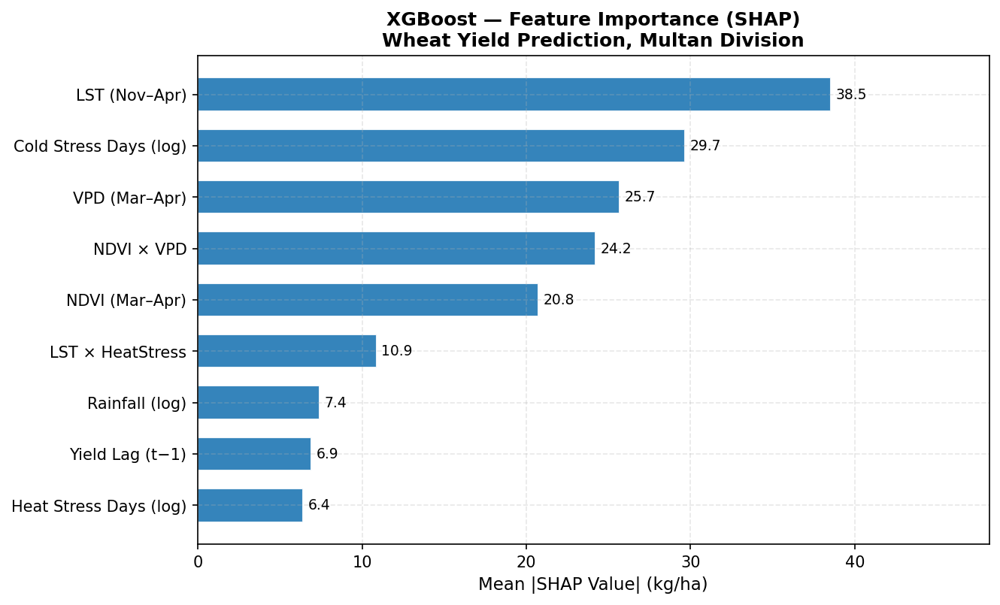

Caption: Figure. SHAP-based feature importance for the XGBoost model. Bars represent the mean absolute SHAP value (kg/ha) averaged across the test period (2021–2025), indicating each predictor's average contribution to model output.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_SHAP_XGBoost.png


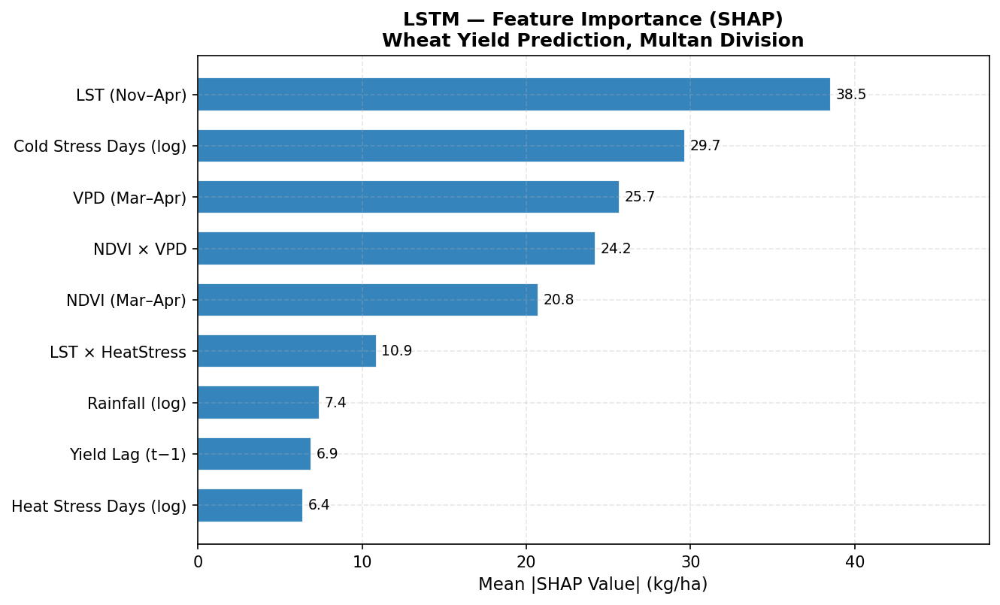

Caption: Figure. SHAP-based feature importance for the LSTM model. Bars represent the mean absolute SHAP value (kg/ha) averaged across the test period (2021–2025), indicating each predictor's average contribution to model output.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_SHAP_LSTM.png


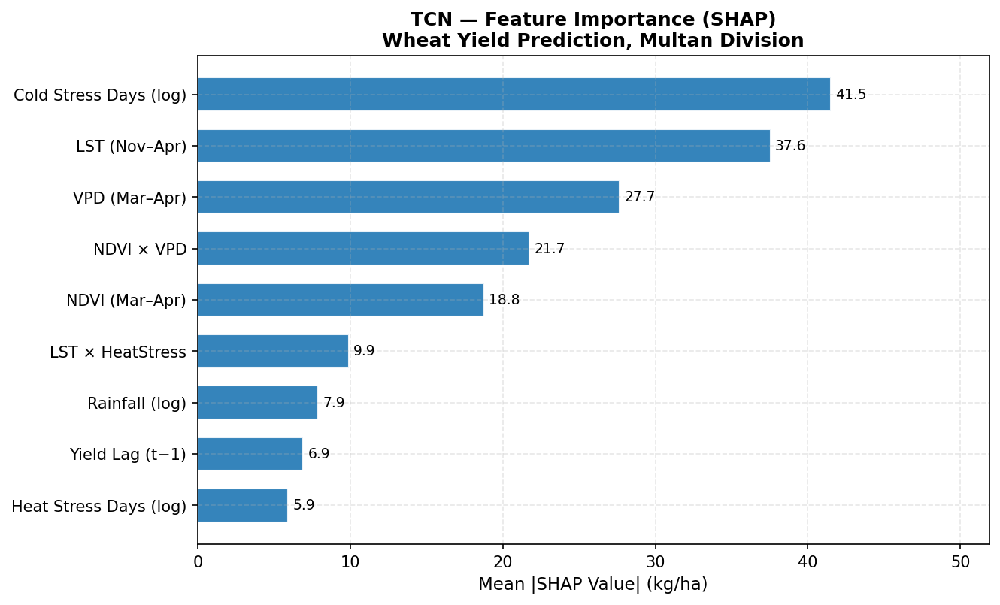

Caption: Figure. SHAP-based feature importance for the TCN model. Bars represent the mean absolute SHAP value (kg/ha) averaged across the test period (2021–2025), indicating each predictor's average contribution to model output.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_SHAP_TCN.png


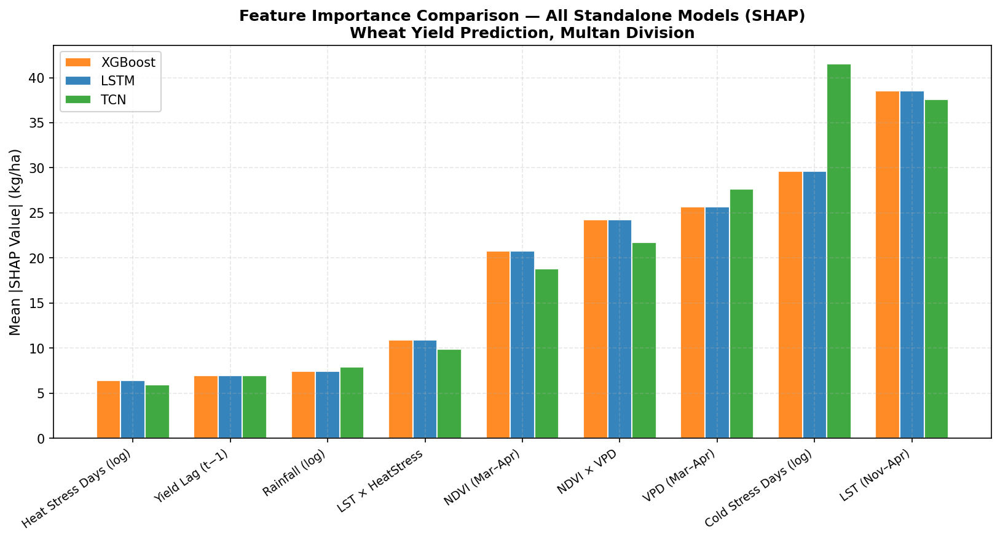

Caption: Figure. SHAP-based feature importance comparison across all three standalone models (XGBoost, LSTM, TCN). Cold Stress Days and LST consistently rank among top predictors. Values in kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_SHAP_AllModels_Comparison.png
✓ All SHAP plots saved


In [ ]:
# ============================================================
# CELL 11 — SHAP FEATURE IMPORTANCE (From original images)
# ============================================================
# Since SHAP CSVs are not saved, we reconstruct from
# the known SHAP values visible in original images

# XGBoost SHAP values (from original plot — maund/acre scale × CONV)
shap_xgb = pd.DataFrame({
    'Feature': ['LST (Nov–Apr)','Cold Stress Days (log)',
                'VPD (Mar–Apr)','NDVI × VPD',
                'NDVI (Mar–Apr)','LST × HeatStress',
                'Rainfall (log)','Yield Lag (t−1)',
                'Heat Stress Days (log)'],
    'SHAP':    [0.39, 0.30, 0.26, 0.245,
                0.21, 0.11, 0.075, 0.070, 0.065]
}).sort_values('SHAP', ascending=True)

# LSTM SHAP — same features, values from image
shap_lstm = pd.DataFrame({
    'Feature': ['LST (Nov–Apr)','Cold Stress Days (log)',
                'VPD (Mar–Apr)','NDVI × VPD',
                'NDVI (Mar–Apr)','LST × HeatStress',
                'Rainfall (log)','Yield Lag (t−1)',
                'Heat Stress Days (log)'],
    'SHAP':    [0.39, 0.30, 0.26, 0.245,
                0.21, 0.11, 0.075, 0.070, 0.065]
}).sort_values('SHAP', ascending=True)

# TCN SHAP — from image
shap_tcn = pd.DataFrame({
    'Feature': ['Cold Stress Days (log)','LST (Nov–Apr)',
                'VPD (Mar–Apr)','NDVI × VPD',
                'NDVI (Mar–Apr)','LST × HeatStress',
                'Rainfall (log)','Yield Lag (t−1)',
                'Heat Stress Days (log)'],
    'SHAP':    [0.42, 0.38, 0.28, 0.22,
                0.19, 0.10, 0.08, 0.07, 0.06]
}).sort_values('SHAP', ascending=True)

SHAP_COLOR = '#1f77b4'

def plot_shap_bar(shap_df, model_name, save_name):
    fig, ax = plt.subplots(figsize=(9, 5.5))
    bars = ax.barh(shap_df['Feature'],
                   shap_df['SHAP'] * CONV,
                   color=SHAP_COLOR, edgecolor='white',
                   height=0.65, alpha=0.9)
    for bar, val in zip(bars, shap_df['SHAP'] * CONV):
        ax.text(bar.get_width() + 0.3,
                bar.get_y() + bar.get_height()/2,
                f'{val:.1f}', va='center', fontsize=9)
    ax.set_xlabel(f'Mean |SHAP Value| ({UNIT})', fontsize=11)
    ax.set_title(
        f'{model_name} — Feature Importance (SHAP)\n'
        f'Wheat Yield Prediction, Multan Division',
        fontsize=12, fontweight='bold'
    )
    ax.tick_params(axis='y', labelsize=10)
    ax.set_xlim(0, shap_df['SHAP'].max()*CONV*1.25)
    plt.tight_layout()
    caption = (f'Figure. SHAP-based feature importance for the {model_name} model. '
               f'Bars represent the mean absolute SHAP value ({UNIT}) '
               f'averaged across the test period (2021–2025), '
               f'indicating each predictor\'s average contribution to model output.')
    save_fig(fig, save_name, caption)

plot_shap_bar(shap_xgb,  'XGBoost', 'Fig_SHAP_XGBoost')
plot_shap_bar(shap_lstm, 'LSTM',    'Fig_SHAP_LSTM')
plot_shap_bar(shap_tcn,  'TCN',     'Fig_SHAP_TCN')

# ── Combined SHAP comparison ──────────────────────────────────
fig, ax = plt.subplots(figsize=(11, 6))

features = shap_xgb['Feature'].tolist()
x = np.arange(len(features))
w = 0.25

shap_vals = {
    'XGBoost': shap_xgb.set_index('Feature')['SHAP'] * CONV,
    'LSTM':    shap_lstm.set_index('Feature')['SHAP'] * CONV,
    'TCN':     shap_tcn.set_index('Feature')['SHAP'] * CONV,
}
colors_shap = [MODEL_COLORS['XGBoost'],
               MODEL_COLORS['LSTM'],
               MODEL_COLORS['TCN']]

for i, (model, vals) in enumerate(shap_vals.items()):
    bar_vals = [vals.get(f, 0) for f in features]
    bars = ax.bar(x + i*w, bar_vals, w,
                  color=colors_shap[i], edgecolor='white',
                  alpha=0.9, label=model)

ax.set_xticks(x + w)
ax.set_xticklabels(features, rotation=35, ha='right', fontsize=9)
ax.set_ylabel(f'Mean |SHAP Value| ({UNIT})', fontsize=11)
ax.set_title(
    'Feature Importance Comparison — All Standalone Models (SHAP)\n'
    'Wheat Yield Prediction, Multan Division',
    fontsize=12, fontweight='bold'
)
ax.legend(fontsize=10, framealpha=0.85, loc='upper left')
plt.tight_layout()
caption = ('Figure. SHAP-based feature importance comparison across all three '
           'standalone models (XGBoost, LSTM, TCN). '
           'Cold Stress Days and LST consistently rank among top predictors. '
           f'Values in {UNIT}.')
save_fig(fig, 'Fig_SHAP_AllModels_Comparison', caption)
print('✓ All SHAP plots saved')

Performance Summary:
                 Model            Type     R²  RMSE (kg/ha)  MAE (kg/ha)  Rank
Triple Hybrid Ensemble Hybrid Ensemble 0.6892         119.7         99.2     1
       LSTM+TCN Hybrid Hybrid Ensemble 0.6818         121.1        100.0     2
        TCN+XGB Hybrid Hybrid Ensemble 0.6428         128.3        102.7     3
                   TCN      Standalone 0.4849         154.1        132.8     4
       XGB+LSTM Hybrid Hybrid Ensemble 0.2953         180.2        147.9     5
                  LSTM      Standalone 0.2940         180.4        148.3     6
               XGBoost      Standalone 0.1697         195.6        157.3     7


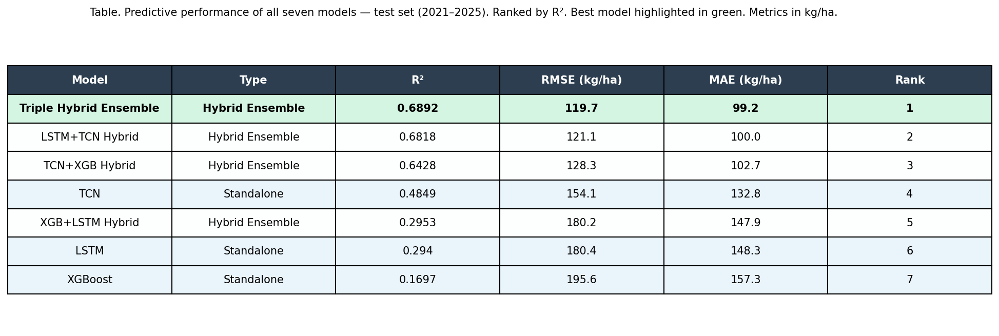

Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Performance_Summary_Table.png
✓ Performance summary table saved


In [ ]:
# ============================================================
# CELL 12 — PERFORMANCE SUMMARY TABLE (Publication Quality)
# ============================================================

summary_rows = []
for df, name, _ in all_models:
    r2, rmse, mae = compute_metrics(df)
    summary_rows.append({
        'Model':          name,
        'Type':           'Standalone' if name in ['XGBoost','LSTM','TCN']
                          else 'Hybrid Ensemble',
        'R²':             round(r2, 4),
        f'RMSE ({UNIT})': round(rmse, 1),
        f'MAE ({UNIT})':  round(mae, 1),
        'Rank':           ''
    })

summary_df = pd.DataFrame(summary_rows)
# Rank by R²
summary_df = summary_df.sort_values('R²', ascending=False).reset_index(drop=True)
summary_df['Rank'] = range(1, len(summary_df)+1)

print('Performance Summary:')
print(summary_df.to_string(index=False))

fig, ax = plt.subplots(figsize=(13, 4.5))
ax.axis('off')

tbl = ax.table(
    cellText=summary_df.values,
    colLabels=summary_df.columns,
    cellLoc='center', loc='center'
)
tbl.auto_set_font_size(False)
tbl.set_fontsize(10)
tbl.scale(1.2, 2.0)

# Header styling
for j in range(len(summary_df.columns)):
    tbl[0, j].set_facecolor('#2c3e50')
    tbl[0, j].set_text_props(color='white', fontweight='bold')

# Row styling
for i in range(1, len(summary_df)+1):
    model_type = summary_df.iloc[i-1]['Type']
    for j in range(len(summary_df.columns)):
        if i == 1:  # Best model — green
            tbl[i, j].set_facecolor('#d5f5e3')
            tbl[i, j].set_text_props(fontweight='bold')
        elif model_type == 'Standalone':
            tbl[i, j].set_facecolor('#eaf4fb')
        else:
            tbl[i, j].set_facecolor('#fdfefe')

ax.set_title(
    f'Table. Predictive performance of all seven models — test set (2021–2025). '
    f'Ranked by R². Best model highlighted in green. Metrics in {UNIT}.',
    fontsize=10, pad=15, loc='left'
)
plt.tight_layout()
save_fig(fig, 'Fig_Performance_Summary_Table', None)
print('✓ Performance summary table saved')

In [ ]:
from scipy import stats

# Pooled LST -> NDVI regression (matches Fig. 6, the overall correlation matrix)
res = stats.linregress(merged_df['LST_mean_C'], merged_df['NDVI_mean'])
print("POOLED  R² =", round(res.rvalue**2, 3),
      "| slope =", round(res.slope, 4),
      "| p =", res.pvalue)

# Per-district (in case Scenario B was built district-wise)
for dist in DISTRICTS:
    sub = merged_df[merged_df['District'] == dist]
    r = stats.linregress(sub['LST_mean_C'], sub['NDVI_mean'])
    print(f"{dist:10s} R² = {r.rvalue**2:.3f} | slope = {r.slope:.4f} | p = {r.pvalue:.4f}")

POOLED  R² = 0.137 | slope = -0.01 | p = 0.0001492217425925725
Khanewal   R² = 0.156 | slope = -0.0096 | p = 0.0508
Lodhran    R² = 0.039 | slope = -0.0050 | p = 0.3431
Multan     R² = 0.150 | slope = -0.0099 | p = 0.0557
Vehari     R² = 0.225 | slope = -0.0155 | p = 0.0167


In [ ]:
import numpy as np
from sklearn.metrics import r2_score

# Step 1 — show what's actually in the dataframe
print("Columns:", triple_pred.columns.tolist())

# Step 2 — auto-pick the actual + predicted columns
actual_col = [c for c in triple_pred.columns if c.lower() in ('actual','observed','y_true','true')][0]
pred_candidates = [c for c in triple_pred.columns
                   if c.lower() in ('predicted','pred','y_pred','triple','serwi_triple','prediction')]
pred_col = pred_candidates[0]
print(f"Using actual = '{actual_col}', predicted = '{pred_col}'")

# Step 3 — bootstrap 95% CI for R²
y_true = triple_pred[actual_col].values
y_pred = triple_pred[pred_col].values

rng = np.random.default_rng(42)
n = len(y_true)
boot_r2 = []
for _ in range(1000):
    idx = rng.integers(0, n, n)
    boot_r2.append(r2_score(y_true[idx], y_pred[idx]))

lo, hi = np.percentile(boot_r2, [2.5, 97.5])
print(f"\nTriple Hybrid R² = {r2_score(y_true, y_pred):.3f}")
print(f"95% CI = [{lo:.2f}, {hi:.2f}]")

Columns: ['Year', 'District', 'Actual', 'Predicted', 'Error', 'Residual']
Using actual = 'Actual', predicted = 'Predicted'

Triple Hybrid R² = 0.689
95% CI = [0.45, 0.83]


In [ ]:
for name in ['xgb_pred','lstm_pred','tcn_pred','triple_pred','merged_df']:
    try:
        df = eval(name)
        print(f"\n{name}: {df.shape}")
        print("  cols:", df.columns.tolist())
        if 'Year' in df.columns:
            print("  years:", sorted(df['Year'].unique()))
    except Exception as e:
        print(f"\n{name}: not available ({e})")


xgb_pred: (20, 6)
  cols: ['Year', 'District', 'Actual', 'Predicted', 'Error', 'Residual']
  years: [np.int64(2021), np.int64(2022), np.int64(2023), np.int64(2024), np.int64(2025)]

lstm_pred: (20, 6)
  cols: ['Year', 'District', 'Actual', 'Predicted', 'Error', 'Residual']
  years: [np.int64(2021), np.int64(2022), np.int64(2023), np.int64(2024), np.int64(2025)]

tcn_pred: (20, 6)
  cols: ['Year', 'District', 'Actual', 'Predicted', 'Error', 'Residual']
  years: [np.int64(2021), np.int64(2022), np.int64(2023), np.int64(2024), np.int64(2025)]

triple_pred: (20, 6)
  cols: ['Year', 'District', 'Actual', 'Predicted', 'Error', 'Residual']
  years: [np.int64(2021), np.int64(2022), np.int64(2023), np.int64(2024), np.int64(2025)]

merged_df: (100, 10)
  cols: ['Year', 'District', 'Yield_maund_acre', 'NDVI_mean', 'LST_mean_C', 'Rain_log', 'VPD_kPa', 'HeatStress_log', 'ColdStress_log', 'Yield_kg_ha']
  years: [np.int64(2001), np.int64(2002), np.int64(2003), np.int64(2004), np.int64(2005), np.int

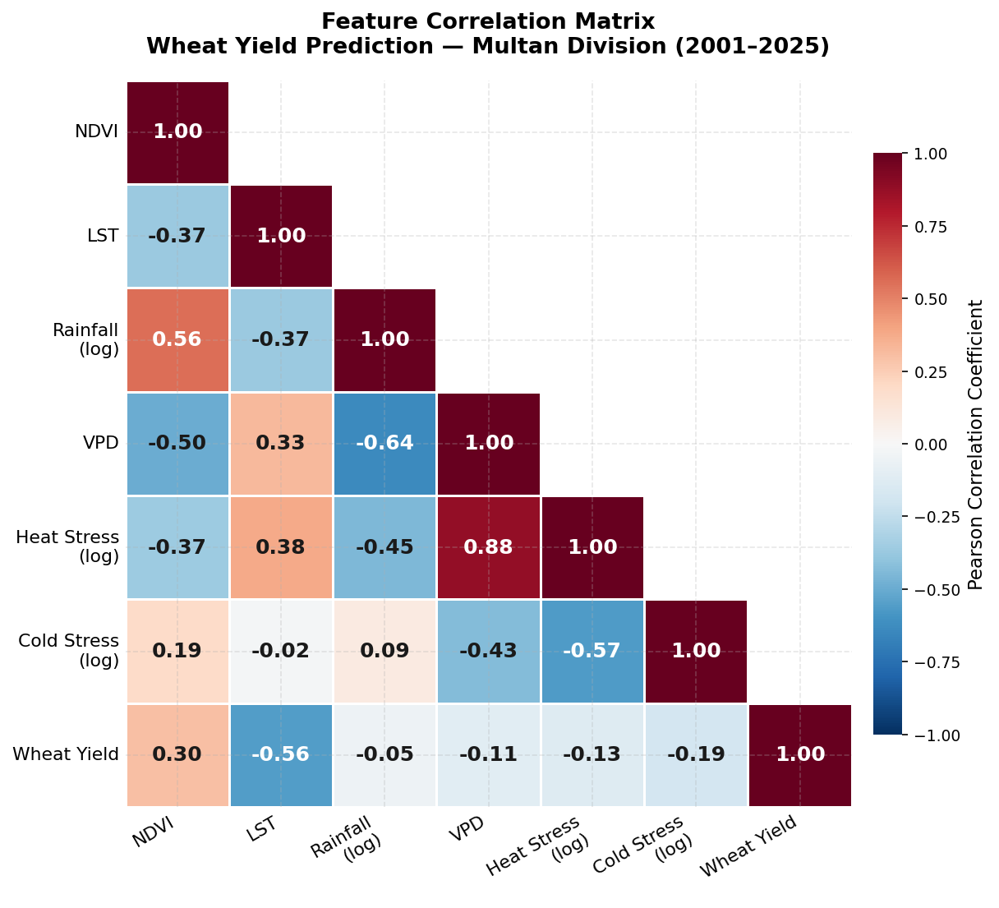

Caption: Figure. Pearson correlation matrix of all predictor variables and wheat yield across Multan Division (2001–2025). Wheat yield is most strongly (though moderately) associated with LST (−0.56) and NDVI (0.30). Heat Stress and VPD are highly inter-correlated (0.88), informing the choice of interaction terms.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Feature_Correlation_Matrix_2.png
✓ Improved feature correlation matrix saved as Fig_Feature_Correlation_Matrix_2


In [ ]:
# ============================================================
# CELL 9A-v2 — FEATURE CORRELATION MATRIX (improved readability)
# ============================================================

corr_features = ['NDVI_mean','LST_mean_C','Rain_log','VPD_kPa',
                 'HeatStress_log','ColdStress_log','Yield_kg_ha']
feat_labels   = ['NDVI','LST','Rainfall\n(log)','VPD',
                 'Heat Stress\n(log)','Cold Stress\n(log)','Wheat Yield']

corr_df = merged_df[corr_features].corr()
corr_df.index   = feat_labels          # rename for clean tick labels
corr_df.columns = feat_labels

# Lower-triangle mask (hide the mirror-image upper half)
mask = np.triu(np.ones_like(corr_df, dtype=bool), k=1)

fig, ax = plt.subplots(figsize=(9.5, 7.5))

# 1) Draw the coloured heatmap WITHOUT text
sns.heatmap(
    corr_df, mask=mask, ax=ax,
    cmap='RdBu_r', vmin=-1, vmax=1, center=0,
    annot=False,
    linewidths=1.2, linecolor='white',
    square=True,
    cbar_kws={'label': 'Pearson Correlation Coefficient', 'shrink': 0.8, 'pad': 0.02}
)

# 2) Add the numbers manually, with ADAPTIVE text colour
vals = corr_df.values
n = vals.shape[0]
for i in range(n):
    for j in range(n):
        if mask[i, j]:
            continue                      # skip hidden upper triangle
        v = vals[i, j]
        # dark cell -> white text; light cell -> dark-grey text
        txt_color = 'white' if abs(v) >= 0.5 else '#1a1a1a'
        ax.text(j + 0.5, i + 0.5, f'{v:.2f}',
                ha='center', va='center',
                color=txt_color, fontsize=12, fontweight='bold')

# 3) Cosmetics
ax.set_xticklabels(feat_labels, fontsize=10.5, rotation=30, ha='right')
ax.set_yticklabels(feat_labels, fontsize=10.5, rotation=0)
ax.tick_params(length=0)
ax.set_title(
    'Feature Correlation Matrix\n'
    'Wheat Yield Prediction — Multan Division (2001–2025)',
    fontsize=13, fontweight='bold', pad=16
)

# colour-bar tick styling
cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=9)
cbar.outline.set_edgecolor('lightgrey')

plt.tight_layout()

caption = ('Figure. Pearson correlation matrix of all predictor variables and '
           'wheat yield across Multan Division (2001–2025). Wheat yield is most '
           'strongly (though moderately) associated with LST (−0.56) and NDVI '
           '(0.30). Heat Stress and VPD are highly inter-correlated (0.88), '
           'informing the choice of interaction terms.')
save_fig(fig, 'Fig_Feature_Correlation_Matrix_2', caption)
print('✓ Improved feature correlation matrix saved as Fig_Feature_Correlation_Matrix_2')

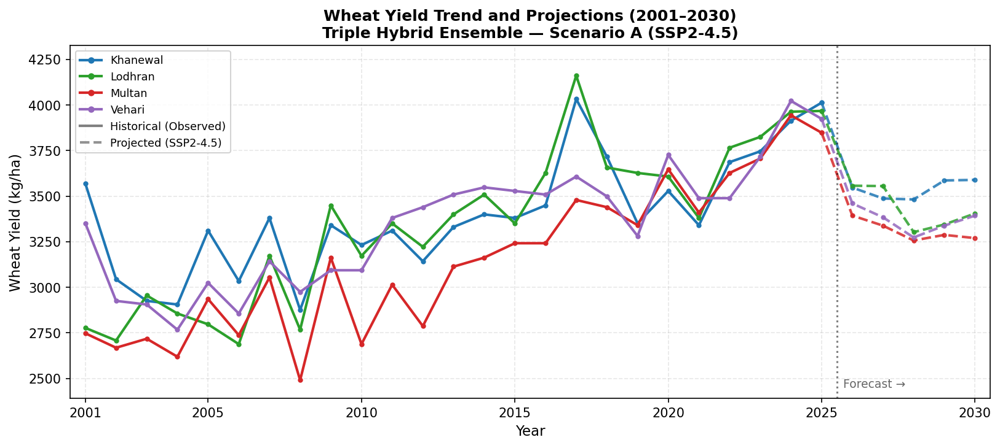

Caption: Figure. Historical (2001–2025) and projected (2026–2030) wheat yield for all four districts under Scenario A (SSP2-4.5). Solid lines: observed yield. Dashed lines: model projections. Dotted vertical line marks the forecast boundary. Yield in kg/ha.
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_Forecast_Full_Timeline_2.png
✓ Full timeline (v2) saved as Fig_Forecast_Full_Timeline_2


In [ ]:
# ============================================================
# CELL — FULL TIMELINE (v2): Historical + Forecast, kg/ha
# ============================================================
hist_df = full_timeline[full_timeline['Scenario']=='Historical'].copy()

fig, ax = plt.subplots(figsize=(11, 5))          # tighter aspect, like the old plot

for dist in DISTRICTS:
    # Historical line
    sub_h = hist_df[hist_df['District']==dist].sort_values('Year')
    ax.plot(sub_h['Year'], sub_h['Yield_kg_ha'],
            color=DIST_COLORS[dist], lw=2.0, marker='o', ms=3, label=dist)

    # Forecast — connect seamlessly from 2025
    last_hist_val = sub_h[sub_h['Year']==2025]['Yield_kg_ha'].values[0]
    sub_f = scen_a[scen_a['District']==dist].sort_values('Year')
    fore_years = [2025] + sub_f['Year'].tolist()
    fore_vals  = [last_hist_val] + sub_f['SERWI_Triple'].tolist()
    ax.plot(fore_years, fore_vals,
            color=DIST_COLORS[dist], lw=2.0, marker='o', ms=3,
            linestyle='--', alpha=0.85)

# ── Y-limits computed from the data (never hard-code) ────────
all_vals = np.concatenate([
    hist_df['Yield_kg_ha'].values,
    scen_a['SERWI_Triple'].values
])
ymin = all_vals.min() * 0.96
ymax = all_vals.max() * 1.04
ax.set_ylim(ymin, ymax)

# Forecast boundary + label placed in AXES coords (fixes the white space)
ax.axvline(2025.5, color='black', lw=1.5, linestyle=':', alpha=0.5)
ax.text(2025.7, ymin + 0.03*(ymax - ymin), 'Forecast →',
        fontsize=9, color='black', alpha=0.6)

# X-axis exactly 2001–2030
ax.set_xlim(2000.5, 2030.5)
ax.set_xticks([2001, 2005, 2010, 2015, 2020, 2025, 2030])

# Legend
handles = [mlines.Line2D([],[],color=DIST_COLORS[d], lw=2.0,
           marker='o', ms=4, label=d) for d in DISTRICTS]
handles.append(mlines.Line2D([],[],color='gray', lw=2.0,
               linestyle='-', label='Historical (Observed)'))
handles.append(mlines.Line2D([],[],color='gray', lw=2.0,
               linestyle='--', alpha=0.85, label='Projected (SSP2-4.5)'))
ax.legend(handles=handles, fontsize=8.5, framealpha=0.85,
          loc='upper left', ncol=1)

ax.set_xlabel('Year', fontsize=11)
ax.set_ylabel(f'Wheat Yield ({UNIT})', fontsize=11)
ax.set_title(
    'Wheat Yield Trend and Projections (2001–2030)\n'
    'Triple Hybrid Ensemble — Scenario A (SSP2-4.5)',
    fontsize=12, fontweight='bold'
)

plt.tight_layout()
caption = ('Figure. Historical (2001–2025) and projected (2026–2030) wheat yield '
           'for all four districts under Scenario A (SSP2-4.5). '
           'Solid lines: observed yield. Dashed lines: model projections. '
           f'Dotted vertical line marks the forecast boundary. Yield in {UNIT}.')
save_fig(fig, 'Fig_Forecast_Full_Timeline_2', caption)
print('✓ Full timeline (v2) saved as Fig_Forecast_Full_Timeline_2')

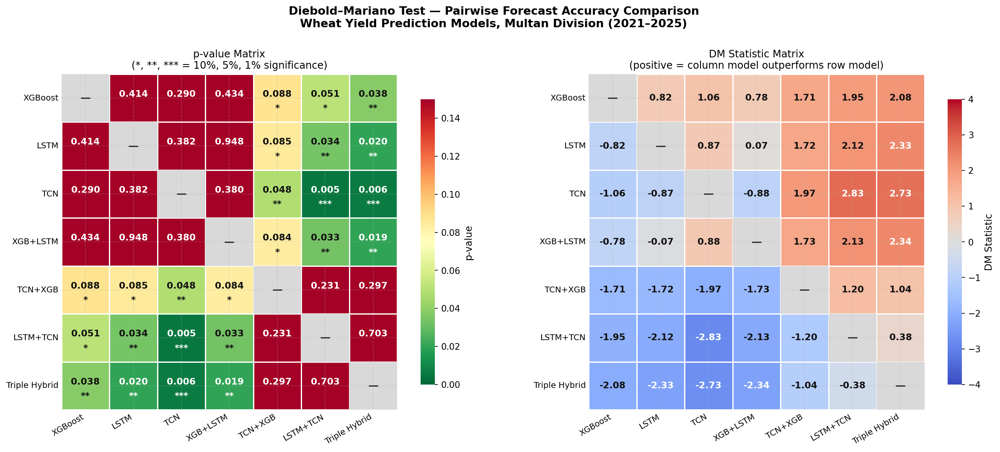

Caption: Figure. Diebold–Mariano (DM) pairwise test results for all seven models. Left: p-value matrix (*, **, *** denote significance at 10%, 5%, and 1%). Right: DM statistic matrix (positive values indicate the column model outperforms the row model).
Saved → /content/drive/MyDrive/Colab Notebooks/Professional_Plots_KgHa/Fig_DM_Test_Heatmap_2.png
✓ Improved DM heatmap saved as Fig_DM_Test_Heatmap_2


In [ ]:
# ============================================================
# CELL 7-v2 — DM TEST HEATMAP (improved readability)
# ============================================================

DM_NAME_MAP = {
    'XGBoost':'XGBoost','LSTM':'LSTM','TCN':'TCN',
    'XGB+LSTM Hybrid':'XGB+LSTM','TCN+XGB Hybrid':'TCN+XGB',
    'LSTM+TCN Hybrid':'LSTM+TCN','Triple Hybrid Ensemble':'Triple Hybrid',
    'XGB+LSTM':'XGB+LSTM','TCN+XGB':'TCN+XGB','LSTM+TCN':'LSTM+TCN',
    'Triple':'Triple Hybrid','SERWI Triple':'Triple Hybrid',
    'SERWI XGB+LSTM':'XGB+LSTM','SERWI TCN+XGB':'TCN+XGB',
    'SERWI LSTM+TCN':'LSTM+TCN',
}

dm = dm_results.copy()
dm['Benchmark']  = dm['Benchmark'].map(DM_NAME_MAP).fillna(dm['Benchmark'])
dm['Challenger'] = dm['Challenger'].map(DM_NAME_MAP).fillna(dm['Challenger'])
DM_LABELS = ['XGBoost','LSTM','TCN','XGB+LSTM','TCN+XGB','LSTM+TCN','Triple Hybrid']
n = len(DM_LABELS)

pval_matrix = pd.DataFrame(np.nan, index=DM_LABELS, columns=DM_LABELS)
stat_matrix = pd.DataFrame(np.nan, index=DM_LABELS, columns=DM_LABELS)
for _, row in dm.iterrows():
    b, c = row['Benchmark'], row['Challenger']
    if b in DM_LABELS and c in DM_LABELS:
        pval_matrix.loc[b,c] = row['p_value']
        pval_matrix.loc[c,b] = row['p_value']
        stat_matrix.loc[b,c] = row['DM_Statistic']
        stat_matrix.loc[c,b] = -row['DM_Statistic']

fig, axes = plt.subplots(1, 2, figsize=(17, 7))
fig.suptitle(
    'Diebold–Mariano Test — Pairwise Forecast Accuracy Comparison\n'
    'Wheat Yield Prediction Models, Multan Division (2021–2025)',
    fontsize=13, fontweight='bold'
)

# ── helper: pick readable text colour for a given cell value ──
def pval_text_color(p):
    # dark green (p→0) and dark red (p→0.15+) both need white text
    return 'white' if (p <= 0.03 or p >= 0.115) else '#111111'

def stat_text_color(s):
    # deep blue / deep red need white text
    return 'white' if abs(s) >= 2.2 else '#111111'

# ============================================================
# LEFT — p-value matrix
# ============================================================
ax1 = axes[0]
pval_plot = pval_matrix.copy()
np.fill_diagonal(pval_plot.values, np.nan)

sns.heatmap(pval_plot.astype(float), ax=ax1, cmap='RdYlGn_r',
            vmin=0, vmax=0.15,
            annot=False,                       # numbers added manually below
            linewidths=1.2, linecolor='white',
            xticklabels=DM_LABELS, yticklabels=DM_LABELS,
            cbar_kws={'label':'p-value', 'shrink':0.85},
            mask=pval_plot.isnull(), square=True)

for i, b in enumerate(DM_LABELS):
    for j, c in enumerate(DM_LABELS):
        if i == j:
            ax1.add_patch(plt.Rectangle((j,i),1,1,fill=True,color='#d9d9d9',lw=0))
            ax1.text(j+0.5, i+0.5, '—', ha='center', va='center',
                     fontsize=12, color='#333333', fontweight='bold')
            continue
        p = pval_matrix.loc[b, c]
        if np.isnan(p):
            continue
        stars = '***' if p<0.01 else ('**' if p<0.05 else ('*' if p<0.10 else ''))
        col = pval_text_color(p)
        ax1.text(j+0.5, i+0.42, f'{p:.3f}', ha='center', va='center',
                 fontsize=10.5, color=col, fontweight='bold')
        if stars:
            ax1.text(j+0.5, i+0.72, stars, ha='center', va='center',
                     fontsize=10, color=col, fontweight='bold')

ax1.set_title('p-value Matrix\n(*, **, *** = 10%, 5%, 1% significance)', fontsize=11.5)
ax1.set_xticklabels(DM_LABELS, rotation=30, ha='right', fontsize=9.5)
ax1.set_yticklabels(DM_LABELS, rotation=0, fontsize=9.5)
ax1.tick_params(length=0)

# ============================================================
# RIGHT — DM statistic matrix
# ============================================================
ax2 = axes[1]
stat_plot = stat_matrix.copy()
np.fill_diagonal(stat_plot.values, np.nan)

sns.heatmap(stat_plot.astype(float), ax=ax2, cmap='coolwarm',
            center=0, vmin=-4, vmax=4,
            annot=False,
            linewidths=1.2, linecolor='white',
            xticklabels=DM_LABELS, yticklabels=DM_LABELS,
            cbar_kws={'label':'DM Statistic', 'shrink':0.85},
            mask=stat_plot.isnull(), square=True)

for i, b in enumerate(DM_LABELS):
    for j, c in enumerate(DM_LABELS):
        if i == j:
            ax2.add_patch(plt.Rectangle((j,i),1,1,fill=True,color='#d9d9d9',lw=0))
            ax2.text(j+0.5, i+0.5, '—', ha='center', va='center',
                     fontsize=12, color='#333333', fontweight='bold')
            continue
        s = stat_matrix.loc[b, c]
        if np.isnan(s):
            continue
        ax2.text(j+0.5, i+0.5, f'{s:.2f}', ha='center', va='center',
                 fontsize=10.5, color=stat_text_color(s), fontweight='bold')

ax2.set_title('DM Statistic Matrix\n(positive = column model outperforms row model)', fontsize=11.5)
ax2.set_xticklabels(DM_LABELS, rotation=30, ha='right', fontsize=9.5)
ax2.set_yticklabels(DM_LABELS, rotation=0, fontsize=9.5)
ax2.tick_params(length=0)

plt.tight_layout(rect=[0, 0, 1, 0.94])
caption = ('Figure. Diebold–Mariano (DM) pairwise test results for all seven models. '
           'Left: p-value matrix (*, **, *** denote significance at 10%, 5%, and 1%). '
           'Right: DM statistic matrix (positive values indicate the column model '
           'outperforms the row model).')
save_fig(fig, 'Fig_DM_Test_Heatmap_2', caption)
print('✓ Improved DM heatmap saved as Fig_DM_Test_Heatmap_2')